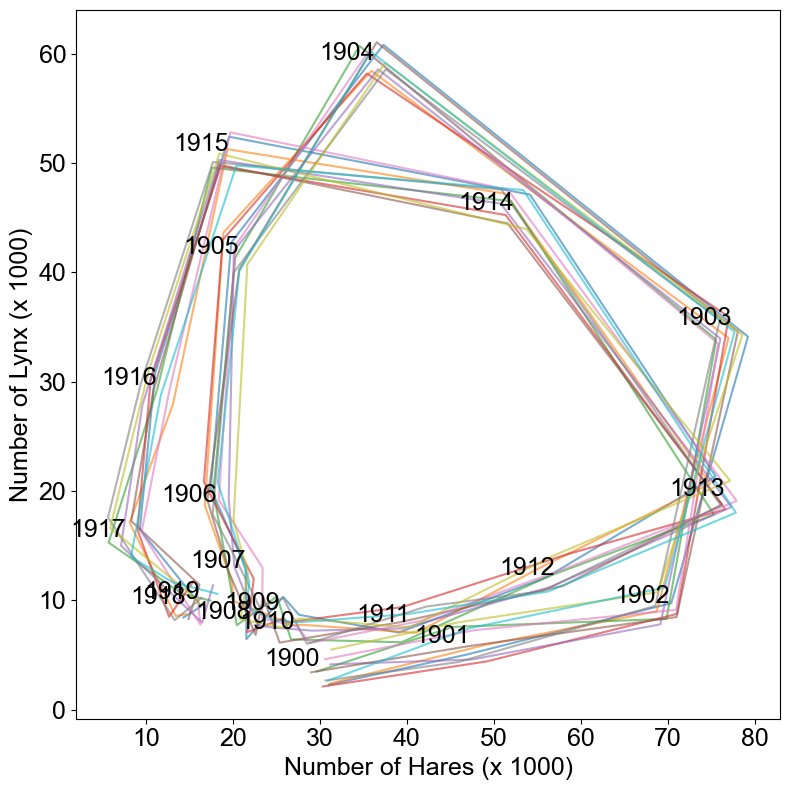

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Original dataset
data = pd.DataFrame({
    'Year': np.arange(1900, 1920),
    'Hares': [30, 47.2, 70.2, 77.4, 36.3, 20.6, 18.1, 21.4, 22.0, 25.4, 27.1, 40.3, 57.0, 76.6, 52.3, 19.5, 11.2, 7.6, 14.6, 16.2],
    'Lynx': [4.0, 6.1, 9.8, 35.2, 59.4, 41.7, 19.0, 13.0, 8.3, 9.1, 7.4, 8.0, 12.3, 19.5, 45.7, 51.1, 29.7, 15.8, 9.7, 10.1]
})

# Number of different datasets
num_datasets = 10

# Create a list to store all generated datasets
datasets = []

# Generate 10 different datasets by adding/subtracting random values from a uniform distribution [-5, 5]
for i in range(num_datasets):
    random_hares = data['Hares'] + np.random.uniform(-2, 2, len(data))
    random_lynx = data['Lynx'] + np.random.uniform(-2, 2, len(data))
    datasets.append(pd.DataFrame({'Year': data['Year'], 'Hares': random_hares, 'Lynx': random_lynx}))

# Plotting all 10 datasets on a single figure
plt.figure(figsize=(8, 8))

for i, dataset in enumerate(datasets):
    plt.plot(dataset['Hares'], dataset['Lynx'], '-', label=f'Dataset {i+1}', alpha=0.6)


for i, year in enumerate(data['Year']):
    plt.text(data['Hares'][i], data['Lynx'][i], str(year), fontsize=18, fontname='Arial', ha='right')

# Plot formatting
plt.xlabel('Number of Hares (x 1000)', fontsize=18, fontname='Arial')
plt.ylabel('Number of Lynx (x 1000)', fontsize=18, fontname='Arial')
# plt.title('Lynx vs Hares Population with Random Variations', fontsize=18, fontname='Arial')

# Set the font for ticks
plt.xticks(fontsize=18, fontname='Arial')
plt.yticks(fontsize=18, fontname='Arial')

# Add grid
# plt.grid(True)

# Add a legend
# plt.legend(title='Random Datasets', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()


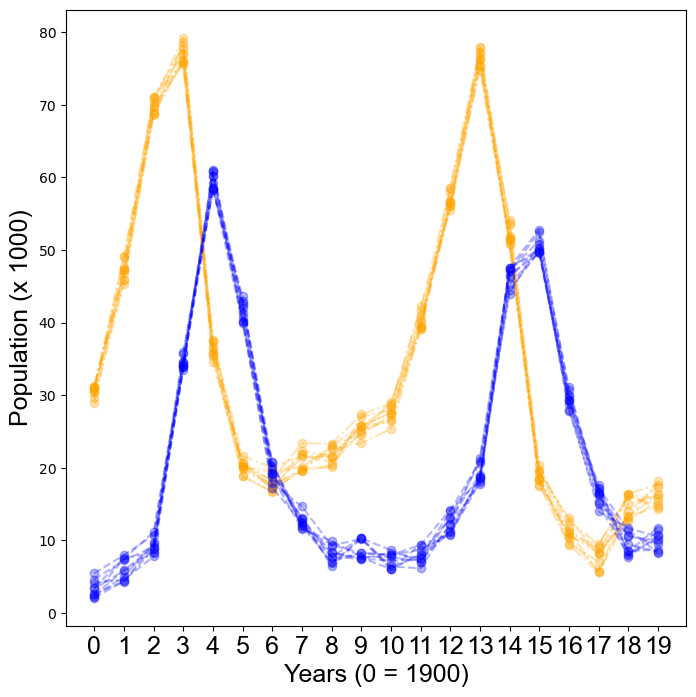

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random colors for each dataset
colors = plt.cm.viridis(np.linspace(0, 1, len(datasets)))  # Or any other colormap like 'plasma', 'inferno', etc.

plt.figure(figsize=(8, 8))

# Plot prey (hares) against integer years
for i, dataset in enumerate(datasets):
    plt.plot(np.arange(len(dataset['Year'])), dataset['Hares'], '-.o', color='orange', alpha=0.3)

# Plot predator (lynx) against integer years
for i, dataset in enumerate(datasets):
    plt.plot(np.arange(len(dataset['Year'])), dataset['Lynx'], '--o', color='blue', alpha=0.3)#colors[i]

# Set the x-ticks to integers representing years
plt.xticks(ticks=np.arange(0, len(data['Year']), 1), fontsize=18, fontname='Arial')

# Add labels
plt.xlabel('Years (0 = 1900)', fontsize=18, fontname='Arial')
plt.ylabel('Population (x 1000)', fontsize=18, fontname='Arial')

# Show plot
plt.show()


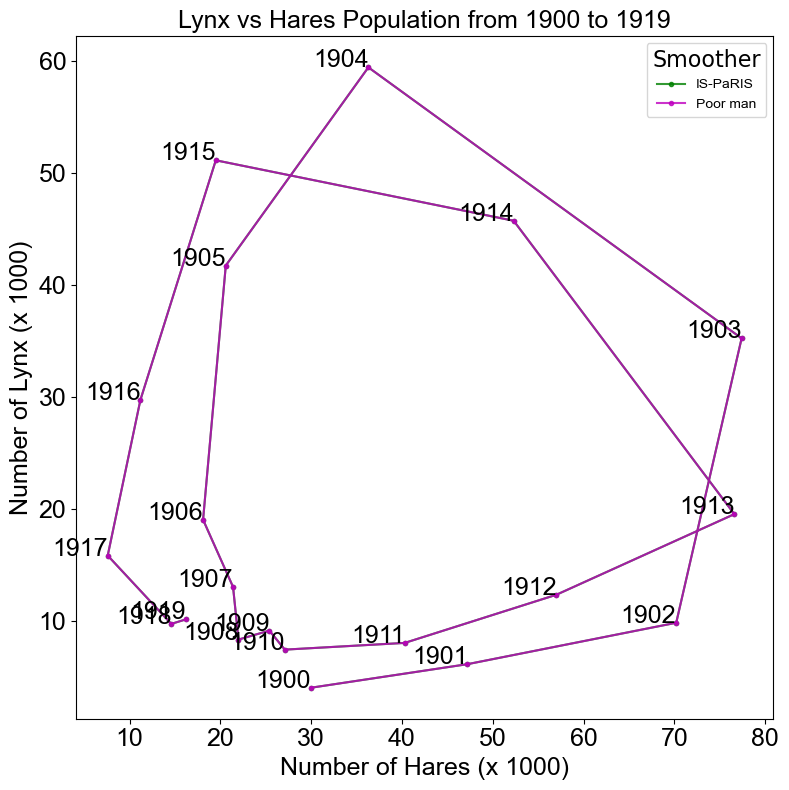

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.font_manager import FontProperties

# Load the Hudson Bay lynx-hare dataset
# Assume the dataset is in a CSV file or list form with two columns: 'Hares' and 'Lynx'
# You can replace this with the path to your dataset if it's a CSV file.
data = pd.DataFrame({
    'Year': np.arange(1900, 1920),
    'Hares': [30, 47.2, 70.2, 77.4, 36.3, 20.6, 18.1, 21.4, 22.0, 25.4, 27.1, 40.3, 57.0, 76.6, 52.3, 19.5, 11.2, 7.6, 14.6, 16.2],
    'Lynx': [4.0, 6.1, 9.8, 35.2, 59.4, 41.7, 19.0, 13.0, 8.3, 9.1, 7.4, 8.0, 12.3, 19.5, 45.7, 51.1, 29.7, 15.8, 9.7, 10.1]
})

# Set up the figure
plt.figure(figsize=(8, 8))

# Plotting the two methods (assuming IS-PaRIS and Poor man are from different methods)
# Generating some sample points and lines as placeholders for the different methods
# Green for IS-PaRIS, Pink for Poor man
plt.plot(data['Hares'], data['Lynx'], 'g.-', label='IS-PaRIS', alpha=0.8)
plt.plot(data['Hares'], data['Lynx'], 'm.-', label='Poor man', alpha=0.8)

# Annotate the years at relevant points
for i, year in enumerate(data['Year']):
    plt.text(data['Hares'][i], data['Lynx'][i], str(year), fontsize=18, fontname='Arial', ha='right')

# Labels and Title
plt.xlabel('Number of Hares (x 1000)', fontsize=18, fontname='Arial')
plt.ylabel('Number of Lynx (x 1000)', fontsize=18, fontname='Arial')
plt.title('Lynx vs Hares Population from 1900 to 1919', fontsize=18, fontname='Arial')

# Customizing the legend
plt.legend(title='Smoother', fontsize=14, title_fontsize=16, prop={'family': 'Arial'})

# Set the font for all ticks and axes
plt.xticks(fontsize=18, fontname='Arial')
plt.yticks(fontsize=18, fontname='Arial')

# Grid and show plot
# plt.grid(True)
plt.tight_layout()
plt.show()


## Import functions

In [15]:
import sys
import os
import inspect

# Assuming your scripts directory is one level up from the notebooks directory
sys.path.append(os.path.abspath("../Scripts"))
sys.path.append(os.path.abspath("../Scripts/sunode-master"))


import importlib
import my_functions as mf
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from scipy.stats import gaussian_kde
import autograd.numpy as anp 
import sampyl as smp
from scipy.integrate import odeint
import pandas as pd
# import sunode.wrappers.as_pytensor as sun
from my_functions import *
from scipy.integrate import solve_ivp
import pysindy as ps

importlib.reload(mf)
functions_list = inspect.getmembers(mf, inspect.isfunction)
# Print the names of the functions
Fnc_nms = [function[0] for function in functions_list]
Fnc_nms

['Hudson_bay_data',
 'calculate_noise_statistics',
 'defvjp',
 'estimate_noise_statistics',
 'expand_2D_array',
 'gaussian_process_interpolation',
 'generate_samples',
 'grad_safe_sqrt',
 'load_csv_to_array',
 'mean_squared_error',
 'odeint',
 'plot_kde_matrix',
 'plot_paths',
 'primitive',
 'safe_sqrt',
 'safe_std',
 'save_array_to_csv',
 'set_publcn_matplotlib_defaults']

## Load in data

In [18]:
mf.set_publcn_matplotlib_defaults()

In [19]:
# Load actual data from function
hare, lynx, u_scale, v_scale, years_ = mf.Hudson_bay_data(False)  
x_noisy = np.column_stack([hare, lynx])
scale = np.array(u_scale, v_scale)

In [21]:
utrue, vtrue = [0,0.55,0,-0.455, 0,0,0,0],[ 0,0,-0.84,0.543,0,0,0,0]
usip, vsip = [-0.03, 0.59, 0.03, -0.44, 0.01, 0.01, 0.003, 0.005],[0.03,0.03,-1.0,0.55,0.003,0.002,0.002,0.001]
ubayes,vbayes = [-0.1,0.64,0.05,-0.47,0.02,0.013,0.016,0.01],[0.08,-0.03,-0.96,0.56,0.016,0.014,0.018,0.011]
usindy,vsindy = [0,0.486,0,-0.36,0,0,0,0],[0, 0.21, -1.114,0.31,0,0,0,0]



u_sip_mse = mean_squared_error(utrue, usip)
u_bayes_mse = mean_squared_error(utrue, ubayes)
u_sindy_mse = mean_squared_error(utrue, usindy)

v_sip_mse = mean_squared_error(vtrue, vsip)
v_bayes_mse = mean_squared_error(vtrue, vbayes)
v_sindy_mse = mean_squared_error(vtrue, vsindy)

print(safe_sqrt(u_sip_mse),safe_sqrt(u_sindy_mse),safe_sqrt(u_bayes_mse), '\n\n')
print(safe_sqrt(v_sip_mse),safe_sqrt(v_sindy_mse),safe_sqrt(v_bayes_mse),)

0.02196303713059738 0.04049845676072116 0.05214163403653552 


0.05859500831982193 0.14725191000459048 0.05348597947125957


## SINDy Learning

(x0)' = 0.486 x0 + -0.360 x0 x1
(x1)' = 0.210 x0 + -1.114 x1 + 0.307 x0 x1 + 0.158 x1^2
[[ 0.          0.48565889  0.          0.         -0.35998892  0.        ]
 [ 0.          0.21044179 -1.11368077  0.          0.30680775  0.15750437]]


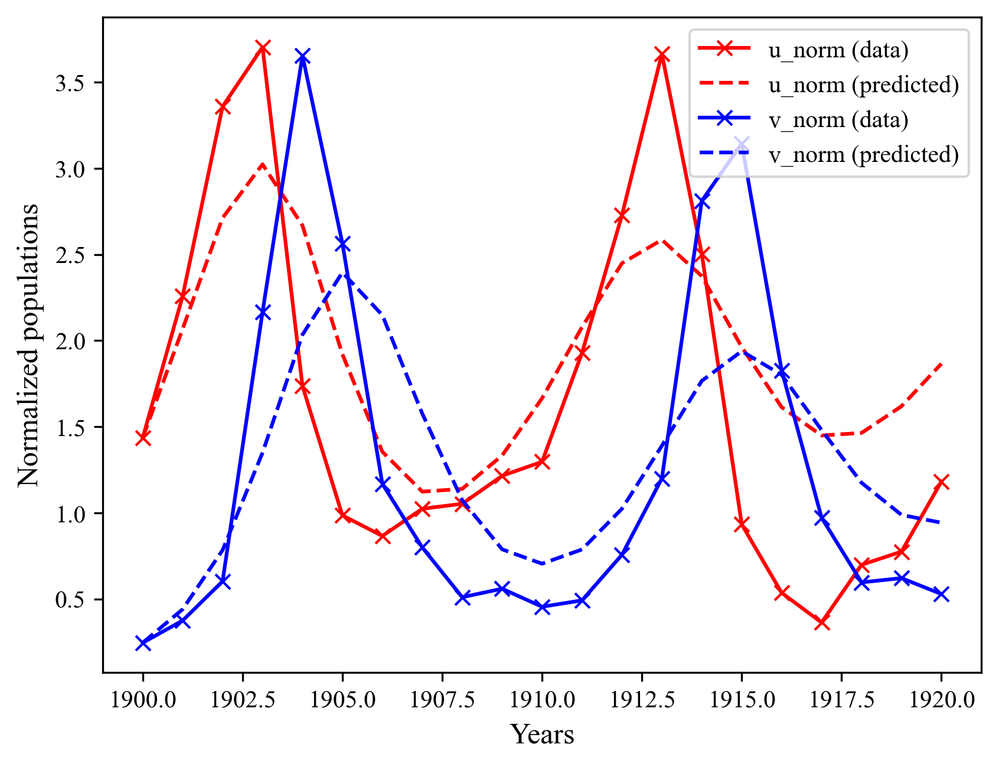

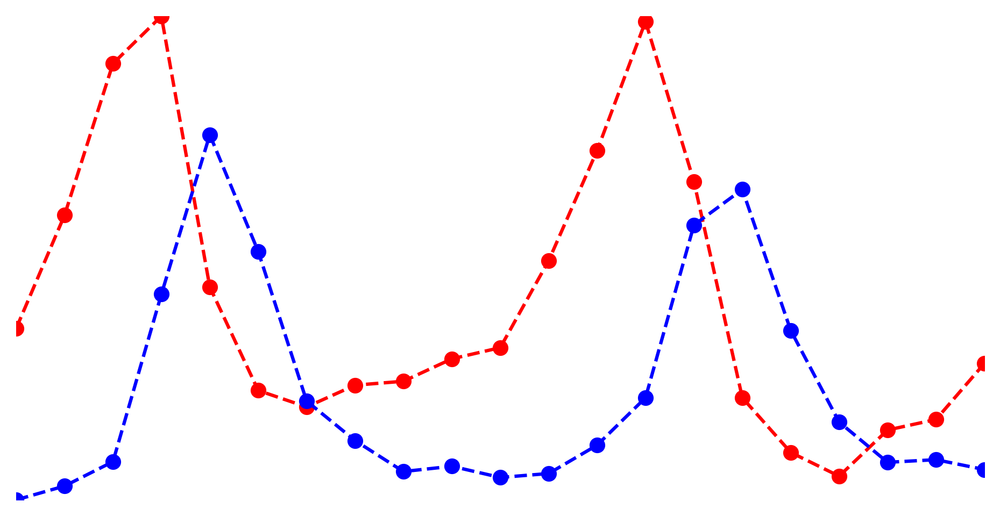

In [23]:
# Prepare and scale data
u_data = np.array(hare)
v_data = np.array(lynx)
u_scale = np.std(u_data)
v_scale = np.std(v_data)

u_norm = u_data / u_scale
v_norm = v_data / v_scale

# Fit SINDy model
dt = years_[1] - years_[0]  # Assuming evenly spaced years

# Combine normed data
X = np.column_stack([u_norm, v_norm])


# Define the SINDy model with quadratic library
poly_order = 2
library = ps.PolynomialLibrary(degree=poly_order)
threshold = 0.1
model = ps.SINDy(optimizer=ps.STLSQ(threshold=threshold), feature_library=library)

# model = ps.SINDy(feature_library=library)
model.fit(X, t=dt)
model.print()

# Predict and plot
x_pred = model.simulate(X[0], t=np.arange(0, len(years_)*dt, dt))
x_pred_actual = x_pred*scale

# Get, save and print the learned coefficients from SINDy
hudson_sindy_coeffs = model.coefficients()
print(hudson_sindy_coeffs)

#Store important data
save_array_to_csv(x_noisy, 'hudson_observed.csv')
save_array_to_csv(hudson_sindy_coeffs, 'hudson_sindy_coeffs.csv')
save_array_to_csv(x_pred, 'hudson_sindy_pred.csv')

plt.figure()
plt.plot(years_, u_norm, 'r-x', label='u_norm (data)')
plt.plot(years_, x_pred[:, 0], 'r--', label='u_norm (predicted)')
plt.plot(years_, v_norm, 'b-x', label='v_norm (data)')
plt.plot(years_, x_pred[:, 1], 'b--', label='v_norm (predicted)')
plt.xlabel('Years')
plt.ylabel('Normalized populations')
plt.legend()
plt.show()

years_ = np.array(years_)

years__ = np.arange(years_.shape[0])
# Set font family to Arial
plt.rcParams['font.family'] = 'Arial'
plt.figure(figsize = (6,3))
plt.plot(years__, hare, 'r--o', label='hare') #(data)
# plt.plot(years_, x_pred_actual[:, 0], color = 'orange', linestyle = '-.', label='hare (Sparse)')
plt.plot(years__, lynx, 'b--o', label='lynx') #(data)
# plt.plot(years_, x_pred_actual[:, 1], color = 'turquoise', linestyle = '-.', label='lynx (Sparse)')
# plt.xlabel('Years (0 = 1900)', fontsize=18)#, rotation=45)
# plt.ylabel('Populations', fontsize=18)#, rotation=45)
# Rotate x-tick values by 45 degrees

# plt.xticks( fontsize=26, rotation=0) #rotation=45,
# plt.yticks(fontsize=26)
# # Adjust layout to ensure everything is visible
# plt.tight_layout()
# plt.legend(fontsize=22)

# # Set x and y labels
# plt.xlabel('Years (0 = 1900)', fontsize=28)
# plt.ylabel('Populations', fontsize=28)

# # Ensure x-ticks are integers
# plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 2))
# plt.show()

# Remove axis ticks and labels
plt.axis('off')

# Optional: remove padding
plt.margins(0)
plt.tight_layout(pad=0)

plt.show()


## Data preparation for SIP and UQSINDy Learning

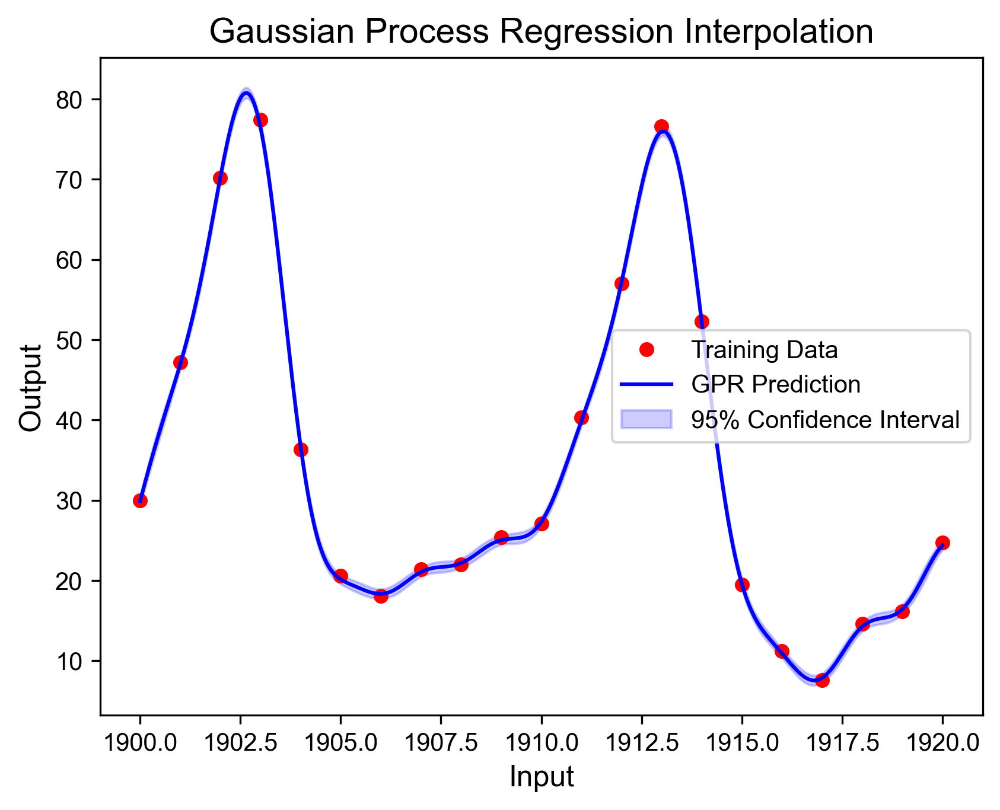

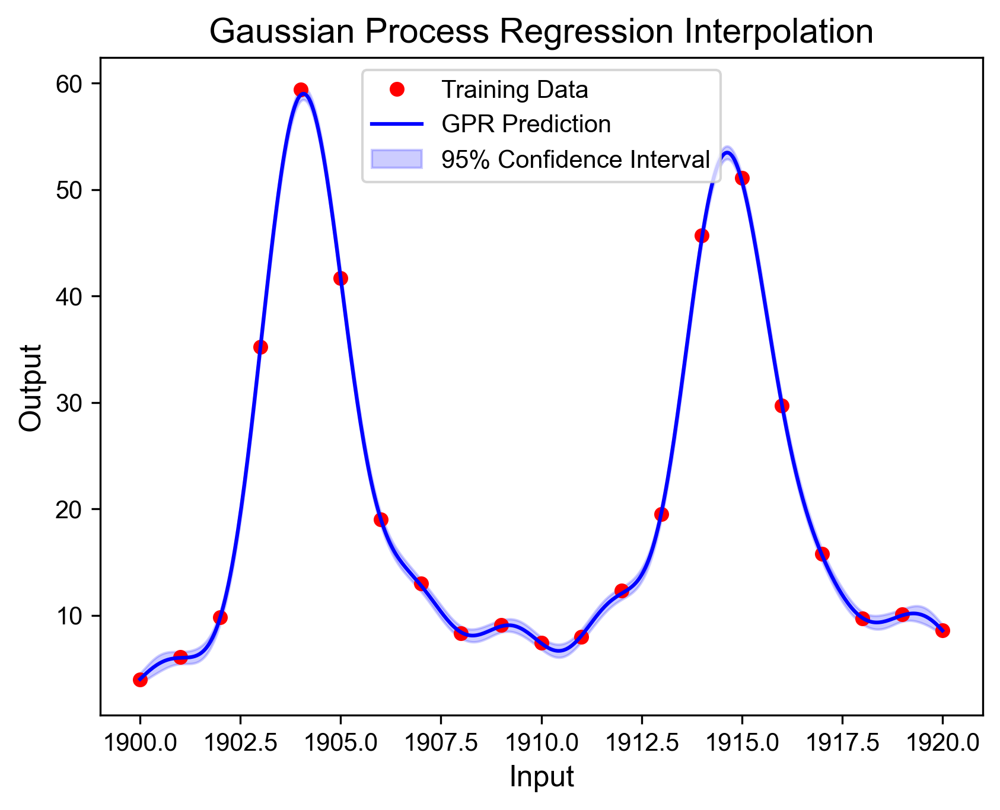

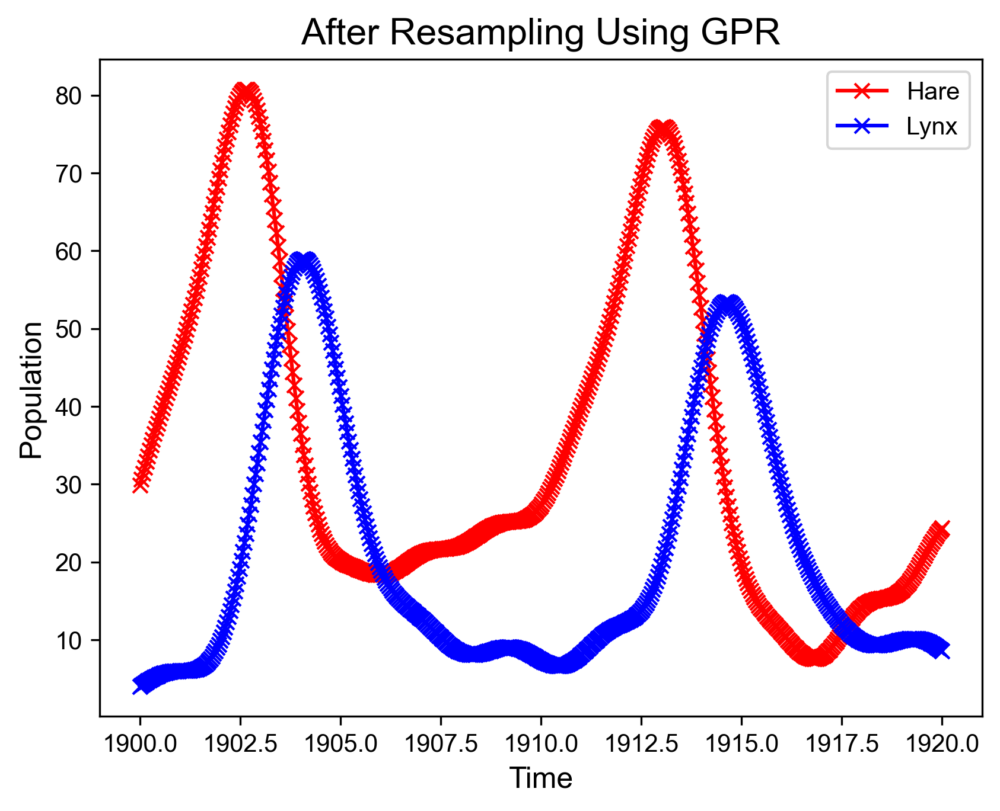

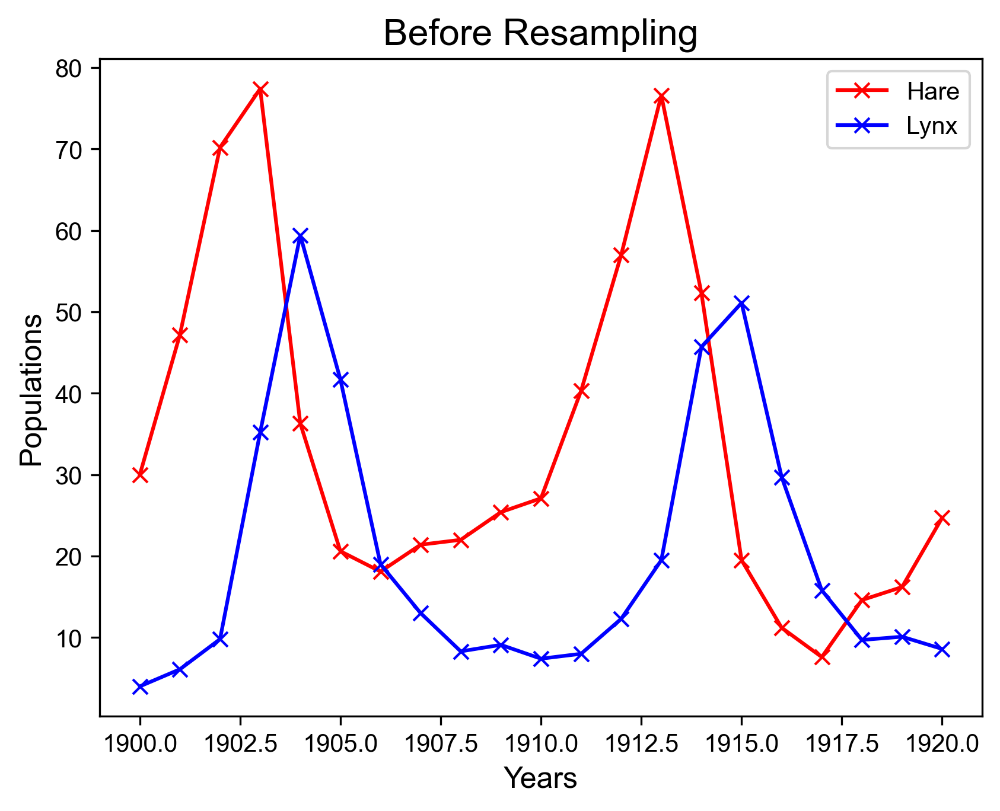

In [25]:
#Upsample data using gaussian process regression
num_points = 500
alpha = 0.3
years_new, hare_new = gaussian_process_interpolation(years_, hare, num_points,  noise_level=alpha)
years_new, lynx_new = gaussian_process_interpolation(years_, lynx, num_points,  noise_level=alpha)
years = years_new.reshape(-1)

# Prepare data for learning ease
u_data =  np.array(hare_new).reshape(-1)
v_data = np.array(lynx_new).reshape(-1)
v_data = np.array(lynx_new)
u_scale = np.std(u_data)
v_scale = np.std(v_data)

#scale data for learning purpose
u_norm = u_data/u_scale
v_norm = v_data/v_scale


# Plot scaled data
plt.figure()
plt.title('After Resampling Using GPR', fontsize = 15)
plt.plot(years, u_data,'r-x', label='Hare')
plt.plot(years, v_data, 'b-x',label='Lynx')

plt.xlabel('Time')
plt.ylabel('Population')
plt.legend()
plt.show()

#plot actual data
plt.title('Before Resampling', fontsize = 15)
plt.plot(years_, hare, 'r-x',label = 'Hare')
plt.plot(years_, lynx, 'b-x',label = 'Lynx')
plt.legend()
plt.xlabel(f'Years')
plt.ylabel(f'Populations')
plt.show()

### Simulate test functions

In [30]:
# Lotka-Volterra model equations
def lotka_volterra_system(state, t, alpha, beta, delta, gamma):
    x, y = state
    dx_dt = alpha * x + beta * x * y
    dy_dt = delta * x * y + gamma * y
    return [dx_dt, dy_dt]

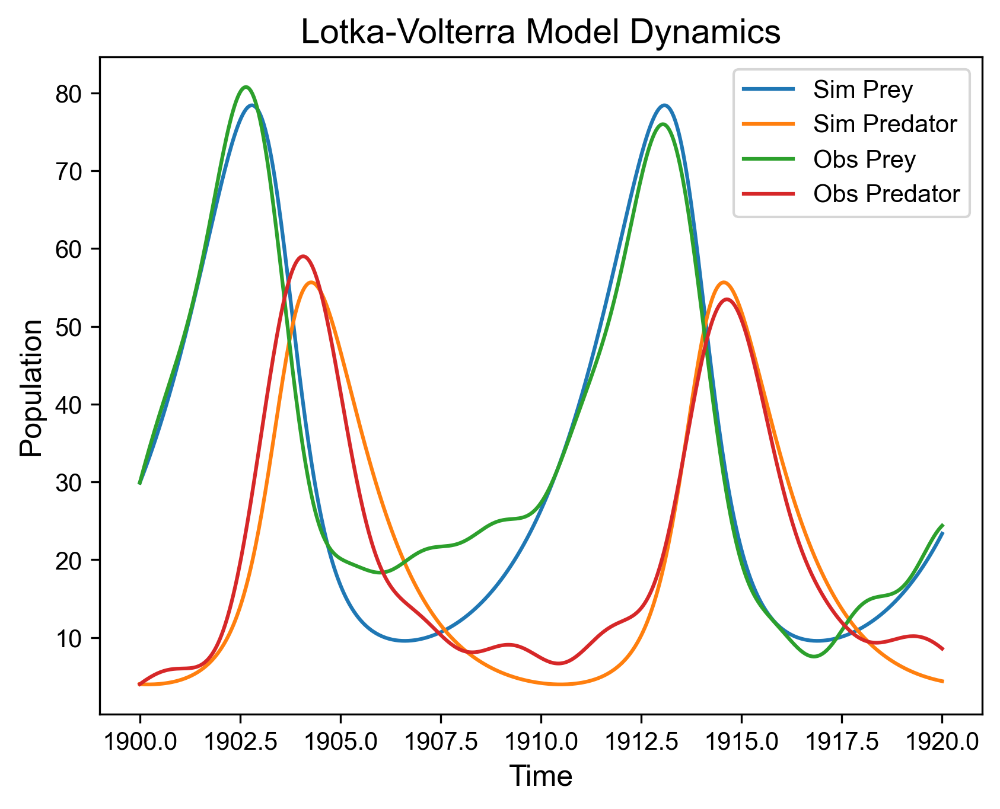

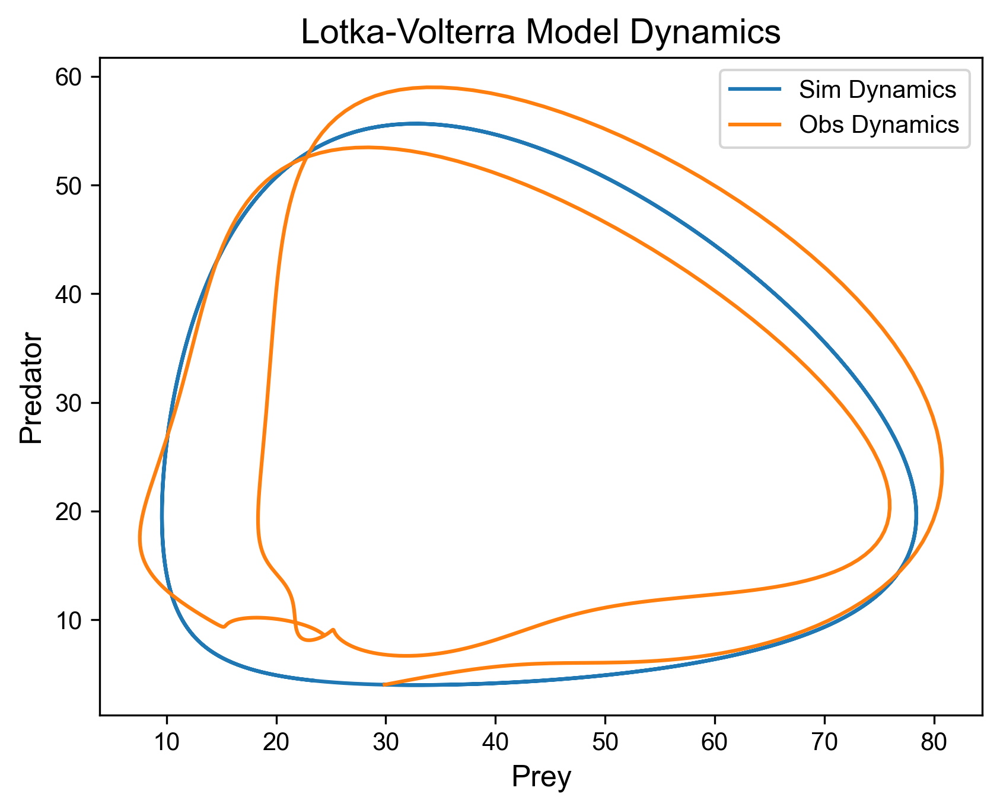

In [32]:
#General parameters
num_points = len(years)

# simulation Parameters
alpha = 0.55
beta = -0.455
delta = 0.5433
gamma = -0.84
params = (alpha, beta, delta, gamma)

# params = (0.39396811, -0.01850895,  0.0156399, -0.53858506)
# params = (0.42299561, -0.01941126,  0.01715028, -0.60961939)

# Initial conditions
u0 = u_norm[0] #1.324 
v0 = v_norm[0] #0.273
initial_state = [u0, v0] #[27.67, 4.43]#

# Time points
time = np.array(years,dtype=float)
t = time

# Solve ODE
solution = odeint(lotka_volterra_system, initial_state, time, args=params)
u_sim, v_sim = solution.T
u_sim,v_sim = u_sim*u_scale, v_sim*v_scale    

# plot and compare simulation versus observed data
plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
plt.plot(t, u_sim, label='Sim Prey')
plt.plot(t, v_sim, label='Sim Predator')
plt.plot(t, u_data, label='Obs Prey')
plt.plot(t, v_data, label='Obs Predator')

plt.xlabel('Time')
plt.ylabel('Population')
plt.legend()
plt.show()

plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
plt.plot(u_sim, v_sim, label='Sim Dynamics')
plt.plot(u_data, v_data, label='Obs Dynamics')

plt.xlabel('Prey')
plt.ylabel('Predator')
plt.legend()
plt.show()

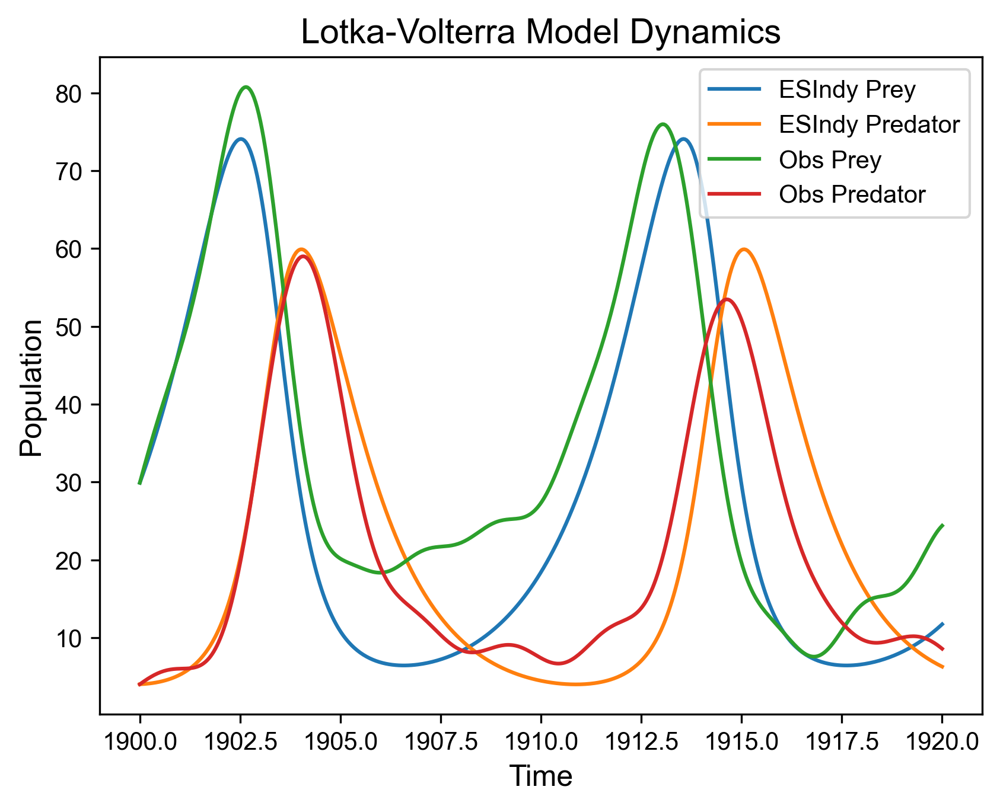

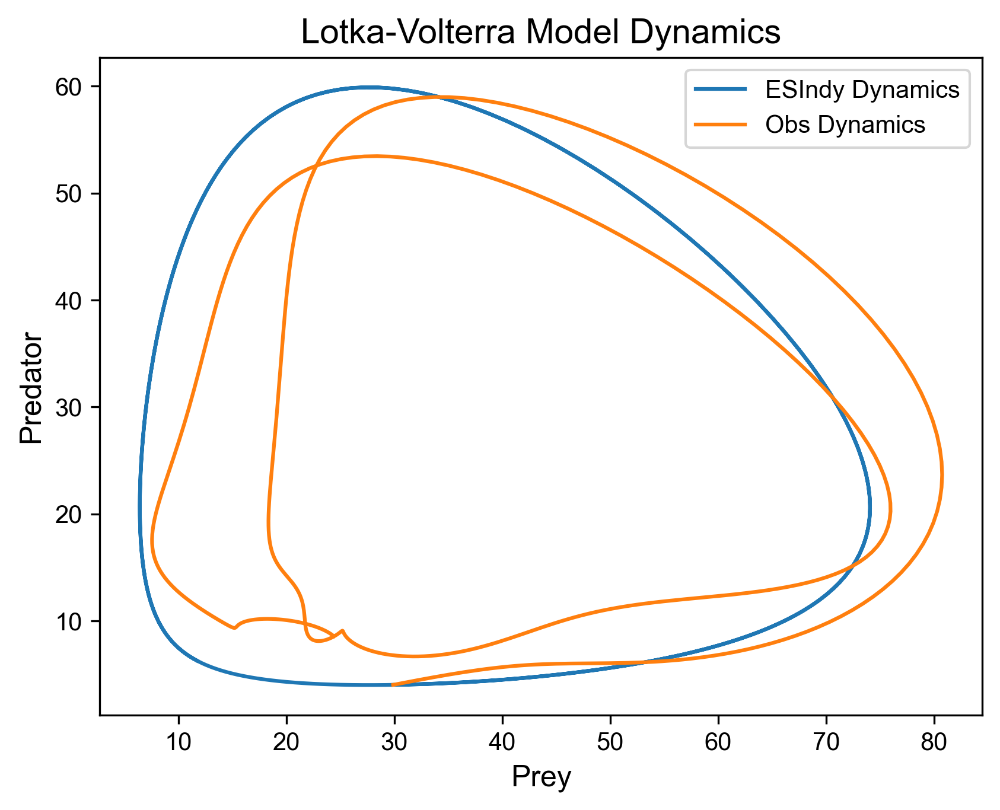

In [81]:
# (x0)' = 0.486 x0 + -0.360 x0 x1
# (x1)' = -0.708 x1 + 0.417 x0 x1

#General parameters
num_points = len(years)

# simulation Parameters
alpha = 0.586
beta = -0.460
delta = 0.5417
gamma = -0.708
params = (alpha, beta, delta, gamma)

# Initial conditions
u0 = u_norm[0] #1.324 
v0 = v_norm[0] #0.273
initial_state = [u0, v0] #[27.67, 4.43]#


# Solve ODE
solution_ESIndy = odeint(lotka_volterra_system, initial_state, time, args=params)
u_ESIndy, v_ESIndy = solution_ESIndy.T
u_ESIndy,v_ESIndy = u_ESIndy*u_scale, v_ESIndy*v_scale    

# plot and compare simulation versus observed data
plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
plt.plot(t, u_ESIndy, label='ESIndy Prey')
plt.plot(t, v_ESIndy, label='ESIndy Predator')
plt.plot(t, u_data, label='Obs Prey')
plt.plot(t, v_data, label='Obs Predator')

plt.xlabel('Time')
plt.ylabel('Population')
plt.legend()
plt.show()

plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
plt.plot(u_ESIndy, v_ESIndy, label='ESIndy Dynamics')
plt.plot(u_data, v_data, label='Obs Dynamics')

plt.xlabel('Prey')
plt.ylabel('Predator')
plt.legend()
plt.show()

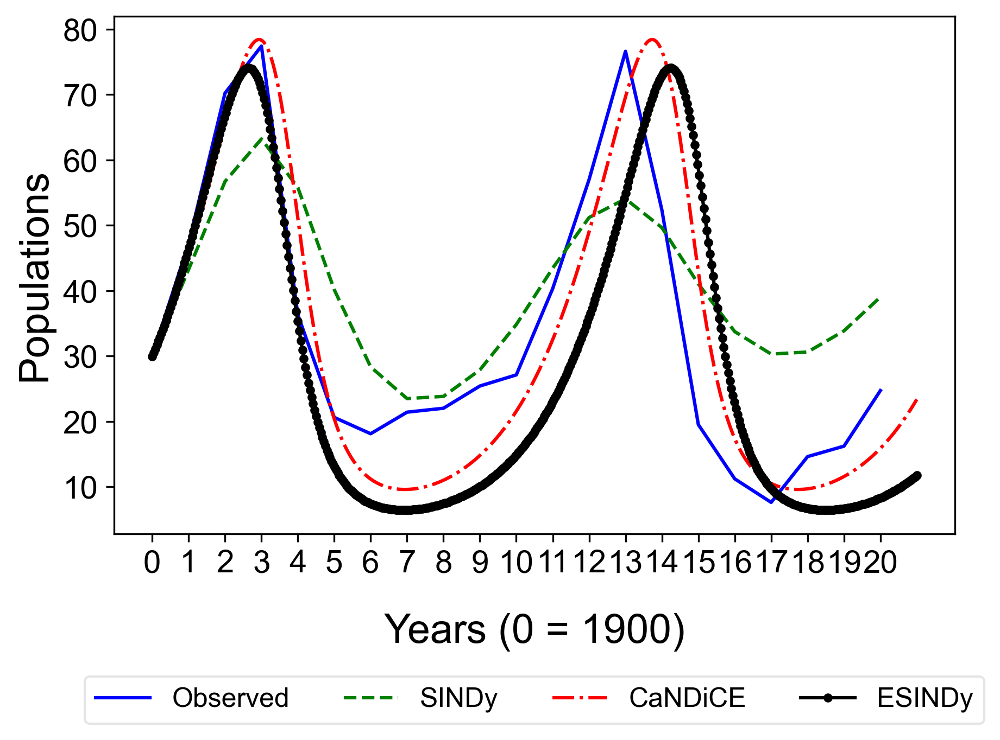

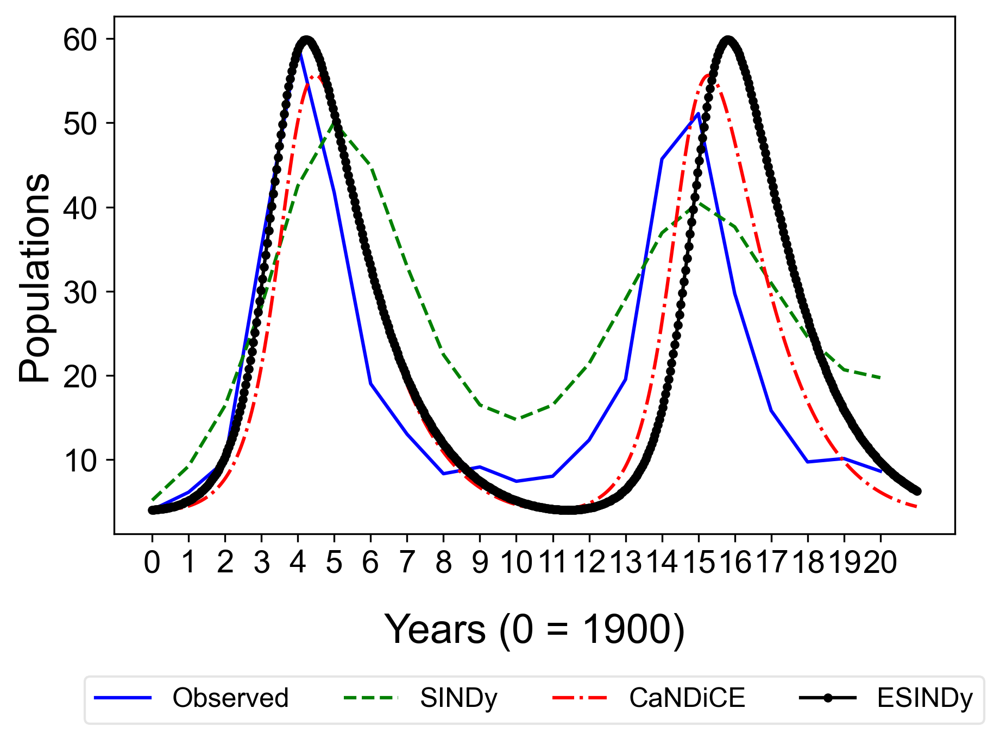

In [102]:
import numpy as np
import matplotlib.pyplot as plt

years__ = np.arange(years_.shape[0])

# Set font family to Arial
plt.rcParams['font.family'] = 'Arial'
plt.figure()

# Plotting hare and lynx data
plt.plot(years__, hare, 'b-', label='Observed')
plt.plot(years__, x_pred_actual[:, 0], color = 'green', linestyle = '--', label='SINDy')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_sim, color = 'red', linestyle = '-.', label='CaNDiCE')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_ESIndy, 'k.-', label='ESINDy')

# Set x and y labels
# Set x and y labels with increased padding for x-axis
plt.xlabel('Years (0 = 1900)', fontsize=18, labelpad=15)  # Increased labelpad
plt.ylabel('Populations', fontsize=18)

# Ensure x-ticks are integers
plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 1))

# Set font size for ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Move legend to bottom center with spacing
plt.legend(
    fontsize=12,
    loc='upper center',           # Use upper center as anchor point
    bbox_to_anchor=(0.5, -0.25), # Position 25% below axes (in axes coordinates)
    ncol=4,                      # Single column layout
    framealpha=0.5
)

# First adjust layout without legend
plt.tight_layout()

# Then manually adjust bottom margin to accommodate legend (30% of figure height)
plt.subplots_adjust(bottom=0.3)

plt.show()



years__ = np.arange(years_.shape[0])

# Set font family to Arial
plt.rcParams['font.family'] = 'Arial'
plt.figure()

plt.plot(years__, lynx, 'b-', label='Observed')
plt.plot(years__, x_pred_actual[:, 1], color = 'green', linestyle = '--', label='SINDy')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_sim, color = 'red', linestyle = '-.', label='CaNDiCE')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_ESIndy, 'k.-', label='ESINDy')


# Set x and y labels with increased padding for x-axis
plt.xlabel('Years (0 = 1900)', fontsize=18, labelpad=15)  # Increased labelpad
plt.ylabel('Populations', fontsize=18)

# Ensure x-ticks are integers
plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 1))

# Set font size for ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Move legend to bottom center with spacing
plt.legend(
    fontsize=12,
    loc='upper center',           # Use upper center as anchor point
    bbox_to_anchor=(0.5, -0.25), # Position 25% below axes (in axes coordinates)
    ncol=4,                      # Single column layout
    framealpha=0.5
)

# First adjust layout without legend
plt.tight_layout()

# Then manually adjust bottom margin to accommodate legend (30% of figure height)
plt.subplots_adjust(bottom=0.3)

plt.show()



### Agnostic Learning functions

In [35]:
def generate_library(x,y):
    x= np.array(x)
    y = np.array(y)
    lib_mat = np.array([np.ones(len(x)), x, y, x*y]).T
    return lib_mat

def simulate_param(params, library):
    params = np.array(params).reshape(-1,1)
    return np.dot(library, params).reshape(-1)

def integrate_x_dot(x_dot, t, init_val):
    """
    Integrates x_dot with respect to time t using the cumulative trapezoidal rule.

    Parameters:
    - x_dot: Array of derivative values with respect to time (velocity if x is position).
    - t: Array of time values.

    Returns:
    - x: Array of integrated values (position if x_dot is velocity), same length as t by adding initial condition.
    """
    # Compute the cumulative integral of x_dot with respect to t
    x = cumulative_trapezoid(x_dot, t, initial=0)+init_val  # Set initial=0 to include the starting point in the result array

    return x

def numerate_param(param, library, init_val, t=t):
    z_dot = simulate_param(param, library)
    z_intgrt = integrate_x_dot(z_dot, t, init_val)
    return z_intgrt

import pysindy as ps
# differentiation function
def differentiate(data,time, wl = 5, order = 3):
    smoothed_fd = ps.SmoothedFiniteDifference(order=order, smoother_kws={'window_length': wl})
    dldt = smoothed_fd(data,time)
    d2ldt = smoothed_fd(dldt, time)
    d3ldt = smoothed_fd(d2ldt, time)
    return [dldt,d2ldt,d3ldt] 

MSE value = (0.05510755270037809, 0.085248866888967)


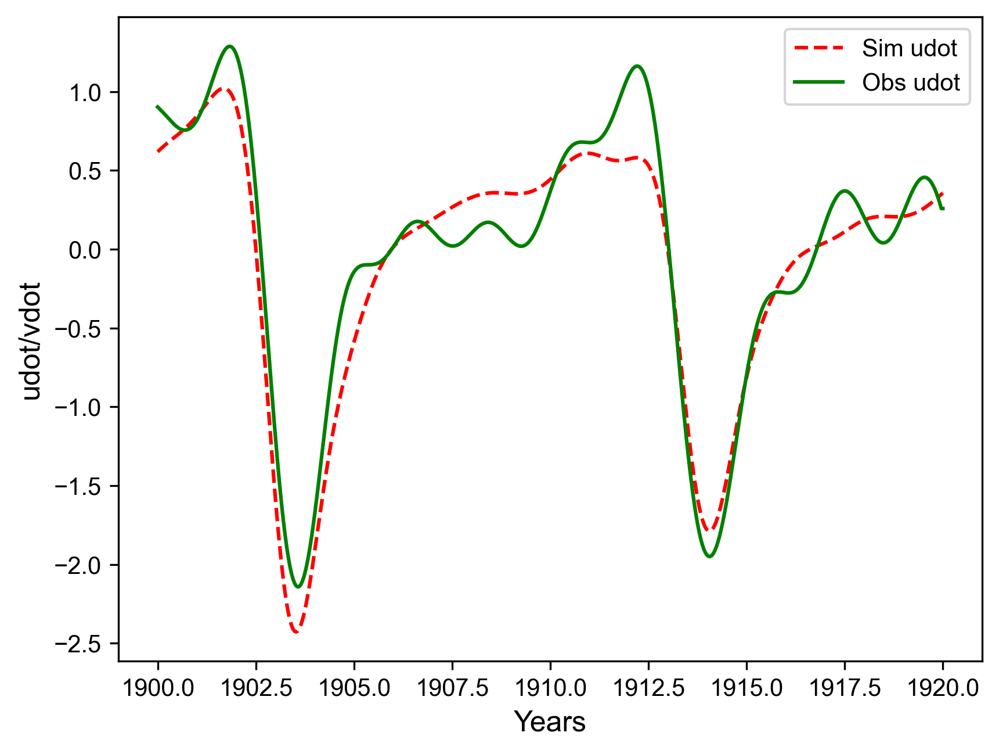

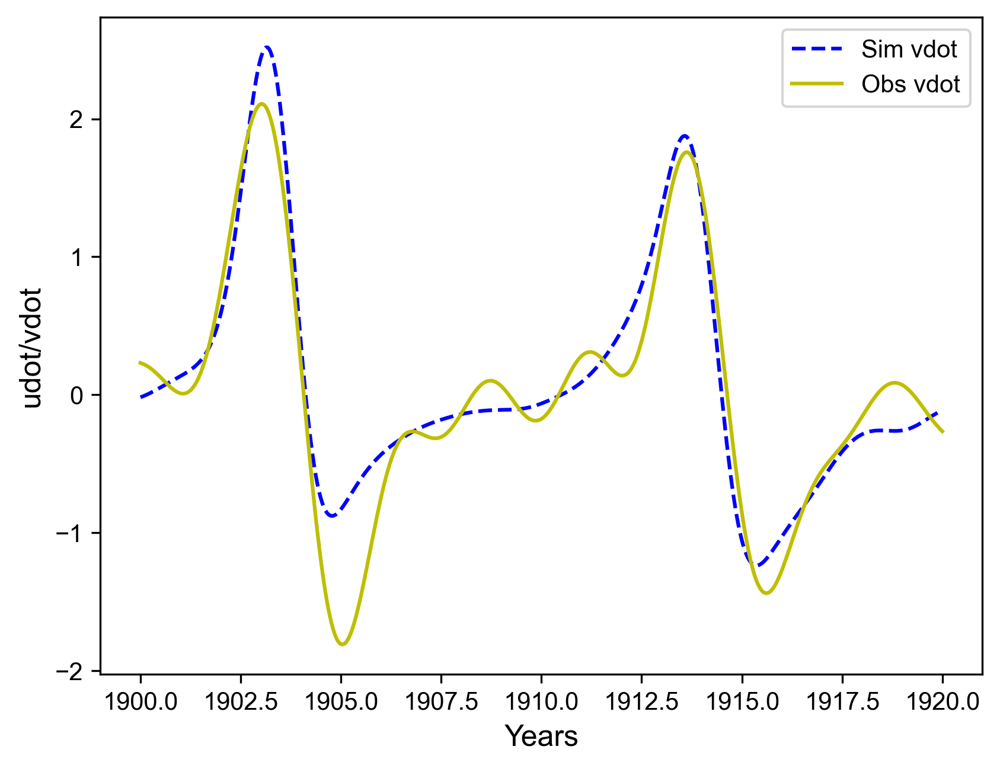

In [37]:
# Generate library data
library = generate_library(u_norm, v_norm)

# Define true parameters
u_param_true = [0,0.55,0,-0.455]
v_param_true = [0,0,-0.84,0.5433]

# Simulate x_dot and v_dot
u_dot_true = simulate_param(u_param_true, library)
v_dot_true = simulate_param(v_param_true, library)

u_dot_noisy =  differentiate(u_norm, time, wl = 13, order=1)[0]
v_dot_noisy = differentiate(v_norm, time, wl = 11, order=2)[0]

# compute the mse value
u_mse =  mean_squared_error(u_dot_true,u_dot_noisy)
v_mse =  mean_squared_error(v_dot_true,v_dot_noisy)
print(f'MSE value = {u_mse, v_mse}')

# plot the numerical differentiation and predicted
plt.plot(t, u_dot_true, 'r--', label = 'Sim udot')
plt.plot(t, u_dot_noisy, 'g', label = 'Obs udot')
plt.legend()
plt.xlabel(f'Years')
plt.ylabel(f'udot/vdot')
plt.show()


plt.plot(t, v_dot_true, 'b--', label = 'Sim vdot')
plt.plot(t, v_dot_noisy, 'y', label = 'Obs vdot')
plt.legend()
plt.xlabel(f'Years')
plt.ylabel(f'udot/vdot')
plt.show()

## SIP Learning

In [36]:
import numpy as np
from sklearn.utils import resample
from scipy.interpolate import interp1d
from sklearn.neighbors import KernelDensity
from scipy.stats import entropy
from scipy.integrate import cumulative_trapezoid

In [38]:
def equally_spaced_elements(n, array):
    # Get the length of the input array (considering 1D or 2D cases)
    p = array.shape[-1]  # This works for both 1D and 2D arrays
    # Ensure p > n
    if p <= n:
        raise ValueError("The length of the array must be greater than n.")
    # Create a new array with n equally spaced values from 0 to p-1
    indices = np.linspace(0, p-1, n, dtype=int)
    # Reshape the array if it's 1D
    if array.ndim == 1:
        array = array.reshape(1, -1)
    # Check if indices are within bounds of the array's columns
    if np.any(indices >= array.shape[1]):
        raise ValueError("Some indices are out of bounds for the given array.")
    # Extract elements based on the provided indices
    extracted_elements = array[:, indices]
    return extracted_elements, indices

def estimate_kde(y_paths, bw_method='scott', dim=5, idx = False):
    """Estimates a kernel density estimate (KDE) for a given 2D array of observations where each row is a random variable."""
    data, indices =  equally_spaced_elements(dim, y_paths) #y_paths[:,:dim]
    print("Data shape for KDE:", data.shape)
    kde = KernelDensity(bandwidth=bw_method, kernel='gaussian')
    kde.fit(data)
    if idx:
        return kde, indices
    else:
        return kde

def kde_density_at_points(kde, points, dim=5):
    """Evaluates the density of the previously estimated KDE at specified points."""
    eval_points, indices = equally_spaced_elements(dim, points) #points[:,:dim]
    # Evaluate the log density at these points
    log_densities = kde.score_samples(eval_points)
    # Convert log densities to densities
    densities = np.exp(log_densities)    
    return densities

def rejection_sampling(samples_from_prior, Q, kde_obs, kde_prior, *args ):
    """Perform rejection sampling to generate samples from the posterior"""
    # Calculate r(Q(lambda)) for each sample from the prior
    def r(prior, Q=Q, kde_obs=kde_obs, kde_prior=kde_prior):
        push_prior = Q(prior, *args)
        kde_obs_pprior = kde_density_at_points(kde_obs, push_prior, dim=dim)
        kde_prior_pprior = kde_density_at_points(kde_prior, push_prior, dim=dim)
        return kde_obs_pprior/kde_prior_pprior
    r_values = r(samples_from_prior) #np.array([r(sample) for sample in samples_from_prior])
    
    # Find the maximum value of r(Q(lambda)) to use as M
    M = np.max(r_values)
    
    accepted_samples = []
    accepted_probs = []
    for i, lambda_p in enumerate(samples_from_prior):
        # Use the precomputed r_values
        r_Q_lambda = r_values[i]
        
        # Generate a random number from a uniform distribution on [0, 1]
        epsilon_p = np.random.uniform(0, 1)
        
        # Compute the ratio
        ratio_p = r_Q_lambda / M
        
        # Accept or reject the sample based on the ratio
        if ratio_p >= epsilon_p:
            accepted_samples.append(lambda_p) 
            accepted_probs.append(ratio_p)
            print(f'prob-value = {ratio_p}, accepted value = {lambda_p}\n')
    print(f'{len(accepted_samples)} was accepted out of {len(samples_from_prior)} total prior samples')
    return np.array(accepted_samples)

def kl_divergence(p, q, bandwidth=1.0):
    """ Calculate the KL divergence between two KDEs of multivariate datasets p and q.  """
    # Fit KDE to both datasets
    kde_p = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(p)
    kde_q = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(q)

    # Sample points from KDEs (using the fitted model's 'sample' method) for evaluation
    # Note: This is an approximation to avoid the integration over the entire space
    points = kde_p.sample(n_samples=200)  # Number of samples to approximate the integration

    # Evaluate log probability density of points under both KDEs
    log_p_x = kde_p.score_samples(points)
    log_q_x = kde_q.score_samples(points)

    # Calculate the KL divergence using the log probabilities
    kl_p_q = np.sum(np.exp(log_p_x) * (log_p_x - log_q_x)) / points.shape[0]
    kl_q_p = np.sum(np.exp(log_q_x) * (log_q_x - log_p_x)) / points.shape[0]
    return kl_p_q, kl_q_p

def bootstrap_lotka_volterra(data):
    """
    Bootstraps the Lotka-Volterra predator-prey population data.
    """
    n = data.shape[1]  # Number of time instances
    indices = np.arange(1, n - 1)  # Create index array from 1 to n-1
    
    # Bootstrap sample indices (without replacement, 65% of original)
    boot_indices = resample(indices, replace=False, n_samples=int(0.6 * len(indices)))#, random_state=42)
    boot_indices = np.sort(boot_indices)  # Sort indices for slicing
    
    # Add the first and last index
    boot_indices = np.insert(boot_indices, 0, 0)  # Add index 0 at the start
    boot_indices = np.append(boot_indices, n - 1)  # Add index n-1 at the end
    
    # Extract corresponding predator and prey populations
    prey_sampled = data[0, boot_indices]
    predator_sampled = data[1, boot_indices]
    
    # Create new time points to interpolate to (original number of points)
    new_time_points = np.linspace(0, n - 1, n)
    
    # Interpolate sampled data to new time points
    interpolate_prey = interp1d(boot_indices, prey_sampled, kind='linear', fill_value="extrapolate")
    interpolate_predator = interp1d(boot_indices, predator_sampled, kind='linear', fill_value="extrapolate")
    
    # Generate new interpolated data
    new_prey_population = interpolate_prey(new_time_points)
    new_predator_population = interpolate_predator(new_time_points)
    
    return new_prey_population, new_predator_population

def generate_population_of_paths(prey_population, predator_population, samples=100):
    """
    Generates a population of bootstrapped paths from a single predator-prey path.
    """
    # Stack the populations into a 2xN array as required
    data = np.vstack([prey_population, predator_population])
    
    # Generate multiple bootstrap samples
    bootstrapped_samples = [bootstrap_lotka_volterra(data) for _ in range(samples)]
    return np.array(bootstrapped_samples)

### Prepare data

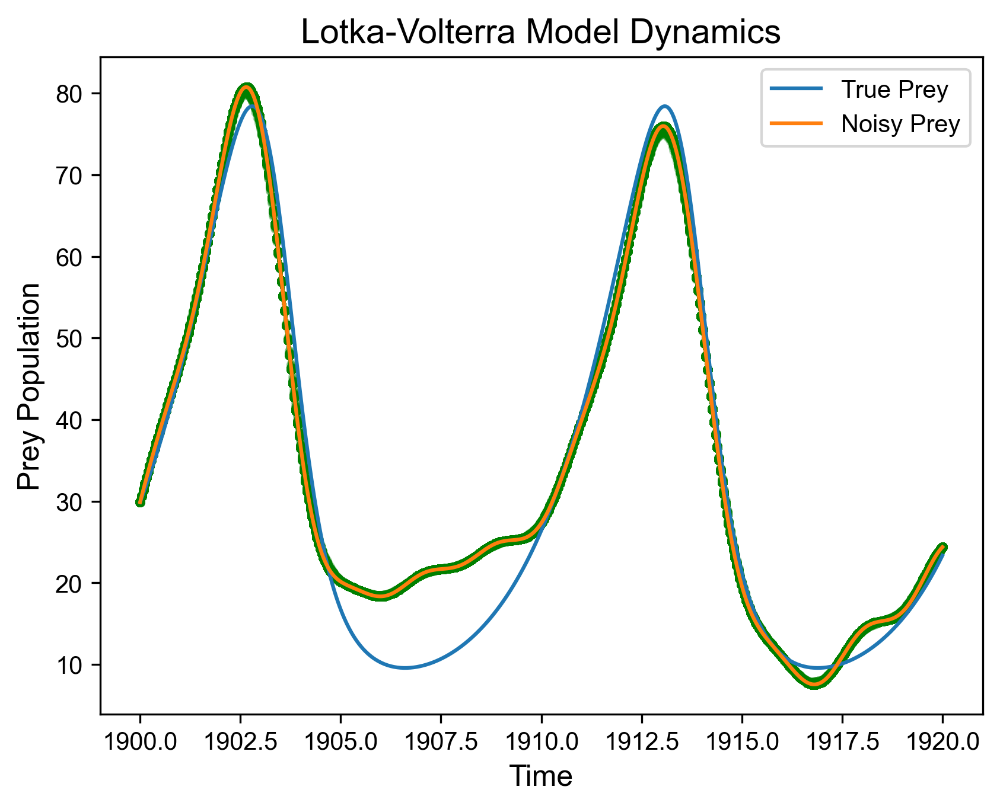

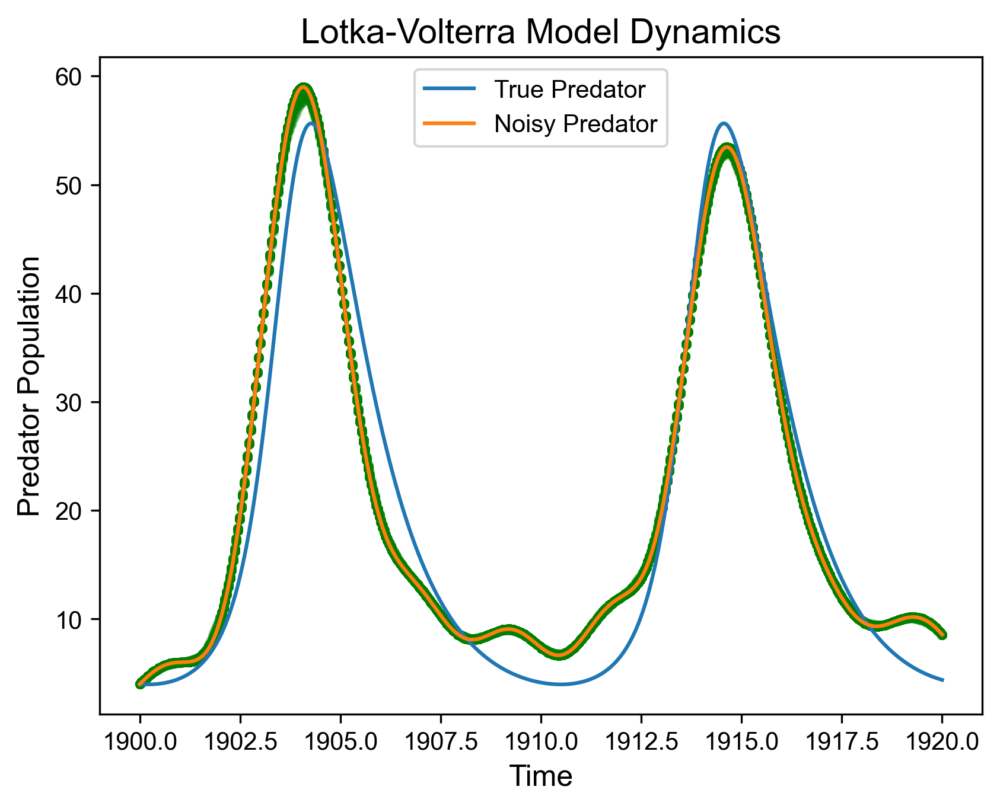

In [41]:
# Generate bootstrapped data paths for the analysis

bootstrapped_samples = generate_population_of_paths(u_data, v_data, samples=500)
x_noisy_paths = bootstrapped_samples[:,0]
y_noisy_paths =  bootstrapped_samples[:,1]


# Visualize paths
plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
for xn in x_noisy_paths:
    plt.plot(t, xn, 'g.-', alpha = 0.3)
plt.plot(t, u_sim, label='True Prey')
plt.plot(t, u_data, label='Noisy Prey')
plt.xlabel('Time')
plt.ylabel('Prey Population')
plt.legend()
plt.show()

plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
for yn in y_noisy_paths:
    plt.plot(t, yn, 'g.-', alpha = 0.3)

plt.plot(t, v_sim, label='True Predator')
plt.plot(t, v_data, label='Noisy Predator')
plt.xlabel('Time')
plt.ylabel('Predator Population')
plt.legend()
plt.show()

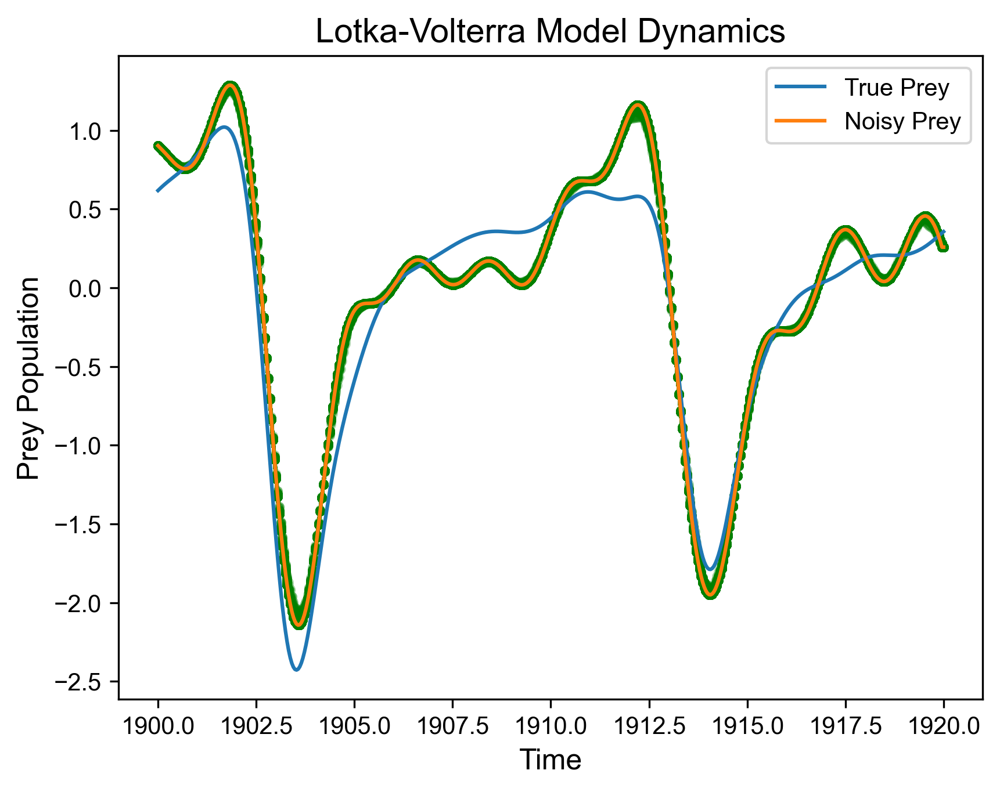

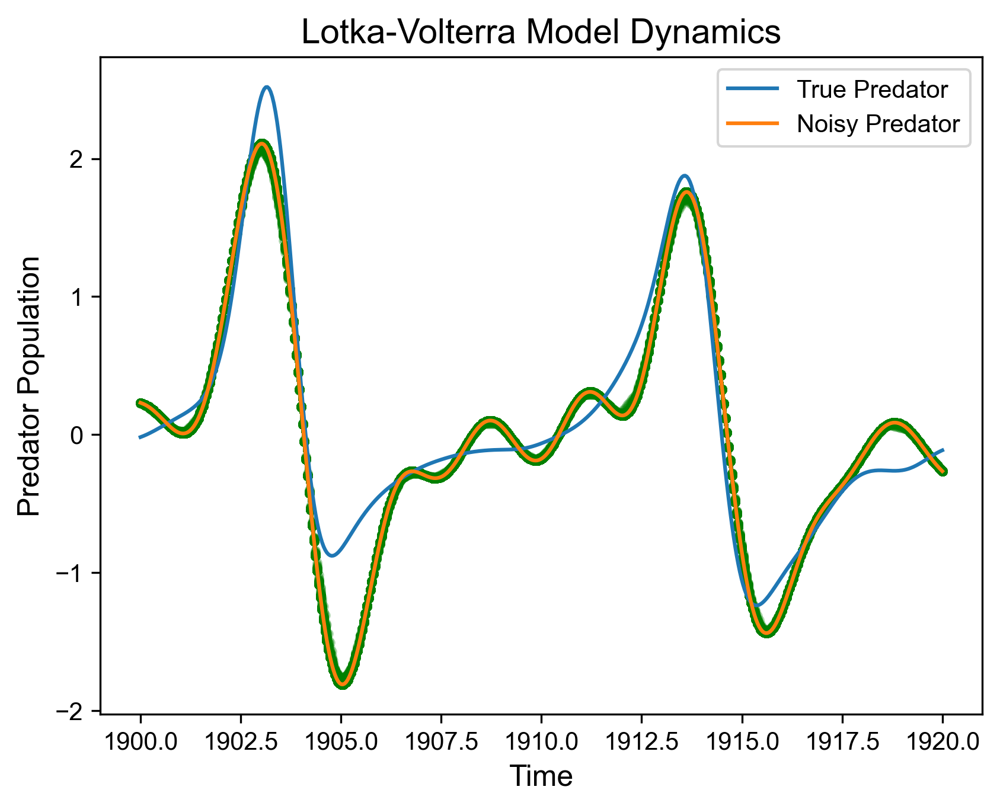

In [42]:
# Generate bootstrapped data (derivatives) paths for the analysis
x_dot_noisy, y_dot_noisy = u_dot_noisy, v_dot_noisy
bootstrapped_samples = generate_population_of_paths(x_dot_noisy, y_dot_noisy, samples=300)
x_noisy_paths = bootstrapped_samples[:,0]
y_noisy_paths =  bootstrapped_samples[:,1]


# Visualize paths
plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
for xn in x_noisy_paths:
    plt.plot(t, xn, 'g.-', alpha = 0.3)
plt.plot(t, u_dot_true, label='True Prey')
plt.plot(t, x_dot_noisy, label='Noisy Prey')
plt.xlabel('Time')
plt.ylabel('Prey Population')
plt.legend()
plt.show()

plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
for yn in y_noisy_paths:
    plt.plot(t, yn, 'g.-', alpha = 0.3)

plt.plot(t, v_dot_true, label='True Predator')
plt.plot(t, y_dot_noisy, label='Noisy Predator')
plt.xlabel('Time')
plt.ylabel('Predator Population')
plt.legend()
plt.show()

### Begin analysis

In [44]:
def gofx(prior_param_samples, library):
    pushforward = [simulate_param(param, library) for param in prior_param_samples]
    return np.array(pushforward)

def ss_prior_fn(prior, spike_prob):
    if len(spike_prob) == prior.shape[-1]:
        spike_indicator = np.random.binomial(1, 1 - spike_prob, size=prior.shape)
        new_prior = spike_indicator * prior
    else:
        print(f'Length of spike probability does not match number of data columns')
        return None  # or you can raise an exception
    return new_prior

# Example usage
spike_prob=np.array([0.7,0.1,0.7,0.1])
prior_tmp = np.array([1,2,3,4])
# ss_prior_fn(prior_tmp, spike_prob)

def calc_mean(posterior):
    return np.mean(posterior,0)

In [48]:
u_spike_prob=np.array([0.7,0.1,0.7,0.1])
v_spike_prob=np.array([0.7,0.7,0.1,0.1])
ss_prior = True

Data shape for KDE: (300, 150)
Prior is generated from uniform distribution
low:[-0.04 -1.   -0.04 -1.  ] , high:[0.04 1.   0.03 1.  ]

Data shape for KDE: (5000, 150)
prob-value = 1.0, accepted value = [ 0.          0.63391425 -0.         -0.47984508]

1 was accepted out of 5000 total prior samples
at tym = 0, total samples accepted = 1 

prob-value = 1.0, accepted value = [-0.          0.59306015 -0.         -0.44602618]

1 was accepted out of 5000 total prior samples
at tym = 1, total samples accepted = 2 

prob-value = 1.0, accepted value = [ 0.          0.63373005  0.         -0.47982059]

1 was accepted out of 5000 total prior samples
at tym = 2, total samples accepted = 3 

prob-value = 1.0, accepted value = [-0.00856535  0.61312546 -0.         -0.45168872]

prob-value = 0.8626883789197682, accepted value = [-0.          0.57448229 -0.         -0.43524712]

2 was accepted out of 5000 total prior samples
at tym = 3, total samples accepted = 5 

prob-value = 1.0, accepted value = 

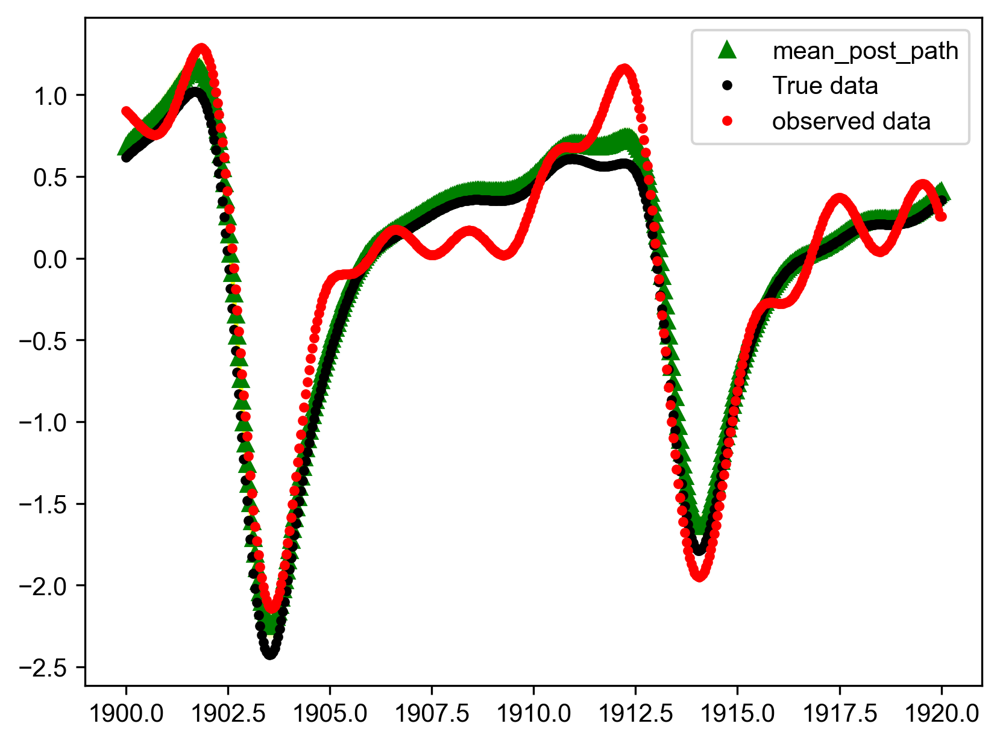

((6.088516480255758e+118, -1.704224726730758e-64),
 array([-5.78668521e-03,  6.00919758e-01, -4.95011527e-04, -4.49265765e-01]),
 array([0.00661885, 0.01422378, 0.00103632, 0.00976374]))

In [50]:
# Use kde to create distribution of the observed data paths 
dim = 150 #(20)
method = 0.15# 'silverman', 'scott' (0.15)
x_kde_obs, indices = estimate_kde(x_noisy_paths, dim = dim, bw_method = method, idx = True) #compute kde
x_obs_densities = kde_density_at_points(x_kde_obs,x_noisy_paths, dim=dim) #estimate data densities

# set hyper parameers
num_prior = 5000
Normal = False

# generate prior samples by doing the following: You need to define this in a function
if Normal:    
    # Generate sample points from normal distribution
    print(f'Prior is generated from normal distribution')
    # Generate sample points from normal distribution 
    x_prior_param_mean = np.array([0, 0.55, 0, -0.455])
    x_prior_param_std = np.array([0.001, 0.2, 0.001, 0.2]) 
    
    # Generate samples from a normal distribution
    x_prior_param_samples = generate_samples(x_prior_param_mean, x_prior_param_std, num_prior, distribution='normal')
    if num_prior <=1000:
        x_prior_param_samples = expand_2D_array(x_prior_param_samples)
        print(f'Number of prior samples post-pairing = {len(x_prior_param_samples)}')
    # Use the function to generate different sample path
    x_pushforward_prior = gofx(x_prior_param_samples, library)
    print(f'mean:{x_prior_param_mean} , std:{x_prior_param_std} \n')  

else:
    # Generate sample points from uniform distribution
    print(f'Prior is generated from uniform distribution')
    x_prior_param_low =  np.array([-0.04, -1, -0.04, -1]) 
    x_prior_param_high = np.array([0.04, 1, 0.03, 1])
    # Generate samples from a uniform distribution
    x_prior_param_samples = generate_samples(x_prior_param_low, x_prior_param_high, num_prior, distribution='uniform')
    # param_pairs = expand_2D_array(obs_param_samples)
    if num_prior <=1000:
        x_prior_param_samples = expand_2D_array(x_prior_param_samples)
        print(f'Number of prior samples post-pairing = {len(x_prior_param_samples)}')
    # Use the function to generate different sample path
    x_pushforward_prior = gofx(x_prior_param_samples, library)
    print(f'low:{x_prior_param_low} , high:{x_prior_param_high}\n')


# use kde with similar parameter as in x_kde_obs to generate pushforward prior kde
x_kde_prior = estimate_kde(x_pushforward_prior, dim = dim, bw_method = method) #compute kde
# prior_densities = kde_density_at_points(x_kde_prior, x_pushforward_prior, dim=dim) #estimate data densities

#Run acceptance rejection sampling to generate posterior
x_post_param_samples = []
tym = 0
tym2 = 0
while len(x_post_param_samples)<50:
    # print(x_prior_param_samples[:5])
    if len(x_post_param_samples)<10:
        if Normal:
            x_prior_param_samples = generate_samples(x_prior_param_mean, x_prior_param_std, num_prior, distribution='normal')
        else: 
            x_prior_param_samples = generate_samples(x_prior_param_low, x_prior_param_high, num_prior, distribution='uniform')
        
        #spike and slab prior
        if ss_prior:
            x_prior_param_samples= ss_prior_fn(x_prior_param_samples, u_spike_prob)
        
        # run the acceptance rejection sampling algorithm
        x_post_param_samples.extend(rejection_sampling(x_prior_param_samples, gofx, x_kde_obs, x_kde_prior, library))
        print(f'at tym = {tym}, total samples accepted = {len(x_post_param_samples)} \n')
        tym += 1
        # print(x_post_param_samples)
        # temp = x_post_param_samples
    
        
    else:
        # Generate sample points from uniform distribution
        print(f'Prior is generated from uniform distribution')
        if tym2 == 0:        
            x_prior_param_low =  np.min(x_post_param_samples,0)  
            x_prior_param_high = np.max(x_post_param_samples,0)
            tym2 += 1
        else:
            x_prior_param_low =  np.min(x_post_param_samples,0)  
            x_prior_param_high = np.max(x_post_param_samples,0)
            tym2 += 1
            
        # Generate samples from a uniform distribution
        x_prior_param_samples = generate_samples(x_prior_param_low, x_prior_param_high, n_samples=1000, distribution='uniform')
        
        #spike and slab prior
        if ss_prior:
            x_prior_param_samples= ss_prior_fn(x_prior_param_samples, u_spike_prob)
        # Use the function to generate different sample path
        x_pushforward_prior = gofx(x_prior_param_samples, library)
        x_kde_prior = estimate_kde(x_pushforward_prior, dim = dim, bw_method = method) #compute kde
        
        print(f'low:{x_prior_param_low} , high:{x_prior_param_high}\n')
        temp = rejection_sampling(x_prior_param_samples, gofx, x_kde_obs, x_kde_prior, library)
        x_post_param_samples.extend(temp)
        print(f'at tym = {tym}, total samples accepted = {len(x_post_param_samples)} \n')
        tym+=1

x_post_param_samples = np.array(x_post_param_samples)
# Get the pushforward of posterior distribution of each parameter
print(f'Final total number of accepted samples = {len(x_post_param_samples)}')
x_pushforward_posterior = gofx(x_post_param_samples, library)

# compare the pushforward distribution to the observed data using visuals and kl divergence of the kde
# plot_paths(x_actual, observed_paths, color='blue', hl = 'r*',label = 'mean_obs_path')
for path in x_pushforward_posterior:
        plt.plot(t, path, color='yellow', alpha=0.05)  # semi-transparent blue lines
x_mean_path = np.mean(x_pushforward_posterior, axis=0)
plt.plot(t, x_mean_path, 'g^' , label='mean_post_path')
plt.plot(t, u_dot_true, 'k.', label = 'True data')
plt.plot(t, x_dot_noisy, 'r.', label = 'observed data')
plt.legend()
plt.show()

# kl divergence
kl_divs = kl_divergence(x_noisy_paths,x_pushforward_posterior, bandwidth=method )
kl_divs,np.mean(x_post_param_samples,0), np.std(x_post_param_samples,0)        

Data shape for KDE: (300, 150)
Prior is generated from uniform distribution
low:[-0.04 -0.04 -1.   -1.  ] , high:[0.04 0.04 1.   1.  ]

Data shape for KDE: (5000, 150)
prob-value = 0.8643792770427652, accepted value = [ 0.00412542 -0.         -0.96740129  0.56689566]

prob-value = 1.0, accepted value = [-0.03199716  0.         -0.91852005  0.56031862]

prob-value = 0.22428635259094934, accepted value = [ 0.         -0.00369864 -0.94523712  0.55010044]

3 was accepted out of 5000 total prior samples
at tym = 0, total samples accepted = 3 

prob-value = 1.0, accepted value = [ 0.03353793 -0.         -0.88801066  0.53070315]

1 was accepted out of 5000 total prior samples
at tym = 1, total samples accepted = 4 

prob-value = 1.0, accepted value = [ 0.          0.         -0.92605595  0.55155204]

1 was accepted out of 5000 total prior samples
at tym = 2, total samples accepted = 5 

prob-value = 1.0, accepted value = [ 0.01825685  0.         -0.94225779  0.54659669]

prob-value = 0.469586

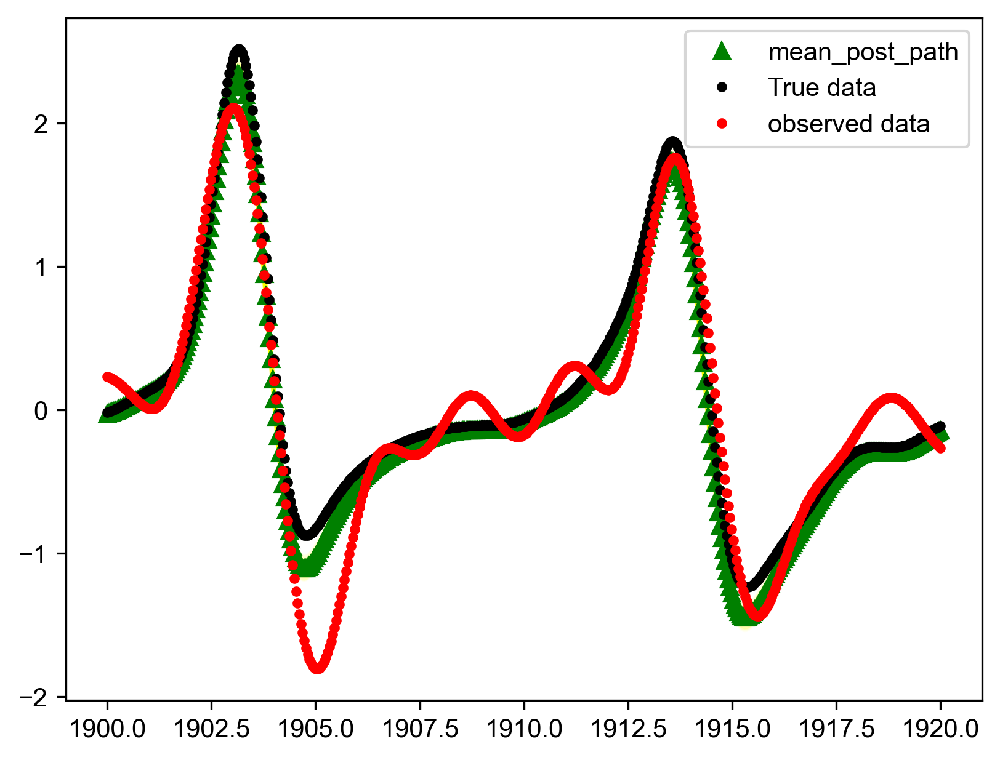

((3.4471559704751606e+120, -1.714961926298909e-119),
 array([ 0.01633139, -0.00199686, -0.92242379,  0.54573339]),
 array([0.01374559, 0.00595838, 0.01785491, 0.00952474]))

In [51]:
# Use kde to create distribution of the observed data paths 
y_kde_obs, y_indx = estimate_kde(y_noisy_paths, dim = dim, bw_method = method, idx=True) #compute kde
y_obs_densities = kde_density_at_points(y_kde_obs,y_noisy_paths, dim=dim) #estimate data densities

# set hyper parameers
num_prior = 5000
# Normal = True

# generate prior samples by doing the following: You need to define this in a function
if Normal:    
    # Generate sample points from normal distribution
    print(f'Prior is generated from normal distribution')
    # Generate sample points from normal distribution 
    y_prior_param_mean = np.array( [0, 0, -0.84,0.5433])
    y_prior_param_std = np.array([0.02, 0.02,0.2,0.2]) 
    
    # Generate samples from a normal distribution
    y_prior_param_samples = generate_samples(y_prior_param_mean, y_prior_param_std, num_prior, distribution='normal')
    if num_prior <=1000:
        y_prior_param_samples = expand_2D_array(y_prior_param_samples)
        print(f'Number of prior samples post-pairing = {len(y_prior_param_samples)}')
    # Use the function to generate different sample path
    y_pushforward_prior = gofx(y_prior_param_samples, library)
    print(f'mean:{y_prior_param_mean} , std:{y_prior_param_std} \n')  

else:
    # Generate sample points from uniform distribution
    print(f'Prior is generated from uniform distribution')
    y_prior_param_low =  np.array([-0.04,-0.04, -1, -1]) 
    y_prior_param_high = np.array([0.04,0.04, 1, 1])
    # Generate samples from a uniform distribution
    y_prior_param_samples = generate_samples(y_prior_param_low, y_prior_param_high, num_prior, distribution='uniform')
    # param_pairs = expand_2D_array(obs_param_samples)
    if num_prior <=1000:
        y_prior_param_samples = expand_2D_array(y_prior_param_samples)
        print(f'Number of prior samples post-pairing = {len(y_prior_param_samples)}')
    # Use the function to generate different sample path
    y_pushforward_prior = gofx(y_prior_param_samples, library)
    print(f'low:{y_prior_param_low} , high:{y_prior_param_high}\n')


# use kde with similar parameter as in y_kde_obs to generate pushforward prior kde
y_kde_prior = estimate_kde(y_pushforward_prior, dim = dim, bw_method = method) #compute kde
# prior_densities = kde_density_at_points(y_kde_prior, y_pushforward_prior, dim=dim) #estimate data densities

#Run acceptance rejection sampling to generate posterior
y_post_param_samples = []
tym = 0
tym2 = 0
while len(y_post_param_samples)<100:
    if len(y_post_param_samples)<10:
        if Normal:
            y_prior_param_samples = generate_samples(y_prior_param_mean, y_prior_param_std, num_prior, distribution='normal')
        else:
            y_prior_param_samples = generate_samples(y_prior_param_low, y_prior_param_high, num_prior, distribution='uniform')
        
        #spike and slab prior
        if ss_prior:
            y_prior_param_samples= ss_prior_fn(y_prior_param_samples, v_spike_prob)
        # run the acceptance rejection sampling algorithm
        y_post_param_samples.extend(rejection_sampling(y_prior_param_samples, gofx, y_kde_obs, y_kde_prior, library))
        print(f'at tym = {tym}, total samples accepted = {len(y_post_param_samples)} \n')
        tym += 1
        # temp = y_post_param_samples
        
    else:
        # Generate sample points from uniform distribution
        print(f'Prior is generated from uniform distribution')
        if tym2 == 0:
            y_prior_param_low =  np.min(y_post_param_samples,0)
            y_prior_param_high = np.max(y_post_param_samples,0)
            tym2 += 1
        else:
            y_prior_param_low =  np.min(y_post_param_samples,0)  
            y_prior_param_high = np.max(y_post_param_samples,0)
            tym2 += 1
       
        # Generate samples from a uniform distribution
        y_prior_param_samples = generate_samples(y_prior_param_low, y_prior_param_high, n_samples=1000, distribution='uniform')
        
        #spike and slab prior
        if ss_prior:
            y_prior_param_samples= ss_prior_fn(y_prior_param_samples, v_spike_prob)
        # Use the function to generate different sample path
        y_pushforward_prior = gofx(y_prior_param_samples, library)
        y_kde_prior = estimate_kde(y_pushforward_prior, dim = dim, bw_method = method) #compute kde
        
        print(f'low:{y_prior_param_low} , high:{y_prior_param_high}\n')
        temp = rejection_sampling(y_prior_param_samples, gofx, y_kde_obs, y_kde_prior, library)
        y_post_param_samples.extend(temp)
        print(f'at tym = {tym}, total samples accepted = {len(y_post_param_samples)} \n')
        tym+=1

y_post_param_samples = np.array(y_post_param_samples)
# Get the pushforward of posterior distribution of each parameter
print(f'Final total number of accepted samples = {len(y_post_param_samples)}')
y_pushforward_posterior = gofx(y_post_param_samples, library)

# compare the pushforward distribution to the observed data using visuals and kl divergence of the kde
# plot_paths(y_actual, observed_paths, color='blue', hl = 'r*',label = 'mean_obs_path')
for path in y_pushforward_posterior:
        plt.plot(t, path, color='yellow', alpha=0.05)  # semi-transparent blue lines
y_mean_path = np.mean(y_pushforward_posterior, axis=0)
plt.plot(t, y_mean_path, 'g^' , label='mean_post_path')
plt.plot(t, v_dot_true, 'k.', label = 'True data')
plt.plot(t, y_dot_noisy, 'r.', label = 'observed data')
plt.legend()
plt.show()


# kl divergence
kl_divs = kl_divergence(y_noisy_paths,y_pushforward_posterior, bandwidth=method )
kl_divs,np.mean(y_post_param_samples,0), np.std(y_post_param_samples,0)        

In [52]:
save_array_to_csv(x_post_param_samples, 'hudson_sip_x_coeffs.csv')
save_array_to_csv(y_post_param_samples, 'hudson_sip_y_coeffs.csv')

## UQSINDy

In [63]:
# Initialize the parameters (params and sigma)
u_start_params = np.zeros(4) #calc_mean(chain_param_ltk.params) #
u_start_sigma = 0.01 #calc_mean(chain_eps_ltk.sigma) #
num_step = 150


u_Posterior_params = []
u_Posterior_sigma = []
# While the number of steps is less than a preset
step = 0
while step<num_step:
    if step%5 == 0:
        print(f'______________________________________________________________________{step}th iteration_________________________________________________________________')
    
    # Sample new params given sigma using ABC likelihood without gamma
    def log_likelihood(u_params):
        if ss_prior:
            u_params = ss_prior_fn(u_params, u_spike_prob)
        a,b,c,d = u_params
        sig = u_start_sigma
        
        # predict udot
        udot_predict = simulate_param(u_params, library).reshape(-1)
        
        model = smp.Model()
        # Log-likelihood
        model.add(smp.normal(udot_predict, mu=u_dot_noisy, sig=sig))   
    
        # log-priors
        model.add(smp.uniform(a, lower = -1, upper=1),
                  smp.uniform(b, lower = -1, upper=1),
                  smp.uniform(c, lower = -1 , upper=1),
                  smp.uniform(d, lower = -1, upper=1)
                 )
        return model()


    u_start_params_ltk = {'u_params': u_start_params} # Set the starting model parameter
    print(f'Params start = {u_start_params_ltk}') # Print the starting model parameter
    hmc_param_ltk = smp.Slice(log_likelihood, u_start_params_ltk)
    chain_param_ltk = hmc_param_ltk.sample(100, burn=50, n_chains=1)
    #Replace current with accepted params
    u_start_params = calc_mean(chain_param_ltk.u_params)
    
    
   
    # Sample new sigma given new params using sigma likelihood
    def sigma_likelihood(u_sigma):
        sig = u_sigma
        
        # predict udot
        udot_predict = simulate_param(u_start_params, library).reshape(-1)
        
        model = smp.Model()
        
        # Log-likelihood
        model.add(smp.normal(udot_predict, mu=u_dot_noisy, sig=sig))    
        # log-priors
        model.add(smp.exponential(sig))
        return model()
    
    #Sampling sigma given the parameters
    start_eps_ltk = {'u_sigma': u_start_sigma} # Set the starting sigma parameter
    print(f'sigma start = {start_eps_ltk}') # Print the starting sigma parameter
    hmc_eps_ltk = smp.NUTS(sigma_likelihood, start_eps_ltk) #Hamiltonian, Slice, NUTS, Metropolis
    chain_eps_ltk = hmc_eps_ltk.sample(100, burn=50, n_chains=1)
    u_start_sigma = calc_mean(chain_eps_ltk.u_sigma)
    
    # Store the new params and sigma
    u_Posterior_params.extend(chain_param_ltk.u_params)
    u_Posterior_sigma.extend(chain_eps_ltk.u_sigma)
    
    #Repeat step 3-5 
    step +=1
    # mean_params = start_params
    print(f'Recovered u_params = {u_start_params}')
    print(f'Recovered u_sigma = {u_start_sigma} \n\n')
    

______________________________________________________________________0th iteration_________________________________________________________________
Params start = {'u_params': array([0., 0., 0., 0.])}
Progress: [##############################] 100 of 100 samples
sigma start = {'u_sigma': 0.01}
Progress: [##############################] 100 of 100 samples
Recovered u_params = [ 0.01237985  0.59559513  0.22086476 -0.44629215]
Recovered u_sigma = 0.42794243460318265 


Params start = {'u_params': array([ 0.01237985,  0.59559513,  0.22086476, -0.44629215])}


C:\Users\rolabiyi\.conda\envs\pd_env\lib\site-packages\autograd\tracer.py:48: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)


Progress: [##############################] 100 of 100 samples
sigma start = {'u_sigma': 0.42794243460318265}
Progress: [##############################] 100 of 100 samples
Recovered u_params = [ 0.15445784  0.59842645 -0.09741733 -0.44745714]
Recovered u_sigma = 0.24679072686581577 


Params start = {'u_params': array([ 0.15445784,  0.59842645, -0.09741733, -0.44745714])}
Progress: [##############################] 100 of 100 samples
sigma start = {'u_sigma': 0.24679072686581577}
Progress: [##############################] 100 of 100 samples
Recovered u_params = [ 0.63087978  0.59611927 -0.04387372 -0.44534728]
Recovered u_sigma = 0.6352968366539447 


Params start = {'u_params': array([ 0.63087978,  0.59611927, -0.04387372, -0.44534728])}
Progress: [##############################] 100 of 100 samples
sigma start = {'u_sigma': 0.6352968366539447}
Progress: [##############################] 100 of 100 samples
Recovered u_params = [ 0.4181404   0.59111307 -0.33100757 -0.44188551]
Recovered u_

Exception: Slice sampler shrank to zero!

In [67]:
from sampyl.samplers.slice import Slice


u_start_params_ltk = {'u_params': u_start_params}
slice_sampler = Slice(log_likelihood, u_start_params_ltk)
chain_param_ltk = slice_sampler.sample(100, burn=50, n_chains=1)



Progress: [##############################] 100 of 100 samples


[ 0.66844486  0.29161826 -4.27918632  0.70566905] 5.574034646473543


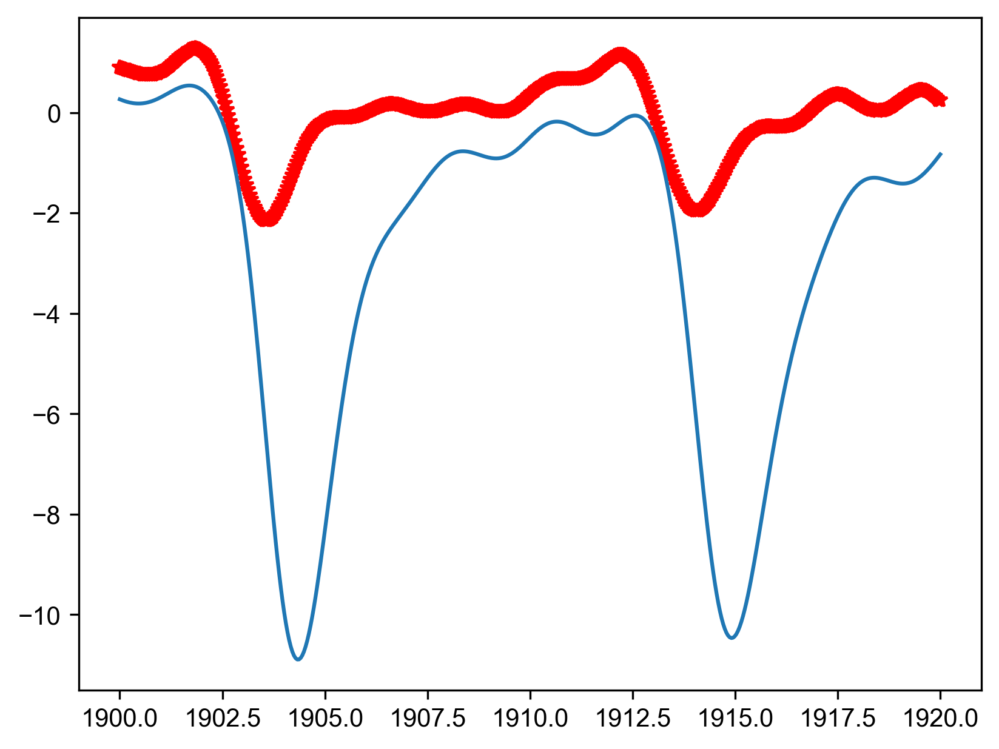

In [69]:
print(calc_mean(u_Posterior_params), calc_mean(u_Posterior_sigma))

u_dot_post = simulate_param(calc_mean(u_Posterior_params), library)
plt.plot(t, u_dot_noisy, 'r*-')
plt.plot(t, u_dot_post)
plt.show()

In [71]:
#spike and slab parameters
v_spike_prob=np.array([0.7,0.7,0.1,0.1])

# Initialize the parameters (params and sigma)
v_start_params = np.zeros(4) #calc_mean(chain_param_ltk.params) #
v_start_sigma = 0.2 #calc_mean(chain_eps_ltk.sigma) #
num_step = 50


v_Posterior_params = []
v_Posterior_sigma = []
# While the number of steps is less than a preset
step = 0
while step<num_step:
    if step%10 == 5:
        print(f'______________________________________________________________________{step}th iteration_________________________________________________________________')
    
    # Sample new params given sigma using ABC likelihood without gamma
    def log_likelihood(v_params):
        if ss_prior:
            v_params = ss_prior_fn(v_params, v_spike_prob)
        a,b,c,d = v_params
        sig = v_start_sigma
        
        # predict udot
        udot_predict = simulate_param(v_params, library).reshape(-1)
        
        model = smp.Model()
        # Log-likelihood
        model.add(smp.normal(udot_predict, mu=v_dot_noisy, sig=sig))   
    
        # log-priors
        model.add(smp.uniform(a, lower = -1, upper=1),
                  smp.uniform(b, lower = -1, upper=1),
                  smp.uniform(c, lower = -1 , upper=1),
                  smp.uniform(d, lower = -1 , upper=1)
                 )
        return model()


    v_start_params_ltk = {'v_params': v_start_params} # Set the starting model parameter
    print(f'Params start = {v_start_params_ltk}') # Print the starting model parameter
    hmc_param_ltk = smp.Slice(log_likelihood, v_start_params_ltk)
    chain_param_ltk = hmc_param_ltk.sample(100, burn=50, n_chains=1)
    #Replace current with accepted params
    v_start_params = calc_mean(chain_param_ltk.v_params)
    
    
   
    # Sample new sigma given new params using sigma likelihood
    def sigma_likelihood(v_sigma):
        sig = v_sigma
        
        # predict udot
        udot_predict = simulate_param(v_start_params, library).reshape(-1)
        
        model = smp.Model()
        
        # Log-likelihood
        model.add(smp.normal(udot_predict, mu=v_dot_noisy, sig=sig))    
        # log-priors
        model.add(smp.exponential(sig))
        return model()
    
    #Sampling sigma given the parameters
    start_eps_ltk = {'v_sigma': v_start_sigma} # Set the starting sigma parameter
    print(f'sigma start = {start_eps_ltk}') # Print the starting sigma parameter
    hmc_eps_ltk = smp.Slice(sigma_likelihood, start_eps_ltk) #Hamiltonian, Slice, NUTS, Metropolis
    chain_eps_ltk = hmc_eps_ltk.sample(100, burn=50, n_chains=1)
    v_start_sigma = calc_mean(chain_eps_ltk.v_sigma)
    
    # Store the new params and sigma
    v_Posterior_params.extend(chain_param_ltk.v_params)
    v_Posterior_sigma.extend(chain_eps_ltk.v_sigma)
    
    #Repeat step 3-5 
    step +=1
    # mean_params = start_params
    print(f'Recovered v_params = {v_start_params}')
    print(f'Recovered v_sigma = {v_start_sigma} \n\n')
    

Params start = {'v_params': array([0., 0., 0., 0.])}
Progress: [##############################] 100 of 100 samples
sigma start = {'v_sigma': 0.2}
Progress: [##############################] 100 of 100 samples
Recovered v_params = [ 0.05866593  0.10911156 -0.93129945  0.54202549]
Recovered v_sigma = 0.34920234012301987 


Params start = {'v_params': array([ 0.05866593,  0.10911156, -0.93129945,  0.54202549])}
Progress: [##############################] 100 of 100 samples
sigma start = {'v_sigma': 0.34920234012301987}
Progress: [##############################] 100 of 100 samples
Recovered v_params = [ 0.3184963   0.05431132 -0.87603563  0.5247998 ]
Recovered v_sigma = 0.4789516396830163 


Params start = {'v_params': array([ 0.3184963 ,  0.05431132, -0.87603563,  0.5247998 ])}
Progress: [##############################] 100 of 100 samples
sigma start = {'v_sigma': 0.4789516396830163}
Progress: [##############################] 100 of 100 samples
Recovered v_params = [ 0.31067422  0.15324051 

[10.4675577  -1.31491389 -0.53069285  0.36484603] 9.177620272022986


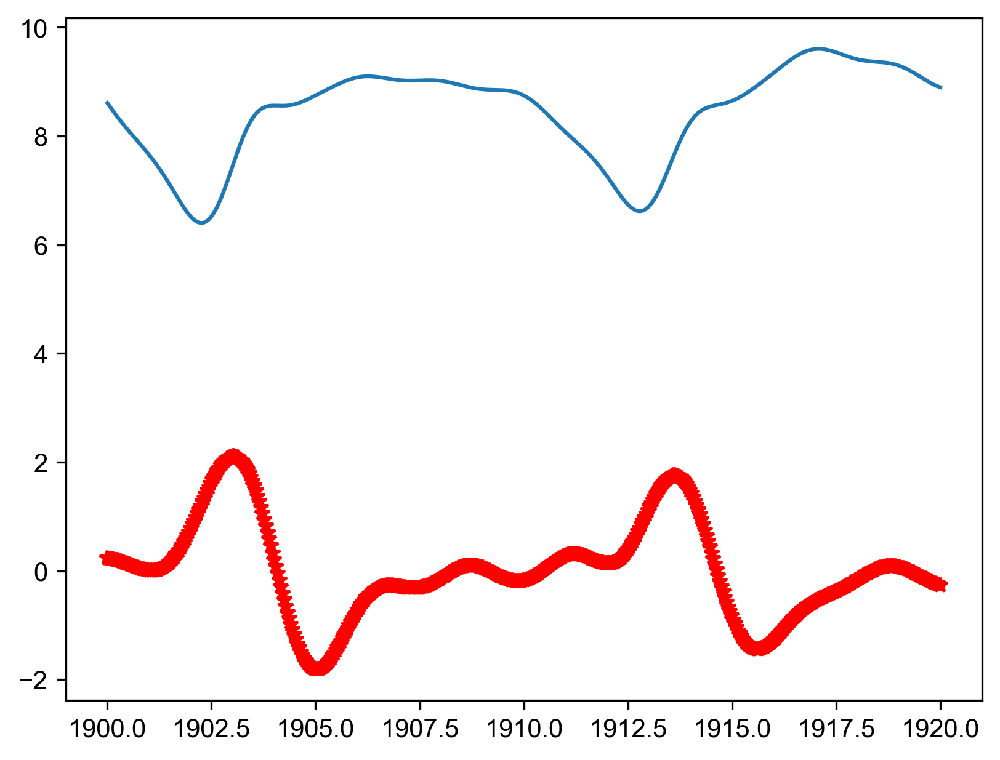

In [73]:
print(calc_mean(v_Posterior_params), calc_mean(v_Posterior_sigma))

v_dot_post = simulate_param(calc_mean(v_Posterior_params), library)
plt.plot(t, v_dot_noisy, 'r*-')
plt.plot(t, v_dot_post)
plt.show()

## Performance comparisons

In [75]:
def predict_lv_param(params):
    # Ensure params is a flat array or a tuple when passed to the integration function
    _, z_pred = integrate_lotka_volterra(t_span, z0, params, method='odeint', num_points=num_points)
    return z_pred

def lotka_volterra(t, z, a, b, g, d):
    u, v = z
    return [a*u + b*u*v, g*v + d*u*v]

def lotka_volterra_odeint(z, t, a, b, g, d):
    # No change needed here, but ensuring it's correctly defined    
    return [a*z[0] + b*z[0]*z[1], g*z[1] + d*z[0]*z[1]]

def integrate_lotka_volterra(t_span, z0, params, method='odeint', num_points=100):
    a, b, g, d = params
    # Convert params to their numerical values if they are ArrayBox instances
    # This step is crucial if params are wrapped by autograd for differentiation
    # Note: This simplification might not be directly applicable; it's illustrative
    numeric_params = [param if not isinstance(param, autograd.numpy.numpy_boxes.ArrayBox) else param._value for param in params]

    t_eval = np.linspace(*t_span, num_points)
    if method == 'solve_ivp':
        sol = solve_ivp(lambda t, z: lotka_volterra(t, z, *numeric_params), t_span, z0, t_eval=t_eval, method='RK45')
        z = sol.y
        t = sol.t
    elif method == 'odeint':
        sol = odeint(lotka_volterra_odeint, z0, t_eval, args=tuple(numeric_params))
        z = sol.T
        t = t_eval
    else:
        raise ValueError("Invalid method selected. Choose 'solve_ivp' or 'odeint'.")

    return t, z

In [77]:
import numpy as np
import matplotlib.pyplot as plt

def plot_histograms_in_one(*matrices):
    """
    Plot histograms for columns of the given matrices. Each matrix must have the same number of columns
    but can have different number of rows.

    Parameters:
    *matrices (array-like): Variable number of matrices where each matrix is an array-like structure with
                            two dimensions. All matrices must have the same number of columns.

    Returns:
    None
    """
    # Ensure all matrices have the same number of columns
    if len(set(m.shape[1] for m in matrices)) != 1:
        raise ValueError("All matrices must have the same number of columns")
    
    num_columns = matrices[0].shape[1]
    num_rows = len(matrices)
    
    # Creating figure with subplots
    fig, axes = plt.subplots(nrows=1, ncols=num_columns, figsize=(5 * num_columns, 4), squeeze=False)
    axes = axes.flatten()  # Flatten the array of axes for easy iteration

    # For each column, plot the histogram across all matrices
    for col in range(num_columns):
        for idx, matrix in enumerate(matrices):
            column_data = matrix[:, col]
            mean_k = np.mean(column_data)
            sigma_k = np.std(column_data)
            
            # Plot histogram
            axes[col].hist(column_data, bins=20, alpha=0.7, density =True ,label=f'Matrix {idx+1} mean={mean_k:.2f}, $\sigma$={sigma_k:.2f}')
            
        # Set labels and titles
        axes[col].set_title(f'Column {col + 1}')
        axes[col].set_xlabel('Value')
        axes[col].set_ylabel('Frequency')
        axes[col].legend()

    # Adjust layout
    plt.tight_layout()
    plt.show()


def plot_matrix_histograms(*matrices, hist_labels = ['Observed data', 'SIP Posterior', 'PCE Posterior']):
    """
    Plots normalized histograms for each column of the given matrices. Each matrix is plotted
    in a separate figure with subplots arranged column-wise. Histograms are normalized so that
    they all have the same height scale (area under histogram equals 1).

    Parameters:
    *matrices (multiple numpy.ndarray arguments): matrices to plot with the same number of columns
    but possibly different number of rows.
    """
    for index, matrix in enumerate(matrices):
        num_columns = matrix.shape[1]
        fig, axes = plt.subplots(nrows=1, ncols=num_columns, figsize=(4*num_columns, 3), squeeze=False)
        fig.suptitle(f'{hist_labels[i]}', fontsize=16)
        
        for col in range(num_columns):
            ax = axes[0, col]
            data = matrix[:, col]
            mean_k = np.mean(data)
            std_k = np.std(data)
            ax.hist(data, bins='auto', color='skyblue', alpha=0.7, rwidth=0.85, density=True)
            ax.set_title(f'Param {col+1} (mean={mean_k:.2f}, std={std_k:.2f})')
            ax.set_xlabel('Value')
            ax.set_ylabel('Density')
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for figure title
        plt.show()

def plot_matrix_histograms(*matrices, colors = ['red', 'blue', 'green'], hist_labels = ['Observed data', 'SIP Posterior', 'PCE Posterior']):
    """
    Plots normalized histograms for each column of the given matrices, with a vertical line indicating
    the mean of the samples. Each matrix is plotted in a separate figure with subplots arranged column-wise.
    Histograms are normalized so that they all have the same height scale (area under histogram equals 1).

    Parameters:
    *matrices (multiple numpy.ndarray arguments): matrices to plot with the same number of columns
    but possibly different number of rows.
    """
    for index, matrix in enumerate(matrices):
        num_columns = matrix.shape[1]
        fig, axes = plt.subplots(nrows=1, ncols=num_columns, figsize=(4*num_columns, 3), squeeze=False)
        fig.suptitle(f'{hist_labels[index]}', fontsize=16)
        
        for col in range(num_columns):
            ax = axes[0, col]
            data = matrix[:, col]
            mean_k = np.mean(data)
            std_k = np.std(data)
            # Create histogram with density=True to normalize heights
            ax.hist(data, bins='auto', color=colors[index], alpha=0.7, rwidth=0.85, density=True)
            # Plot a vertical line for the mean
            ax.axvline(mean_k, color='black', linestyle='dashed', linewidth=1)
            # Adding text annotation for mean
            # ax.text(mean_k, ax.get_ylim()[1] * 0.95, f'Mean: {mean_k:.2f}', color='black', ha='right')
            
            ax.set_title(f'Param {col+1} (mean={mean_k:.2f}, std={std_k:.2f})')
            ax.set_xlabel('Value')
            ax.set_ylabel('Density')
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for figure title
        plt.show()

from scipy.stats import entropy

def plot_pushfowards(x_values, *y_paths_groups, show=False, colors=['red', 'blue', 'green'], hl='k*', labels=['Observed mean', 'SIP mean', 'PCE mean']):
    """
    Plots multiple groups of y paths (each group and each row in a group against x_values)
    on separate plots with a specified transparency. Computes the KL divergence of all groups
    with respect to the first group and displays it in the plot title.

    Parameters:
        x_values (array_like): The common x values for the y paths.
        *y_paths_groups (variable number of array_like arguments): Each being a matrix of y paths
            where each row in a matrix is a y path.
        show (bool): Whether to display the plot immediately.
        colors (list): List of colors for each group of paths.
        hl (str): Highlight style for the mean path.
        labels (list): Labels for the mean of each group.
    """
    if colors is None:
        colors = ['blue'] * len(y_paths_groups)
    if labels is None:
        labels = [f'mean_path_{i+1}' for i in range(len(y_paths_groups))]

    # Plot the means
    plt.figure(figsize=(10, 6))
    for index, y_paths in enumerate(y_paths_groups):        
        # Calculate the mean path across all rows (mean for each column)
        mean_path = np.mean(y_paths, axis=0)
        
        # Plot the mean path
        plt.plot(x_values, mean_path, color = colors[index], label=labels[index % len(labels)])  # mean path highlighted
        
    # Adding title and labels
    plt.title(f'Plots of Mean Paths')
    plt.xlabel('X Values')
    plt.ylabel('Y Values')
    plt.legend()
    plt.show()

    # Reference paths for KL divergence
    reference_y_paths = y_paths_groups[0]
    reference_density, _ = np.histogram(reference_y_paths, bins=30, density=True)
    
    for index, y_paths in enumerate(y_paths_groups):
        plt.figure(figsize=(10, 6))
        
        # Calculate the mean path across all rows (mean for each column)
        mean_path = np.mean(y_paths, axis=0)
        
        # Plot each path
        for path in y_paths:
            plt.plot(x_values, path, color=colors[index % len(colors)], alpha=0.3)  # semi-transparent lines
        
        # Plot the mean path
        plt.plot(x_values, mean_path, hl, label=labels[index % len(labels)])  # mean path highlighted
        
        # Compute and plot KL divergence with respect to the first group
        current_density, _ = np.histogram(y_paths, bins=30, density=True)
        kl_div = entropy(current_density, reference_density)
        
        # Adding title and labels
        plt.title(f'Plots of Paths (KL div w.r.t. first group: {kl_div:.2f})')
        plt.xlabel('X Values')
        plt.ylabel('Y Values')
        plt.legend()
        
        if show:
            plt.show()

In [79]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
   
def plot_kde_matrix(data, titles, color='orange', name='SIP method', xlim = (-2,2)):
    data = np.array(data)

    n, m = data.shape
    mn,mx = np.min(data)-0.05, np.max(data)+0.05
    if len(titles) != m:
        raise ValueError("Length of titles vector must be equal to the number of columns in data.")
    
    fig, axes = plt.subplots(m, 1, figsize=(2.5, 1.5 * m), sharex='col', gridspec_kw={'hspace': 0})
    for i in range(m):
        kde = gaussian_kde(data[:, i])
        x = np.linspace(min(data[:, i]), max(data[:, i]), 1000)
        # mn,mx = np.min(x)-0.05, np.max(x)+0.05
        axes[i].plot(x, kde(x), color=color)
        axes[i].fill_between(x, kde(x), color=color, alpha=0.5)
        mean_val = np.mean(data[:, i])
        axes[i].axvline(mean_val, color='red', linestyle='--', linewidth=1, label=f'mean= {mean_val.round(2)}')
        axes[i].axvline(0, color='black', linestyle='-.')
        axes[i].set_xlim(mn,mx)
        axes[i].set_ylabel(titles[i], rotation=0, labelpad=40)
        # Position legend in the top right corner of each subplot
        axes[i].legend(loc='upper right', draggable = True)
        axes[i].yaxis.set_label_position("left")
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_visible(False)
        axes[i].spines['bottom'].set_visible(True)
        axes[i].get_xaxis().set_visible(True)
        axes[i].tick_params(axis='x', which='both', bottom=True)
        axes[i].tick_params(axis='y', which='both', left=False, right=False)  # Remove vertical ticks
        axes[i].set_yticklabels([])  # Remove vertical tick labels
        
    plt.subplots_adjust(left=0.3)  # Adjust this as necessary to fit titles
    plt.xlabel('Value')  # Set common xlabel for the horizontal axis
    plt.suptitle(name)
    plt.show()

### Posterior distribution visualization

In [81]:
u_Posterior_params = mf.load_csv_to_array('hudson_uqsindy_x_coeffs_pv.csv')
v_Posterior_params = mf.load_csv_to_array('hudson_uqsindy_y_coeffs_pv.csv')
x_post_param_samples = mf.load_csv_to_array('hudson_sip_x_coeffs.csv')
y_post_param_samples = mf.load_csv_to_array('hudson_sip_y_coeffs.csv')

In [84]:
print(f' SIP  u_dot recovered distribution \n mean = {np.mean(x_post_param_samples,0).round(3)}, \n sigma = {np.std(x_post_param_samples,0).round(3)} \n')
print(f' Bayesian u_dot recovered distribution \n mean = {np.mean(u_Posterior_params,0).round(3)}, \n sigma = {np.std(u_Posterior_params,0).round(3)} \n\n\n')

print(f' SIP  v_dot recovered distribution \n mean = {np.mean(y_post_param_samples,0).round(3)}, \n sigma = {np.std(y_post_param_samples,0).round(3)} \n')
print(f' Bayesian v_dot recovered distribution \n mean = {np.mean(v_Posterior_params,0).round(3)}, \n sigma = {np.std(v_Posterior_params,0).round(3)} \n')

 SIP  u_dot recovered distribution 
 mean = [-0.006  0.601 -0.    -0.449], 
 sigma = [0.007 0.014 0.001 0.01 ] 

 Bayesian u_dot recovered distribution 
 mean = [-0.312  0.754  0.179 -0.539], 
 sigma = [0.037 0.021 0.023 0.013] 



 SIP  v_dot recovered distribution 
 mean = [ 0.016 -0.002 -0.922  0.546], 
 sigma = [0.014 0.006 0.018 0.01 ] 

 Bayesian v_dot recovered distribution 
 mean = [ 0.137 -0.061 -0.977  0.574], 
 sigma = [0.066 0.037 0.035 0.02 ] 



In [86]:
import numpy as np
import matplotlib.pyplot as plt

from scipy.stats import iqr
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.stats import gaussian_kde

def plot_kde_matrix(data, titles, color='orange', name='SIP method'):
    data = np.array(data)

    n, m = data.shape
    if len(titles) != m:
        raise ValueError("Length of titles vector must be equal to the number of columns in data.")
    
    fig, axes = plt.subplots(m, 1, figsize=(2.5, 1.5 * m), gridspec_kw={'hspace': 0})
    for i in range(m):
        if np.all(data[:, i] == data[0, i]):
            # All elements are the same
            k = data[0, i]
            axes[i].axvline(k, color=color, linestyle='-', linewidth=2)
            axes[i].set_ylim(0, 1)
            axes[i].set_xlim(k - 0.5, k + 0.5)
        else:
            kde = gaussian_kde(data[:, i])
            x = np.linspace(min(data[:, i]), max(data[:, i]), 1000)
            axes[i].plot(x, kde(x), color=color)
            axes[i].fill_between(x, kde(x), color=color, alpha=0.5)
            axes[i].set_xlim(min(data[:, i]) - 0.05, max(data[:, i]) + 0.05)
        
        mean_val = np.mean(data[:, i])
        # axes[i].axvline(mean_val, color='red', linestyle='--', linewidth=1, label=f'mean= {mean_val.round(2)}')
        axes[i].set_ylabel(titles[i], rotation=0, labelpad=40)
        # axes[i].legend(loc='upper right')
        axes[i].yaxis.set_label_position("left")
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_visible(False)
        axes[i].spines['bottom'].set_visible(True)
        axes[i].get_xaxis().set_visible(True)
        axes[i].tick_params(axis='x', which='both', bottom=True)
        axes[i].tick_params(axis='y', which='both', left=False, right=False)  # Remove vertical ticks
        axes[i].set_yticklabels([])  # Remove vertical tick labels

    plt.subplots_adjust(left=0.3)  # Adjust this as necessary to fit titles
    plt.xlabel('Value')  # Set common xlabel for the horizontal axis
    plt.suptitle(name)
    plt.tight_layout()
    plt.show()



def plot_kde_matrix_mod(data, titles, color='orange', name='SIP method'):
    data = np.array(data)

    n, m = data.shape
    if len(titles) != m:
        raise ValueError("Length of titles vector must be equal to the number of columns in data.")
    
    # Adjust the figsize to ensure enough width and height for all subplots
    fig, axes = plt.subplots(m, 1, figsize=(4, 2 * m), gridspec_kw={'hspace': 0.4})

    for i in range(m):
        # Extend range by 10% beyond data min and max
        data_min, data_max = np.min(data[:, i]), np.max(data[:, i])
        extended_min = data_min - 0.1 * (data_max - data_min)
        extended_max = data_max + 0.1 * (data_max - data_min)

        if np.all(data[:, i] == data[0, i]):
            # All elements are the same
            k = data[0, i]
            axes[i].axvline(k, color=color, linestyle='-', linewidth=2)
            axes[i].set_ylim(0, 1)
            axes[i].set_xlim(extended_min, extended_max)
        else:
            kde = gaussian_kde(data[:, i])
            # Extend x range beyond data limits
            x = np.linspace(extended_min, extended_max, 1000)
            axes[i].plot(x, kde(x), color=color)
            axes[i].fill_between(x, kde(x), color=color, alpha=0.5)
            axes[i].set_xlim(extended_min, extended_max)
        
        mean_val = np.mean(data[:, i])
        axes[i].set_ylabel(titles[i], rotation=0, labelpad=40)
        axes[i].yaxis.set_label_position("left")
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_visible(False)
        axes[i].spines['bottom'].set_visible(True)
        axes[i].tick_params(axis='x', which='both', bottom=True)
        axes[i].tick_params(axis='y', which='both', left=False, right=False)  # Remove vertical ticks
        axes[i].set_yticklabels([])  # Remove vertical tick labels

        # Ensure x-ticks are visible for each subplot
        axes[i].get_xaxis().set_visible(True)

    plt.subplots_adjust(left=0.3, right=0.95, top=0.95, bottom=0.1)  # Adjust the margins to prevent truncation
    plt.xlabel('Value')  # Set common xlabel for the horizontal axis
    plt.suptitle(name, y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Use tight layout to prevent truncation
    plt.show()


def plot_kde_matrix_hor(data, titles, color='orange', name='SIP method'):
    data = np.array(data)

    n, m = data.shape
    if len(titles) != m:
        raise ValueError("Length of titles vector must be equal to the number of columns in data.")
    
    # Adjust the figsize to ensure enough width and height for all subplots (horizontal layout)
    fig, axes = plt.subplots(1, m, figsize=(5 * m, 3), gridspec_kw={'wspace': 0.4})

    for i in range(m):
        # Calculate intelligent range extension based on IQR (Interquartile Range)
        data_min, data_max = np.min(data[:, i]), np.max(data[:, i])
        data_iqr = iqr(data[:, i])  # Calculate interquartile range

        # Extend range by 1.5 * IQR beyond the min and max (a commonly used rule)
        extended_min = data_min - 1.5 * data_iqr
        extended_max = data_max + 1.5 * data_iqr

        if np.all(data[:, i] == data[0, i]):
            # All elements are the same
            k = data[0, i]
            axes[i].axvline(k, color=color, linestyle='-', linewidth=2)
            axes[i].set_ylim(0, 1)
            axes[i].set_xlim(extended_min, extended_max)
        else:
            kde = gaussian_kde(data[:, i])
            # Extend x range beyond data limits
            x = np.linspace(extended_min, extended_max, 1000)
            axes[i].plot(x, kde(x), color=color)
            axes[i].fill_between(x, kde(x), color=color, alpha=0.5)
            axes[i].set_xlim(extended_min, extended_max)
        
        mean_val = np.mean(data[:, i])
        axes[i].set_title(titles[i])  # Set titles at the top of each subplot
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_visible(False)
        axes[i].spines['bottom'].set_visible(True)
        axes[i].tick_params(axis='x', which='both', bottom=True)
        axes[i].tick_params(axis='y', which='both', left=False, right=False)  # Remove vertical ticks
        axes[i].set_yticklabels([])  # Remove vertical tick labels

        # Ensure x-ticks are visible for each subplot
        axes[i].get_xaxis().set_visible(True)

    plt.subplots_adjust(left=0.05, right=0.95, top=0.85, bottom=0.15)  # Adjust the margins to prevent truncation
    plt.suptitle(name, y=0.95)
    plt.show()

def plot_kde_matrix_hor(data, titles, color='orange', name='SIP method'):
    data = np.array(data)

    n, m = data.shape
    if len(titles) != m:
        raise ValueError("Length of titles vector must be equal to the number of columns in data.")
    
    # Adjust the figsize to ensure enough width and height for all subplots (horizontal layout)
    fig, axes = plt.subplots(1, m, figsize=(5 * m, 3), gridspec_kw={'wspace': 0.1})  # Reduced wspace to 0.1

    for i in range(m):
        # Calculate intelligent range extension based on IQR (Interquartile Range)
        data_min, data_max = np.min(data[:, i]), np.max(data[:, i])
        data_iqr = iqr(data[:, i])  # Calculate interquartile range

        # Extend range by 0.75 * IQR (reduced from 1.5 * IQR) to minimize long tails
        extended_min = data_min - 0.75 * data_iqr
        extended_max = data_max + 0.75 * data_iqr

        if np.all(data[:, i] == data[0, i]):
            # All elements are the same
            k = data[0, i]
            axes[i].axvline(k, color=color, linestyle='-', linewidth=2)
            axes[i].set_ylim(0, 1)
            axes[i].set_xlim(extended_min, extended_max)
        else:
            kde = gaussian_kde(data[:, i])
            # Limit x range beyond data limits
            x = np.linspace(extended_min, extended_max, 1000)
            axes[i].plot(x, kde(x), color=color)
            axes[i].fill_between(x, kde(x), color=color, alpha=0.5)
            axes[i].set_xlim(extended_min, extended_max)
        
        mean_val = np.mean(data[:, i])
        axes[i].set_title(titles[i])  # Set titles at the top of each subplot
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_visible(False)
        axes[i].spines['bottom'].set_visible(True)
        axes[i].tick_params(axis='x', which='both', bottom=True)
        axes[i].tick_params(axis='y', which='both', left=False, right=False)  # Remove vertical ticks
        axes[i].set_yticklabels([])  # Remove vertical tick labels

        # Ensure x-ticks are visible for each subplot
        axes[i].get_xaxis().set_visible(True)

    # Adjust the margins further to remove unnecessary gaps between subplots
    plt.subplots_adjust(left=0.05, right=0.95, top=0.85, bottom=0.15, wspace=0.1)  # wspace reduced further to 0.1
    plt.suptitle(name, y=0.95)
    plt.show()


def plot_hist_matrix(data, titles, color='orange', name='SIP method', min_width=1.0):
    """
    Plots a series of vertical histogram subplots for each column in data.
    Each subplot will have an x-axis with a minimum width (min_width), so even if the data
    range is very narrow the histogram will still appear wide.
    """
    data = np.array(data)
    n, m = data.shape
    if len(titles) != m:
        raise ValueError("Length of titles vector must be equal to the number of columns in data.")
    
    fig, axes = plt.subplots(m, 1, figsize=(2.5, 1.5 * m), gridspec_kw={'hspace': 0.5})
    
    for i in range(m):
        column = data[:, i]
        
        # If all values are identical, plot a vertical line.
        if np.all(column == column[0]):
            k = column[0]
            axes[i].axvline(k, color=color, linestyle='-', linewidth=2)
            axes[i].set_ylim(0, 1)
            # Use min_width to define constant x-range.
            axes[i].set_xlim(k - min_width/2, k + min_width/2)
        else:
            # Determine the range of the data
            data_min = np.min(column)
            data_max = np.max(column)
            data_range = data_max - data_min
            
            # Force a minimum x-range for the plot.
            effective_range = data_range if data_range >= min_width else min_width
            mid = (data_max + data_min) / 2
            x_min = mid - effective_range / 2
            x_max = mid + effective_range / 2
            
            # Create bins using the effective range. The bins will be uniformly spaced.
            bins = np.linspace(x_min, x_max, 20)
            axes[i].hist(column, bins=bins, color=color, alpha=0.7, edgecolor='black', rwidth=1.0)
            axes[i].set_xlim(x_min, x_max)
        
        # Mark the mean value with a red dashed line.
        mean_val = np.mean(column)
        axes[i].axvline(mean_val, color='red', linestyle='--', linewidth=1)
        
        # Add the title as a label on the left.
        axes[i].set_ylabel(titles[i], rotation=0, labelpad=40)
        axes[i].yaxis.set_label_position("left")
        
        # Customize spines so that only the bottom is visible.
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_visible(False)
        axes[i].spines['bottom'].set_visible(True)
        
        # Ensure x-axis is visible with proper tick settings.
        axes[i].xaxis.set_visible(True)
        axes[i].tick_params(axis='x', which='both', bottom=True)
        axes[i].tick_params(axis='y', which='both', left=False, right=False)
        axes[i].set_yticklabels([])
        axes[i].set_xlabel('')
    
    plt.subplots_adjust(left=0.3)
    plt.suptitle(name)
    plt.tight_layout()
    plt.show()

In [88]:
def plot_hist_matrix(data, titles, color='orange', name='SIP method', min_width=1.0, num_xticks=6):
    """
    Plots a series of vertical histogram subplots for each column in data.
    Each subplot will have an x-axis with a minimum width (min_width), so even if the data
    range is very narrow the histogram will still appear wide. Additionally, a fixed number
    of x-tick positions (num_xticks) is used on each subplot with rotated labels to prevent overlap.
    
    Parameters:
      data : array-like, shape (n_samples, n_columns)
      titles : list of str, one title per column (used as y-axis labels)
      color : color for histogram bars
      name : overall title for the plot
      min_width : minimum width for the x-axis even if the data has a narrower range
      num_xticks : the number of x-tick positions to display on each subplot
    """
    data = np.array(data)
    n, m = data.shape
    if len(titles) != m:
        raise ValueError("Length of titles vector must be equal to the number of columns in data.")
    
    fig, axes = plt.subplots(m, 1, figsize=(2.5, 1.5 * m), gridspec_kw={'hspace': 0.5})
    
    for i in range(m):
        column = data[:, i]
        
        # Compute appropriate limits and bins using the column's local range.
        if np.all(column == column[0]):
            # For constant data, plot a vertical line and enforce a fixed x-range.
            k = column[0]
            axes[i].axvline(k, color=color, linestyle='-', linewidth=2)
            axes[i].set_ylim(0, 1)
            x_min = k - min_width / 2
            x_max = k + min_width / 2
            axes[i].set_xlim(x_min, x_max)
        else:
            data_min = np.min(column)
            data_max = np.max(column)
            data_range = data_max - data_min
            effective_range = data_range if data_range >= min_width else min_width
            mid = (data_max + data_min) / 2
            x_min = mid - effective_range / 2
            x_max = mid + effective_range / 2
            bins = np.linspace(x_min, x_max, 20)
            axes[i].hist(column, bins=bins, color=color, alpha=0.7, 
                         edgecolor='black', rwidth=1.0)
            axes[i].set_xlim(x_min, x_max)
        
        # Mark the mean value with a red dashed line.
        mean_val = np.mean(column)
        axes[i].axvline(mean_val, color='red', linestyle='--', linewidth=1, label = f'{mean_val.round(2)}')
        
        # Add the title as a label on the left.
        axes[i].set_ylabel(titles[i], rotation=0, labelpad=40)
        axes[i].yaxis.set_label_position("left")
        
        # Customize spines to show only the bottom.
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_visible(False)
        axes[i].spines['bottom'].set_visible(True)
        
        # Ensure the x-axis is visible with proper tick settings.
        axes[i].xaxis.set_visible(True)
        axes[i].tick_params(axis='x', which='both', bottom=True)
        axes[i].tick_params(axis='y', which='both', left=False, right=False)
        axes[i].set_yticklabels([])
        axes[i].set_xlabel('')
        # Retrieve current handles and labels, then add the legend if there are any.
        handles, labels = axes[i].get_legend_handles_labels()
        if handles:
            axes[i].legend(handles, labels, loc='upper right')
        
        # Set x-tick positions using num_xticks and rotate the labels.
        xtick_values = np.linspace(x_min, x_max, num_xticks)
        axes[i].set_xticks(xtick_values)
        plt.setp(axes[i].get_xticklabels(), rotation=45, ha='right', fontsize=8)
    
    plt.subplots_adjust(left=0.3)
    plt.suptitle(name)
    plt.tight_layout()
    plt.show()

def plot_hist_matrix_wide(data, titles, color='orange', name='SIP method', min_width=1.0, num_bins=20, num_xticks=6):
    """
    Plots vertical histogram subplots for each column in data. Each subplot's histogram bins 
    are computed using its local range, so the bin widths are preserved. Then, the x-axis 
    for every subplot is extended to the global data limits and a specified number of x-ticks 
    is set. The tick labels are rotated to prevent overlap.
    
    Parameters:
      data : array-like, shape (n_samples, n_columns)
      titles : list of str, one title per column (used as y-axis labels)
      color : histogram bar color
      name : overall title for the plot
      min_width : minimum x-axis width to enforce if the data range is too narrow
      num_bins : number of bins to use for each histogram (computed locally)
      num_xticks : desired number of x-ticks to display on each subplot
    """
    data = np.array(data)
    n, m = data.shape
    if len(titles) != m:
        raise ValueError("Length of titles vector must be equal to the number of columns in data.")
    
    # Compute global x-axis limits from all data.
    global_min = np.min(data)
    global_max = np.max(data)
    global_range = global_max - global_min
    if global_range < min_width:
        mid = (global_min + global_max) / 2
        global_min = mid - min_width / 2
        global_max = mid + min_width / 2

    fig, axes = plt.subplots(m, 1, figsize=(2.5, 1.5 * m), gridspec_kw={'hspace': 0.5})
    
    for i in range(m):
        column = data[:, i]
        
        if np.all(column == column[0]):
            # For constant data, just plot a vertical line.
            k = column[0]
            axes[i].axvline(k, color=color, linestyle='-', linewidth=2)
            axes[i].set_ylim(0, 1)
        else:
            # Compute bins based on the local data range.
            local_min = np.min(column)
            local_max = np.max(column)
            local_range = local_max - local_min
            effective_range = local_range if local_range >= min_width else min_width
            mid = (local_min + local_max) / 2
            local_xmin = mid - effective_range / 2
            local_xmax = mid + effective_range / 2
            bins = np.linspace(local_xmin, local_xmax, num_bins + 1)
            axes[i].hist(column, bins=bins, color=color, alpha=0.7,
                         edgecolor='black', rwidth=1.0)
        
        # Force the x-axis of each subplot to the global limits.
        axes[i].set_xlim(global_min, global_max)
        
        # Set the desired number of x-ticks across the global range.
        xtick_values = np.linspace(global_min, global_max, num_xticks)
        axes[i].set_xticks(xtick_values)
        # Rotate the tick labels and optionally reduce font size to avoid overlap.
        plt.setp(axes[i].get_xticklabels(), rotation=45, ha='right', fontsize=8)
        
        # Mark the mean value with a red dashed line.
        mean_val = np.mean(column)
        axes[i].axvline(mean_val, color='red', linestyle='--', linewidth=1)
        
        # Add the title as a y-axis label.
        axes[i].set_ylabel(titles[i], rotation=0, labelpad=40)
        axes[i].yaxis.set_label_position("left")
        
        # Customize spines so that only the bottom is visible.
        axes[i].spines['top'].set_visible(False)
        axes[i].spines['right'].set_visible(False)
        axes[i].spines['left'].set_visible(False)
        axes[i].spines['bottom'].set_visible(True)
        
        # Ensure the x-axis is visible with proper tick settings.
        axes[i].xaxis.set_visible(True)
        axes[i].tick_params(axis='x', which='both', bottom=True)
        axes[i].tick_params(axis='y', which='both', left=False, right=False)
        axes[i].set_yticklabels([])
        axes[i].set_xlabel('Value')
    
    plt.subplots_adjust(left=0.3)
    plt.suptitle(name)
    plt.tight_layout()
    plt.show()

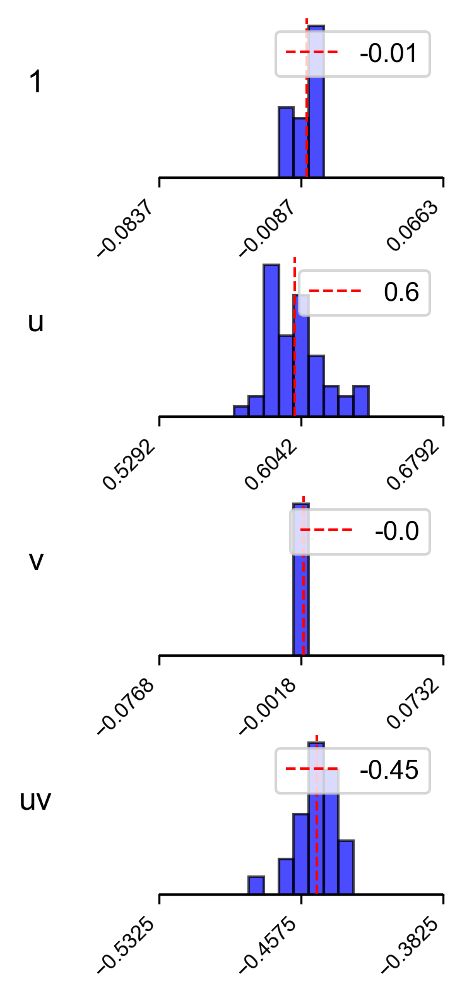

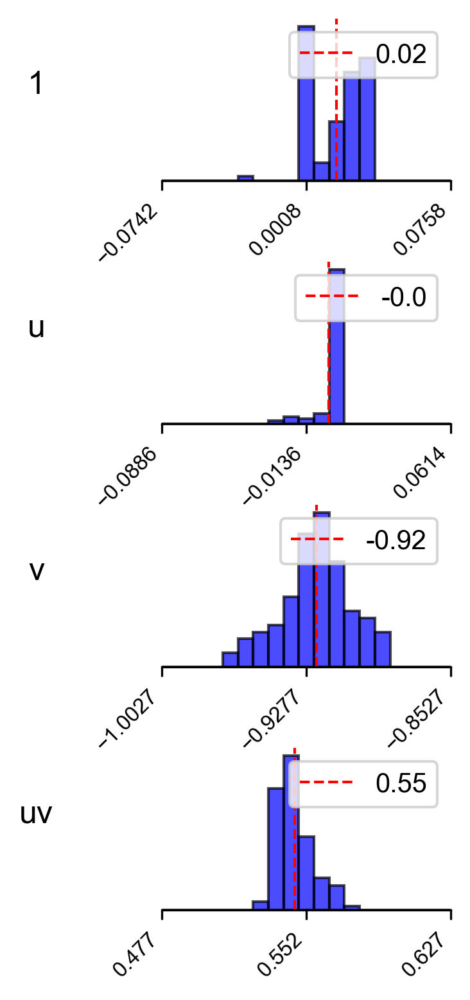

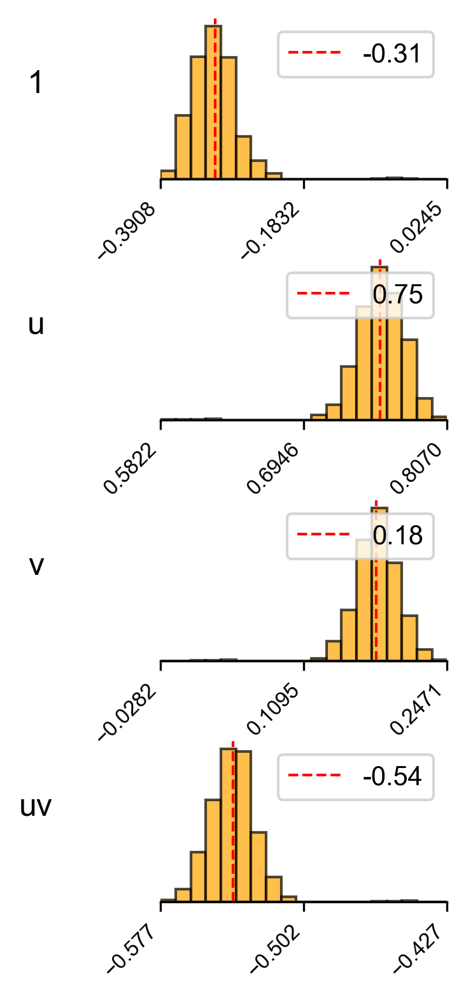

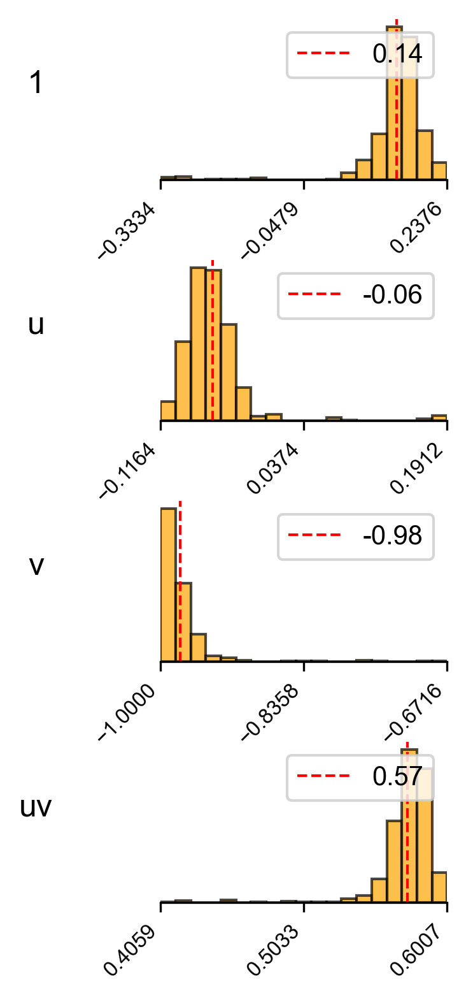

In [90]:
# SIP posterior distribution
titles = ['1', 'u', 'v', 'uv']
mw = 0.15
nb = 20
nx = 3
plot_hist_matrix(x_post_param_samples, titles, color='blue', name = f'', min_width=mw, num_xticks=nx)#, xlim=(-1.5,1.5)) #SIP u_dot

plot_hist_matrix(y_post_param_samples, titles, color='blue', name = '', min_width=mw, num_xticks=nx)#, xlim = (-3,3)) #SIP v_dot


# UQ SINDy posterior distribtuion
titles = ['1', 'u', 'v', 'uv']
plot_hist_matrix(u_Posterior_params, titles, color='orange', name = '', min_width=mw, num_xticks=nx) # xlim=(-1.5,1.5)) #Bayesian u_dot

plot_hist_matrix(v_Posterior_params, titles, color='orange', name = '', min_width=mw, num_xticks=nx) # xlim = (-3,3)) #Bayesian v_dot',

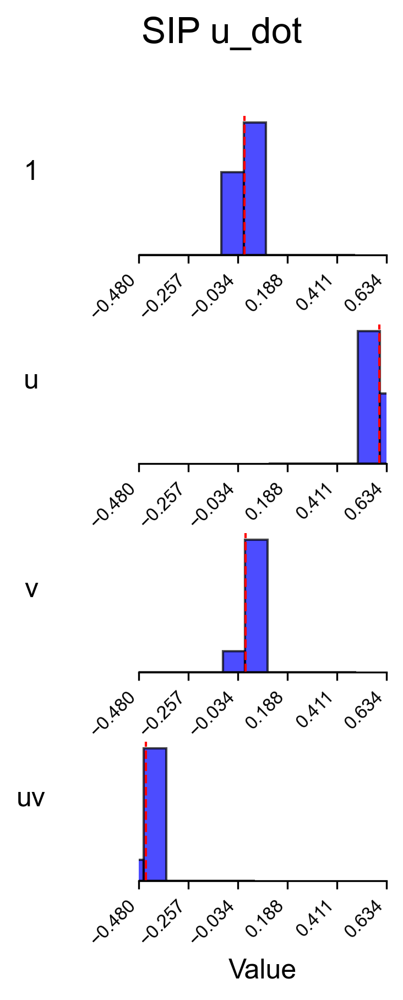

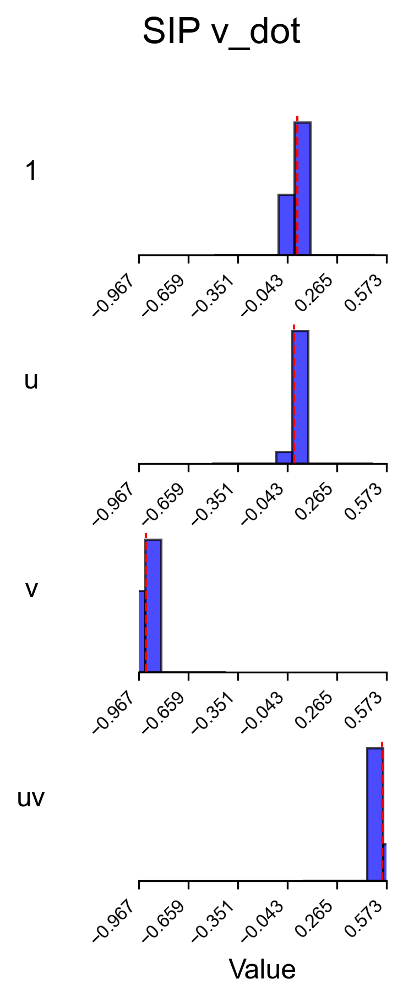

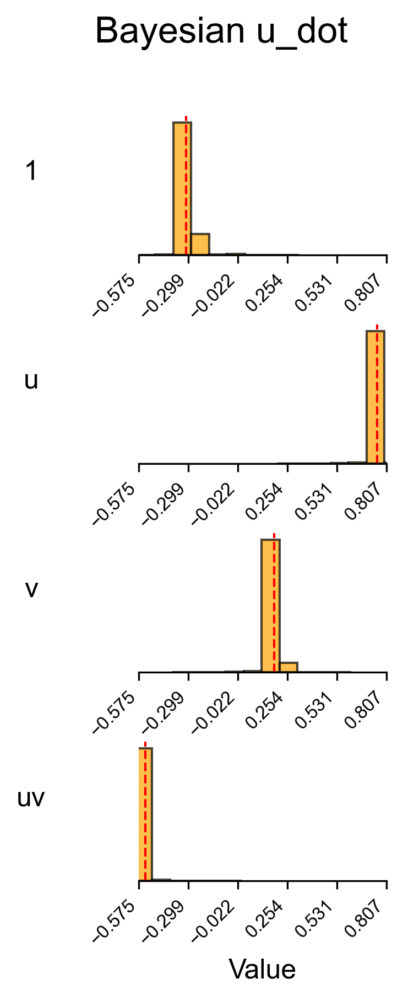

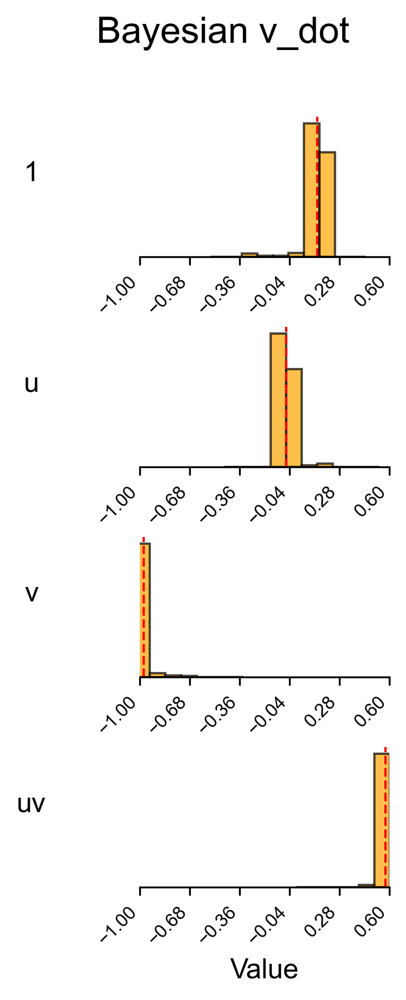

In [92]:
# SIP posterior distribution
titles = ['1', 'u', 'v', 'uv']
mw = 1
nb = 10
nx = 6
plot_hist_matrix_wide(x_post_param_samples, titles, color='blue', name = 'SIP u_dot', min_width=mw, num_bins=nb, num_xticks=nx)#, xlim=(-1.5,1.5))

plot_hist_matrix_wide(y_post_param_samples, titles, color='blue', name = 'SIP v_dot', min_width=mw, num_bins=nb, num_xticks=nx)#, xlim = (-3,3))


# UQ SINDy posterior distribtuion
titles = ['1', 'u', 'v', 'uv']
plot_hist_matrix_wide(u_Posterior_params, titles, color='orange', name = 'Bayesian u_dot', min_width=mw, num_bins=nb, num_xticks=nx) # xlim=(-1.5,1.5))

plot_hist_matrix_wide(v_Posterior_params, titles, color='orange', name = 'Bayesian v_dot', min_width=mw, num_bins=nb, num_xticks=nx) # xlim = (-3,3))

In [93]:
def sim_lynx_hare(params):
    a,b,g,d = params
    params = (a,b,d,g)
    solution = odeint(lotka_volterra_system, initial_state, time, args=params)
    u_sim, v_sim = solution.T
    u_sim,v_sim = u_sim*u_scale, v_sim*v_scale
    return u_sim, v_sim

def recovered_lv(state, t, u_params,v_params):
    u,v = state
    a0,b0,c0,d0 = u_params
    a1,b1,c1,d1 = v_params    
    du_dt = a0*1 + b0*u + c0*v + d0*u*v
    dv_dt = a1*1 + b1*u + c1*v + d1*u*v
    return [du_dt, dv_dt]

def simulate_recovered_params(u_params,v_params):
    solution = odeint(recovered_lv, initial_state, time, args=(u_params, v_params,))
    u_sim, v_sim = solution.T
    u_sim,v_sim = u_sim*u_scale, v_sim*v_scale
    return u_sim,v_sim

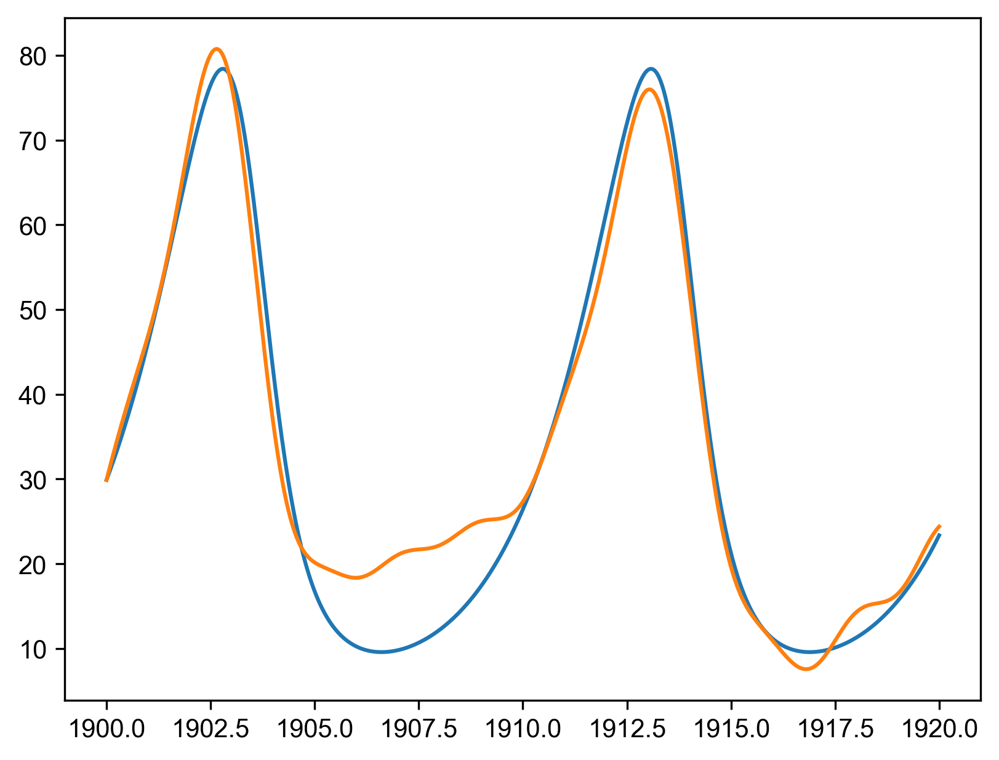

In [96]:
# true parameters
u_true = [0,0.55,0,-0.455]
v_true  = [0,0,-0.84,0.5433]
u_tmp, v_tmp = simulate_recovered_params(u_true,v_true)

# SIP posterior path plot
plt.plot(time, u_tmp)
plt.plot(time, u_data)
plt.show()

SIP u_mse = 136.84624630958052
SIP v_mse = 87.54631383903106


UQ u_mse = 1084.8703757362034
UQ v_mse = 592.9403890806446


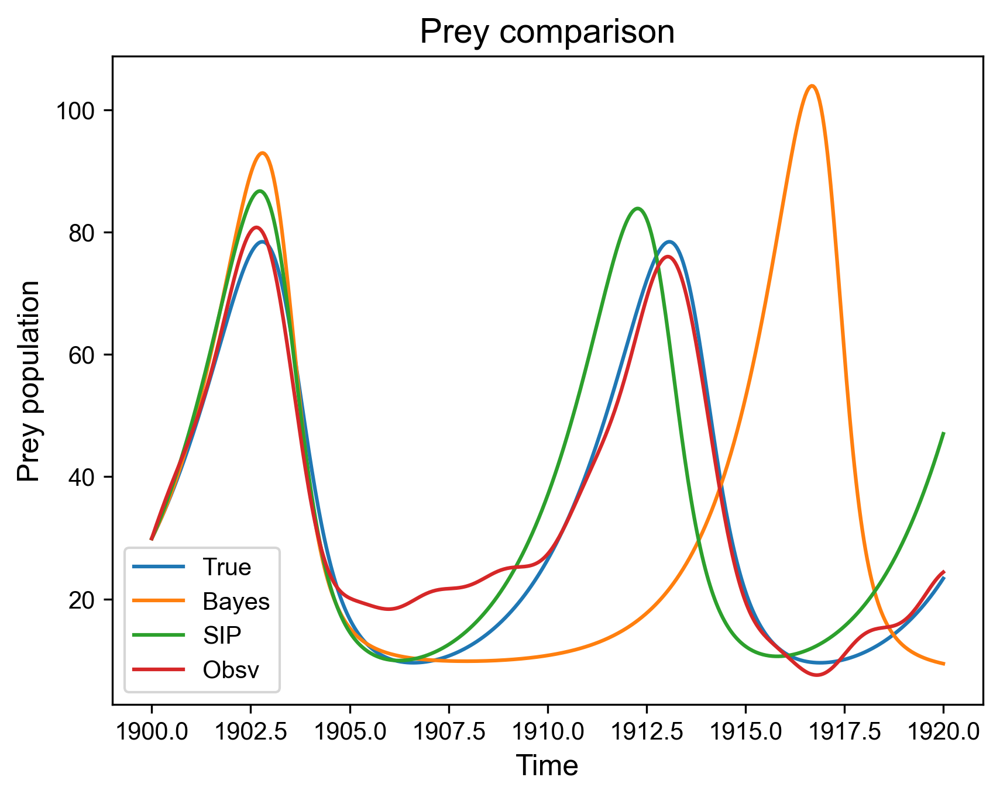

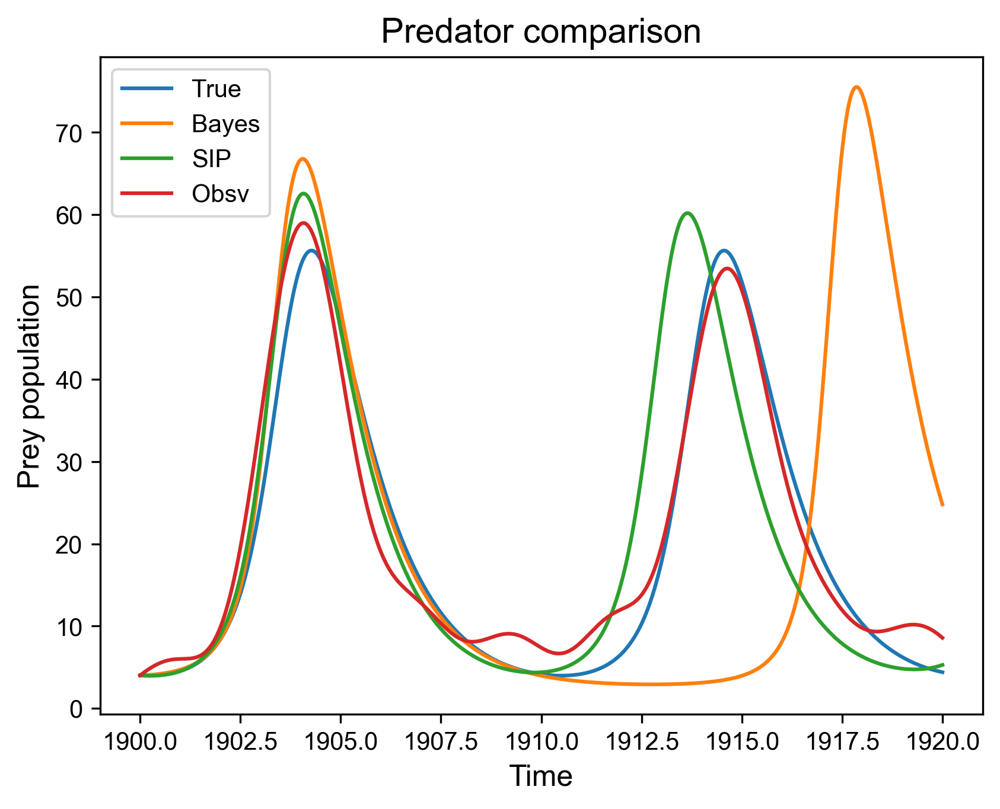

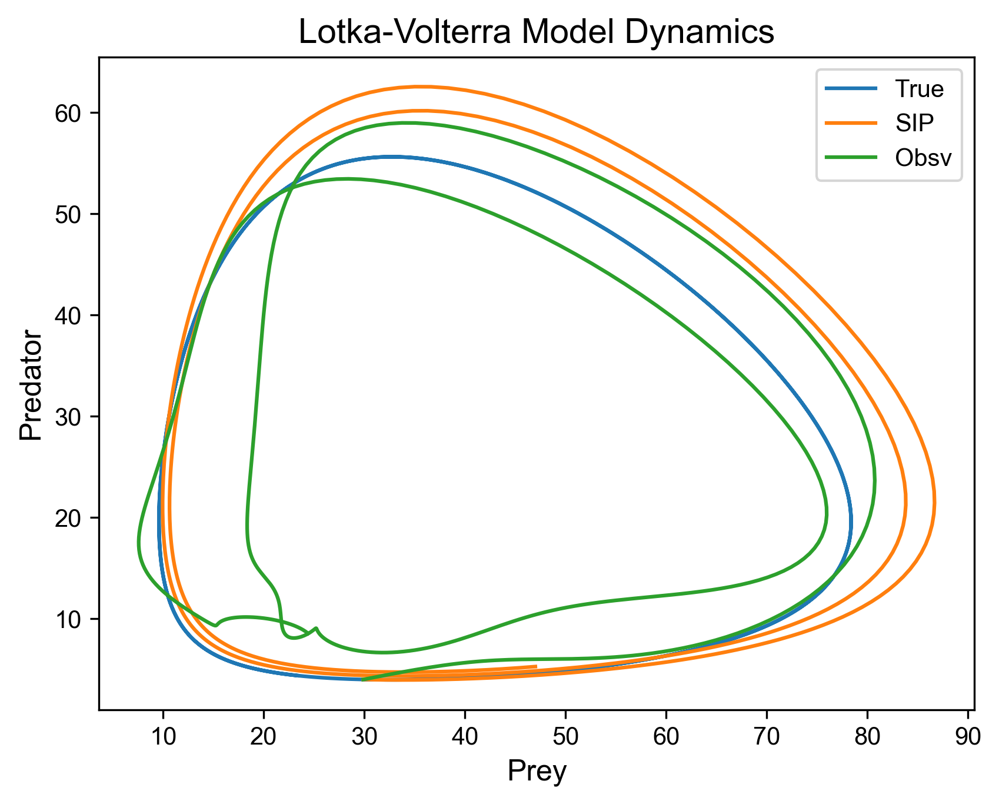

In [98]:
# SIP SINDy posterior simulation
u_postmean_sip = calc_mean(x_post_param_samples)
v_postmean_sip = calc_mean(y_post_param_samples)

u_post_sip, v_post_sip = simulate_recovered_params(u_postmean_sip,v_postmean_sip)
# u_post_sip, v_post_sip = u_post_sip*u_scale, v_post_sip*v_scale

print(f'SIP u_mse = {mean_squared_error(u_sim, u_post_sip)}')
print(f'SIP v_mse = {mean_squared_error(v_sim, v_post_sip)}\n\n')


# UQ SINDy posterior simulation
u_postmean_uq = calc_mean(u_Posterior_params)
v_postmean_uq = calc_mean(v_Posterior_params)

u_post_uq, v_post_uq = simulate_recovered_params(u_postmean_uq,v_postmean_uq)
# u_post_uq, v_post_uq = u_post_uq*u_scale, v_post_uq*v_scale

print(f'UQ u_mse = {mean_squared_error(u_sim, u_post_uq)}')
print(f'UQ v_mse = {mean_squared_error(v_sim, v_post_uq)}')


# plot and compare simulation versus observed data
plt.figure()
plt.title('Prey comparison')
plt.plot(t, u_sim, label='True')
plt.plot(t, u_post_uq, label='Bayes')
plt.plot(t, u_post_sip, label='SIP')
plt.plot(t, u_data, label='Obsv')
plt.xlabel('Time')
plt.ylabel('Prey population')
plt.legend()
plt.show()

plt.figure()
plt.title('Predator comparison')
plt.plot(t, v_sim, label='True')
plt.plot(t, v_post_uq, label='Bayes')
plt.plot(t, v_post_sip, label='SIP')
plt.plot(t, v_data, label='Obsv')
plt.xlabel('Time')
plt.ylabel('Prey population')
plt.legend()
plt.show()

plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
plt.plot(u_sim, v_sim, label='True')
# plt.plot(u_post_uq, v_post_uq, label='Bayes')
plt.plot(u_post_sip, v_post_sip, label='SIP')
plt.plot(u_data, v_data, label='Obsv')
plt.xlabel('Prey')
plt.ylabel('Predator')
plt.legend()
plt.show()

In [100]:
# true parameters
u_true = [0,0.55,0,-0.455]
v_true  = [0,0,-0.84,0.5433]

# mean path (mp) recovery
u_sip_mp = u_postmean_sip
u_bayes_mp  = u_postmean_uq

v_sip_mp  = v_postmean_sip 
v_bayes_mp  = v_postmean_uq 

u_recv_params = [u_sip_mp, u_bayes_mp, v_sip_mp, v_bayes_mp]
true_params = [u_true,u_true,v_true,v_true]
u_names = ['u_sip_mp', 'u_bayes_mp', 'v_sip_mp', 'v_bayes_mp']
for i,u_rcv in enumerate(u_recv_params):
    print(f'MSE {u_names[i]} = {np.sqrt(mean_squared_error(true_params[i], u_rcv)).round(5)}')

MSE u_sip_mp = 0.02578
MSE u_bayes_mp = 0.21104
MSE v_sip_mp = 0.04204
MSE v_bayes_mp = 0.10298


In [102]:
from tqdm import tqdm
# SIP posterior path simulation
u_sip_post_paths = []
v_sip_post_paths = []
lent = min(len(x_post_param_samples), len(y_post_param_samples), 300)
for i in tqdm(range(lent)):
    u_param_i = x_post_param_samples[i]
    v_param_i = y_post_param_samples[i]
    u_tmp, v_tmp = simulate_recovered_params(u_param_i,v_param_i)
    if mean_squared_error(u_sim, u_tmp) <= 2000:
        u_sip_post_paths.append(u_tmp)
    if mean_squared_error(v_sim, v_tmp) <= 2000:
        v_sip_post_paths.append(v_tmp)
        
u_sip_post_paths = np.array(u_sip_post_paths)
v_sip_post_paths = np.array(v_sip_post_paths)

# Bayes posterior path simulation
u_uq_post_paths = []
v_uq_post_paths = []
lent = min(len(u_Posterior_params), len(v_Posterior_params), 300)
for i in tqdm(range(lent)):
    u_param_i = u_Posterior_params[i]
    v_param_i = v_Posterior_params[i]
    u_tmp, v_tmp = simulate_recovered_params(u_param_i,v_param_i)
    if mean_squared_error(u_sim, u_tmp) <= 2000:
        u_uq_post_paths.append(u_tmp)
    if mean_squared_error(v_sim, v_tmp) <= 2000:
        v_uq_post_paths.append(v_tmp)
u_uq_post_paths=np.array(u_uq_post_paths)
v_uq_post_paths=np.array(v_uq_post_paths)

  0%|                                                                                           | 0/52 [00:00<?, ?it/s]C:\Users\rolabiyi\.conda\envs\pd_env\lib\site-packages\scipy\integrate\_odepack_py.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
100%|███████████████████████████████████████████████████████████████████████████████| 300/300 [00:00<00:00, 558.31it/s]


SIP u_mse = 11.061752878886377
SIP v_mse = 8.86177426882499


UQ u_mse = 10.744000020641876
UQ v_mse = 9.691033663757805


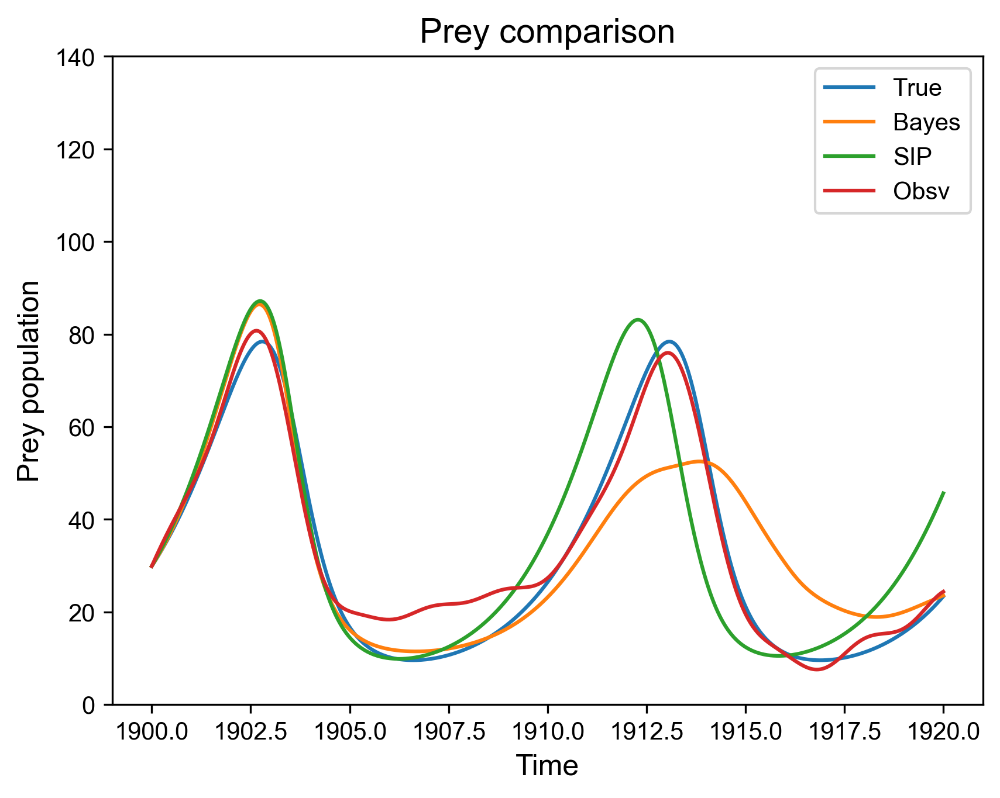

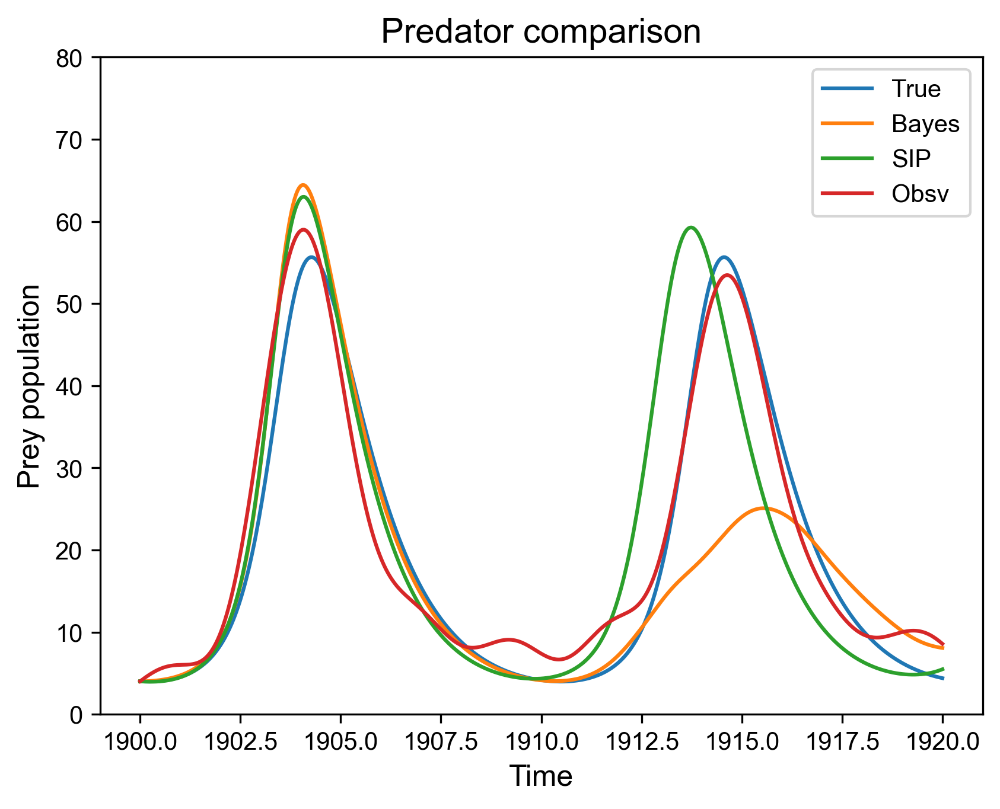

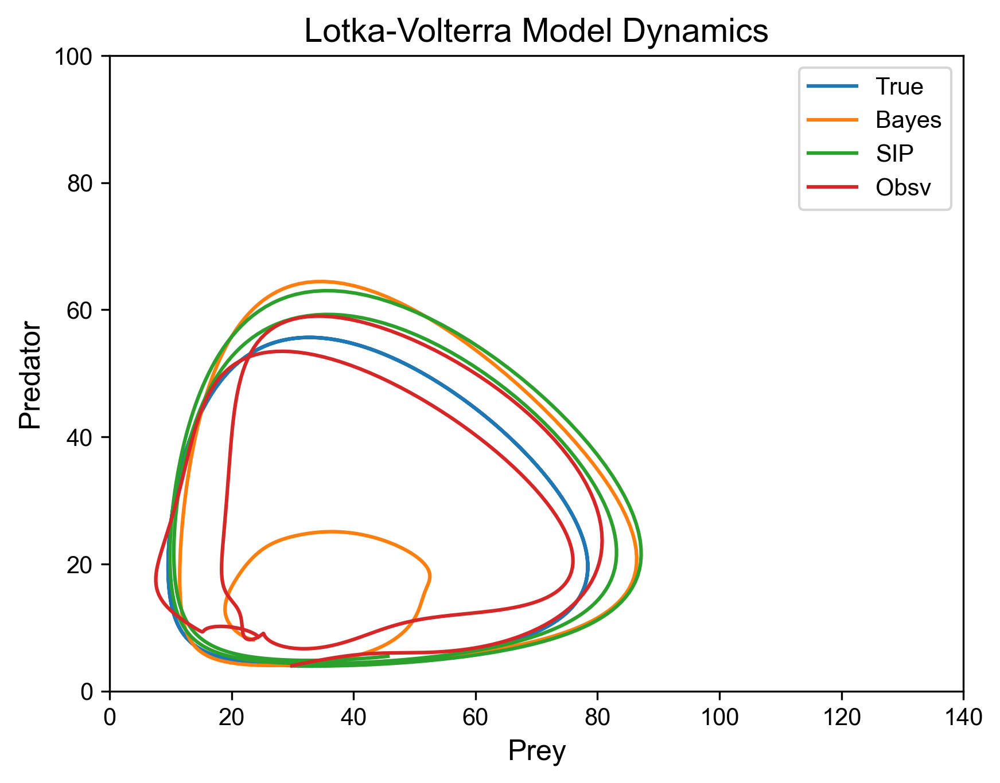

In [104]:
u_post_meanpath_sip = np.mean(u_sip_post_paths,0)
v_post_meanpath_sip = np.mean(v_sip_post_paths,0)

u_post_meanpath_uq = np.mean(u_uq_post_paths,0)
v_post_meanpath_uq = np.mean(v_uq_post_paths,0)

print(f'SIP u_mse = {np.sqrt(mean_squared_error(u_sim, u_post_meanpath_sip))}')
print(f'SIP v_mse = {np.sqrt(mean_squared_error(v_sim, v_post_meanpath_sip))}\n\n')

print(f'UQ u_mse = {np.sqrt(mean_squared_error(u_sim, u_post_meanpath_uq))}')
print(f'UQ v_mse = {np.sqrt(mean_squared_error(v_sim, v_post_meanpath_uq))}')


# plot and compare simulation versus observed data
plt.figure()
plt.title('Prey comparison')
plt.plot(t, u_sim, label='True')
plt.plot(t, u_post_meanpath_uq, label='Bayes')
plt.plot(t, u_post_meanpath_sip, label='SIP')
plt.plot(t, u_data, label='Obsv')
plt.xlabel('Time')
plt.ylabel('Prey population')
plt.ylim(0,140)
plt.legend()
plt.show()

plt.figure()
plt.title('Predator comparison')
plt.plot(t, v_sim, label='True')
plt.plot(t, v_post_meanpath_uq, label='Bayes')
plt.plot(t, v_post_meanpath_sip, label='SIP')
plt.plot(t, v_data, label='Obsv')
plt.xlabel('Time')
plt.ylabel('Prey population')
plt.ylim(0,80)
plt.legend()
plt.show()

plt.figure()
plt.title('Lotka-Volterra Model Dynamics')
plt.plot(u_sim, v_sim, label='True')
plt.plot(u_post_meanpath_uq, v_post_meanpath_uq, label='Bayes')
plt.plot(u_post_meanpath_sip, v_post_meanpath_sip, label='SIP')
plt.plot(u_data, v_data, label='Obsv')
plt.xlabel('Prey')
plt.ylabel('Predator')
plt.ylim(0,100)
plt.xlim(0,140)
plt.legend()
plt.show()

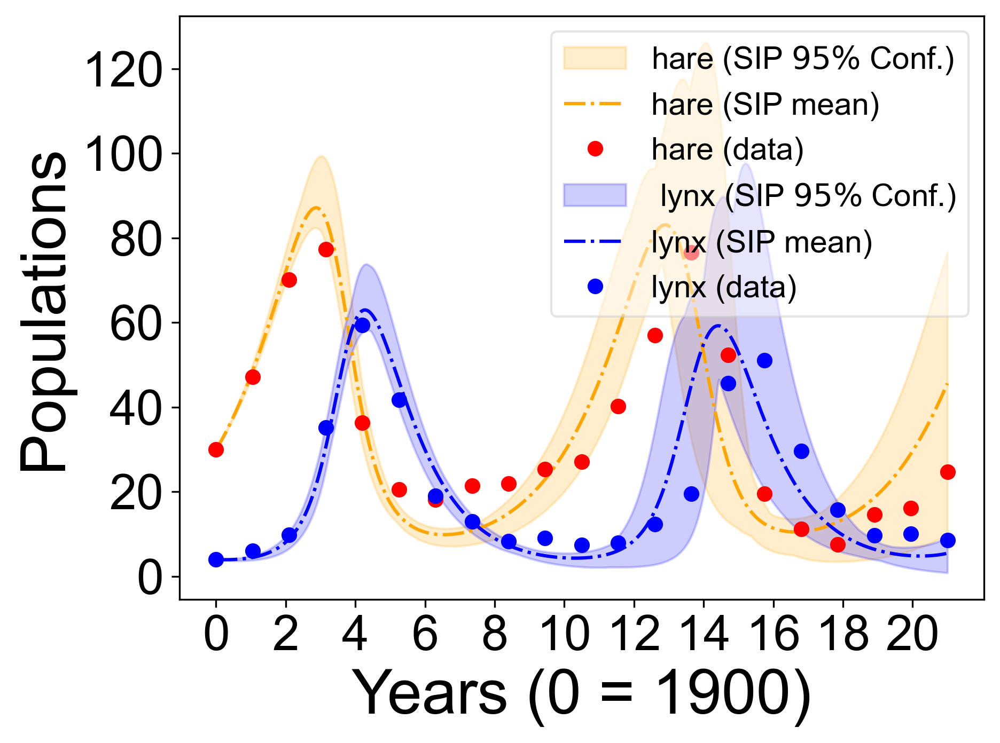

In [105]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming u_sip_post_paths is a list of arrays, where each array contains paths for each time step.
# t is the array of time steps.

# Convert u_sip_post_paths to a numpy array for easier manipulation
u_sip_post_paths = np.array(u_sip_post_paths)

# Calculate the maximum and minimum values at each time step
u_max = np.max(u_sip_post_paths, axis=0)
u_min = np.min(u_sip_post_paths, axis=0)

# Visualize paths with confidence bounds
plt.figure()
# plt.title('Lotka-Volterra Model Dynamics')

# Plot the filled confidence bounds
plt.fill_between(np.linspace(0,years__.shape[0],t.shape[0]), u_min, u_max, color='orange', alpha=0.2, label=f'hare (SIP $95\%$ Conf.)')

# Plot the mean path
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_post_meanpath_sip, color = 'orange', linestyle = '-.', label='hare (SIP mean)')

# Plot observed data
plt.plot(np.linspace(0,years__.shape[0],years_.shape[0]), hare, 'ro', label='hare (data)')
# plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_sim, color = 'green', label='hare (Ground truth))')


# Assuming v_sip_post_paths is a list of arrays, where each array contains paths for each time step.
# t is the array of time steps.

# Convert v_sip_post_paths to a numpy array for easier manipulation
v_sip_post_paths = np.array(v_sip_post_paths)

# Calculate the maximum and minimum values at each time step
v_max_sip = np.max(v_sip_post_paths, axis=0)
v_min_sip = np.min(v_sip_post_paths, axis=0)

# Visualize paths with confidence bounds
# plt.figure()
# plt.title('Lotka-Volterra Model Dynamics')

# Plot the filled confidence bounds
plt.fill_between(np.linspace(0,years__.shape[0],t.shape[0]), v_min_sip, v_max_sip, color='blue', alpha=0.2, label=f' lynx (SIP $95\%$ Conf.)')

# Plot the mean path
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_post_meanpath_sip, 'b-.', label='lynx (SIP mean)')

# Plot observed data
plt.plot(np.linspace(0,years__.shape[0],years_.shape[0]), lynx, 'bo', label='lynx (data)')
# plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_sim, color = 'green', label='lynx (Ground truth))')

# Customize the plot
plt.legend(framealpha=0.3)
plt.xlabel('Years (0 = 1900)', fontsize=28)
plt.ylabel('Populations', fontsize=28)


# Ensure x-ticks are integers
plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 2))

# Set font size for ticks
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

# Set the legend font size to be the same as the xlabel (18)
plt.legend(fontsize=14, loc='upper right', framealpha=0.5)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

# plt.xticks(rotation=45, fontsize=14)
# plt.yticks(fontsize=14)

# # Adjust layout to ensure everything is visible
# plt.tight_layout()
# plt.legend()
# plt.show()

# # Customize the plot
# plt.legend()
# plt.xlabel('Years', fontsize=18)
# plt.ylabel('Populations', fontsize=18)
# plt.xticks(rotation=45, fontsize=14)
# plt.yticks(fontsize=14)

# # Adjust layout to ensure everything is visible
# plt.tight_layout()
# plt.show()

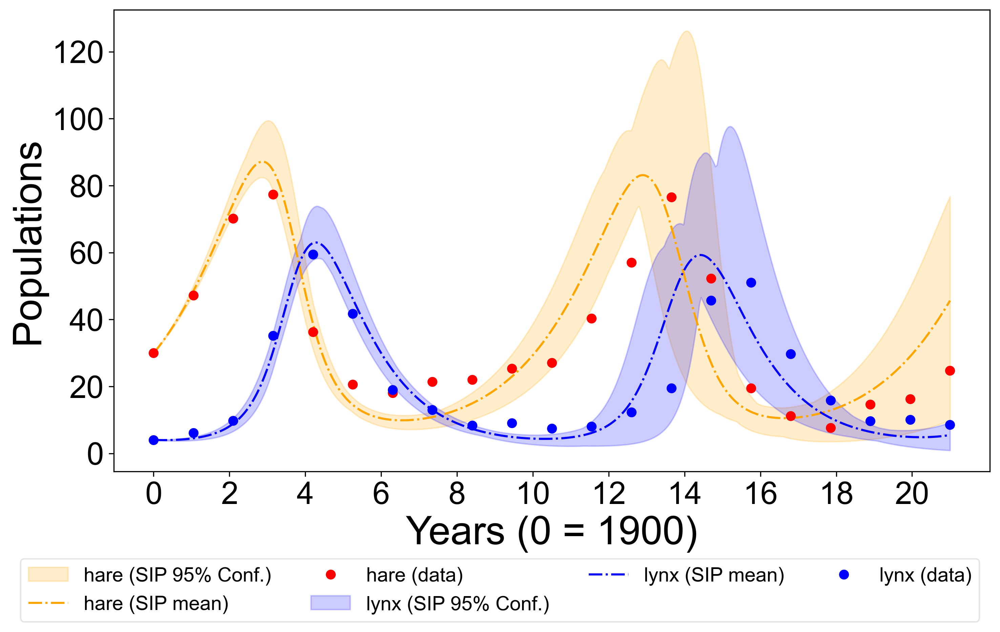

In [107]:
# Visualize paths with confidence bounds
fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)

# Hare (SIP)
x = np.linspace(0, years__.shape[0], t.shape[0])
ax.fill_between(x, u_min, u_max, color='orange', alpha=0.2, label='hare (SIP 95% Conf.)')
ax.plot(x, u_post_meanpath_sip, '-.', color='orange', label='hare (SIP mean)')
ax.plot(np.linspace(0, years__.shape[0], years_.shape[0]), hare, 'ro', label='hare (data)')

# Lynx (SIP)
v_paths = np.array(v_sip_post_paths)
v_min_sip, v_max_sip = v_paths.min(axis=0), v_paths.max(axis=0)
ax.fill_between(x, v_min_sip, v_max_sip, color='blue', alpha=0.2, label='lynx (SIP 95% Conf.)')
ax.plot(x, v_post_meanpath_sip, 'b-.', label='lynx (SIP mean)')
ax.plot(np.linspace(0, years__.shape[0], years_.shape[0]), lynx, 'bo', label='lynx (data)')

# Axes labels and ticks
ax.set_xlabel('Years (0 = 1900)', fontsize=28)
ax.set_ylabel('Populations',     fontsize=28)
ax.set_xticks(np.arange(min(years__), max(years__)+1, 2))
ax.tick_params(axis='both', labelsize=22)

# Collect handles & labels once
handles, labels = ax.get_legend_handles_labels()

# Place a single legend below the axes
fig.legend(
    handles, labels,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.05),  # tweak the second value to move up/down
    ncol=4,                      # split into 4 columns
    fontsize=14,
    framealpha=0.5
)

# Make room for the legend
fig.tight_layout(rect=[0, 0.05, 1, 1])

plt.show()


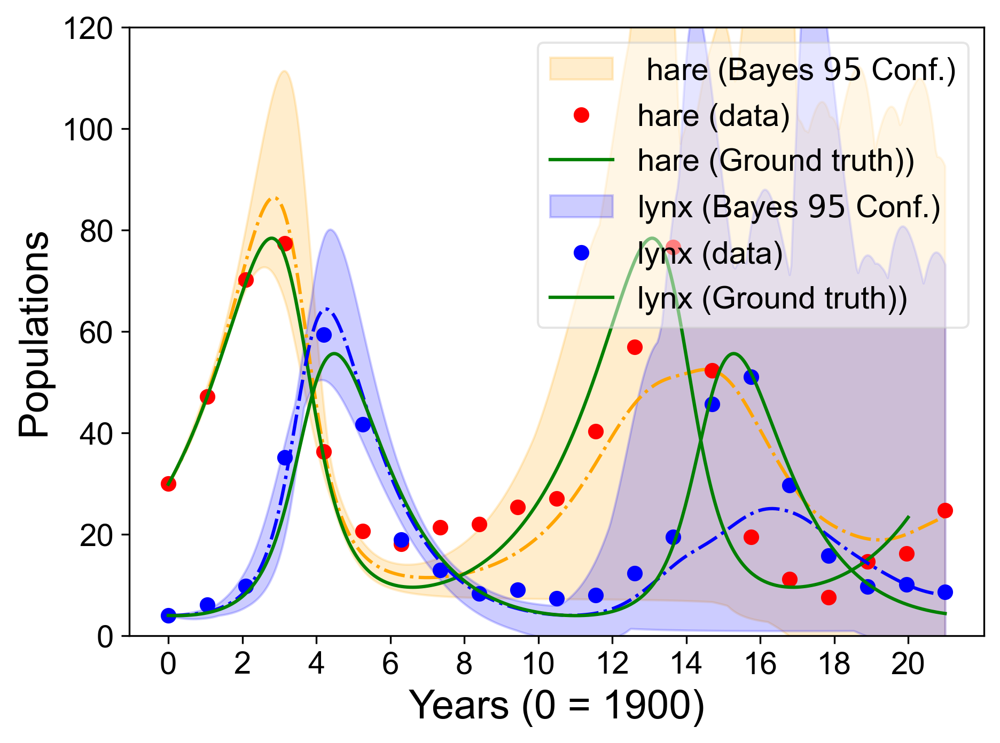

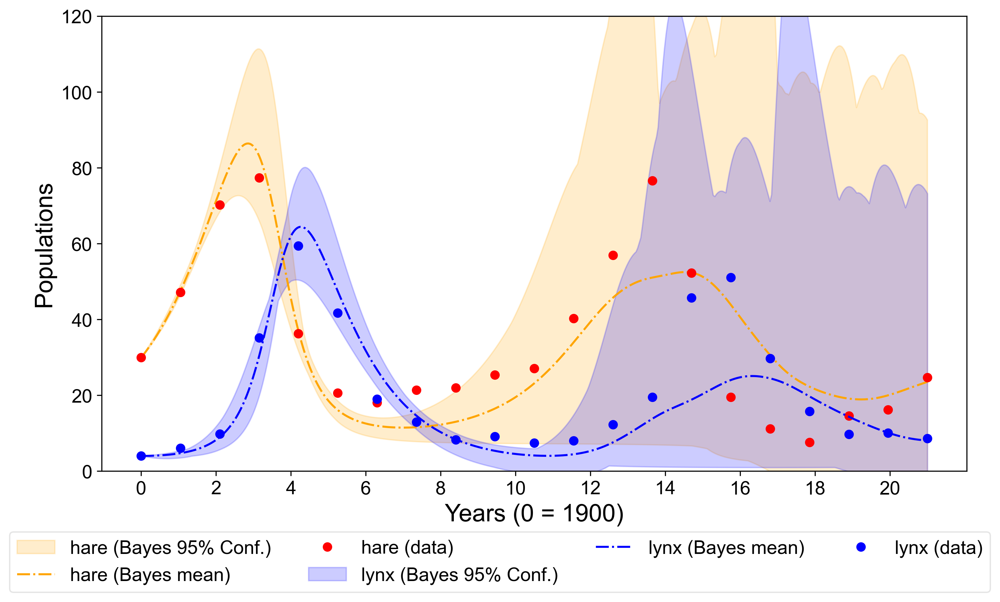

In [108]:
#Bayes Plot


# Assuming u_uq_post_paths is a list of arrays, where each array contains paths for each time step.
# t is the array of time steps.

# Convert u_uq_post_paths to a numpy array for easier manipulation
u_uq_post_paths = np.array(u_uq_post_paths)

# Calculate the maximum and minimum values at each time step
u_max_uq = np.max(u_uq_post_paths, axis=0)
u_min_uq = np.min(u_uq_post_paths, axis=0)

# Visualize paths with confidence bounds
plt.figure()
# plt.title('Lotka-Volterra Model Dynamics')

# Plot the filled confidence bounds
plt.fill_between(np.linspace(0,years__.shape[0],t.shape[0]), u_min_uq, u_max_uq, color='orange', alpha=0.2, label=f' hare (Bayes $95$ Conf.)')

# Plot the mean path
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_post_meanpath_uq, color = 'orange', linestyle = '-.')#, label='hare (Bayes mean)')

# Plot observed data
plt.plot(np.linspace(0,years__.shape[0],years_.shape[0]), hare, 'ro', label='hare (data)')
plt.plot(np.linspace(0,years__[-1],t.shape[0]), u_sim, color = 'green', label='hare (Ground truth))')




# Assuming v_uq_post_paths is a list of arrays, where each array contains paths for each time step.
# t is the array of time steps.

# Convert v_uq_post_paths to a numpy array for easier manipulation
v_uq_post_paths = np.array(v_uq_post_paths)

# Calculate the maximum and minimum values at each time step
v_max_uq = np.max(v_uq_post_paths, axis=0)
v_min_uq = np.min(v_uq_post_paths, axis=0)

# Visualize paths with confidence bounds
# plt.figure()
# plt.title('Lotka-Volterra Model Dynamics')

# Plot the filled confidence bounds
plt.fill_between(np.linspace(0,years__.shape[0],t.shape[0]), v_min_uq, v_max_uq, color='blue', alpha=0.2, label=f'lynx (Bayes $95$ Conf.)')

# Plot the mean path
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_post_meanpath_uq, 'b-.')#, label='lynx (Bayes mean)')

# Plot observed data
plt.plot(np.linspace(0,years__.shape[0],years_.shape[0]), lynx, 'bo', label='lynx (data)')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_sim, color = 'green', label='lynx (Ground truth))')

# Customize the plot
plt.legend(framealpha=0.5)
plt.ylim(0, 120)
plt.xlabel('Years (0 = 1900)', fontsize=18)
plt.ylabel('Populations', fontsize=18)
# plt.xticks(rotation=45, fontsize=14)
# plt.yticks(fontsize=14)

# Ensure x-ticks are integers
plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 2))

# Set font size for ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set the legend font size to be the same as the xlabel (18)
plt.legend(fontsize=14, loc='upper right', framealpha=0.5)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

# Create single figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# X‐axis values
x = np.linspace(0, years__.shape[0], t.shape[0])
x_data = np.linspace(0, years__.shape[0], years_.shape[0])

# Hare (Bayesian)
ax.fill_between(x, u_min_uq, u_max_uq, color='orange', alpha=0.2, label='hare (Bayes 95% Conf.)')
ax.plot(x, u_post_meanpath_uq, '-.', color='orange', label='hare (Bayes mean)')
ax.plot(x_data, hare, 'ro', label='hare (data)')
# ax.plot(x, u_sim, color='green', label='hare (Ground truth)')

# Lynx (Bayesian)
v_paths = np.array(v_uq_post_paths)
v_min_uq = v_paths.min(axis=0)
v_max_uq = v_paths.max(axis=0)

ax.fill_between(x, v_min_uq, v_max_uq, color='blue', alpha=0.2, label='lynx (Bayes 95% Conf.)')
ax.plot(x, v_post_meanpath_uq, 'b-.', label='lynx (Bayes mean)')
ax.plot(x_data, lynx, 'bo', label='lynx (data)')
# ax.plot(x, v_sim,  color='green', label='lynx (Ground truth)')

# Axis labels, limits, and ticks
ax.set_xlabel('Years (0 = 1900)', fontsize=18)
ax.set_ylabel('Populations', fontsize=18)
ax.set_ylim(0, 120)
ax.set_xticks(np.arange(min(years__), max(years__) + 1, 2))
ax.tick_params(axis='both', labelsize=14)

# Gather handles & labels once
handles, labels = ax.get_legend_handles_labels()

# Place single legend below plot
fig.legend(handles, labels,
           loc='lower center',
           bbox_to_anchor=(0.5, -0.05),
           ncol=4,
           fontsize=14,
           framealpha=0.5)

# Adjust layout to make room for the legend
fig.tight_layout(rect=[0, 0.05, 1, 1])

plt.show()


In [130]:
import numpy as np
import matplotlib.pyplot as plt

# Assume your data arrays (years__, t, u_min, u_max, u_post_meanpath_sip,
# hare, v_sip_post_paths, v_post_meanpath_sip, lynx, 
# u_min_uq, u_max_uq, u_post_meanpath_uq, v_uq_post_paths, v_post_meanpath_uq, 
# u_sim, v_sim) are already defined

# Create 1×2 subplots
fig, axes = plt.subplots(1, 2, figsize=(24, 8), dpi=600)

# Common x‑axis values
x = np.linspace(0, years__.shape[0], t.shape[0])
x_data = np.linspace(0, years__.shape[0], years_.shape[0])

# --- Left: SIP Results ---
ax = axes[0]
ax.fill_between(x, u_min, u_max,
                color='orange', alpha=0.2,
                label='hare (SIP 95% Conf.)')
ax.plot(x, u_post_meanpath_sip,
        '-.', color='orange',
        label='hare (SIP mean)')
ax.plot(x_data, hare,
        'ro', label='hare (data)')

v_paths = np.array(v_sip_post_paths)
v_min_sip, v_max_sip = v_paths.min(axis=0), v_paths.max(axis=0)
ax.fill_between(x, v_min_sip, v_max_sip,
                color='blue', alpha=0.2,
                label='lynx (SIP 95% Conf.)')
ax.plot(x, v_post_meanpath_sip,
        'b-.', label='lynx (SIP mean)')
ax.plot(x_data, lynx,
        'bo', label='lynx (data)')

ax.set_title('(a) SIP', fontsize=28) #Recovery
ax.set_xlabel('Years (0 = 1900)', fontsize=28)
ax.set_ylabel('Populations', fontsize=28)
ax.set_xticks(np.arange(min(years__), max(years__)+1, 2))
ax.tick_params(axis='both', labelsize=26)

# --- Right: UQ-SINDyian (UQ) Results ---
ax = axes[1]
ax.fill_between(x, u_min_uq, u_max_uq,
                color='purple', alpha=0.2,
                linestyle='--',
                label='hare (UQ-SINDy 95% Conf.)')
ax.plot(x, u_post_meanpath_uq,
        '--', color='purple',
        label='hare (UQ-SINDy mean)')
ax.plot(x_data, hare,'ro')  # square marker to distinguish

v_uq = np.array(v_uq_post_paths)
v_min_uq, v_max_uq = v_uq.min(axis=0), v_uq.max(axis=0)
ax.fill_between(x, v_min_uq, v_max_uq,
                color='green', alpha=0.2,
                linestyle='--',
                label='lynx (UQ-SINDy 95% Conf.)')
ax.plot(x, v_post_meanpath_uq,
        '--', color='green',
        label='lynx (UQ-SINDy mean)')
ax.plot(x_data, lynx, 'bo')  # square marker

ax.set_title('(b) UQ-SINDy', fontsize=28) #Recovery
ax.set_xlabel('Years (0 = 1900)', fontsize=28)
ax.set_ylabel('Populations', fontsize=28)
ax.set_ylim(0, 120)
ax.set_xticks(np.arange(min(years__), max(years__)+1, 2))
ax.tick_params(axis='both', labelsize=26)

# Collect legend handles & labels from both axes
handles, labels = [], []
for ax in axes:
    h, l = ax.get_legend_handles_labels()
    handles += h
    labels  += l

# Place one combined legend below subplots
fig.legend(handles, labels,
           loc='lower center',
           bbox_to_anchor=(0.523, -0.2),
           ncol=4,
           fontsize=26,
           framealpha=0.5)

# Adjust layout to make room for the legend
fig.tight_layout(rect=[0, 0.05, 1, 1])

plt.show()


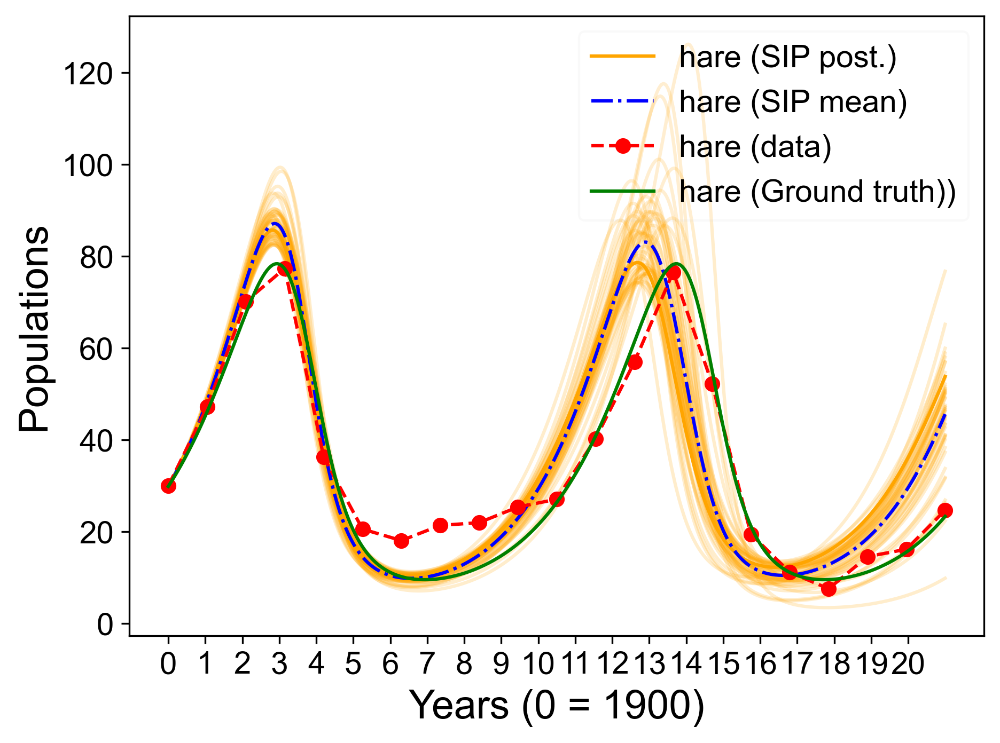

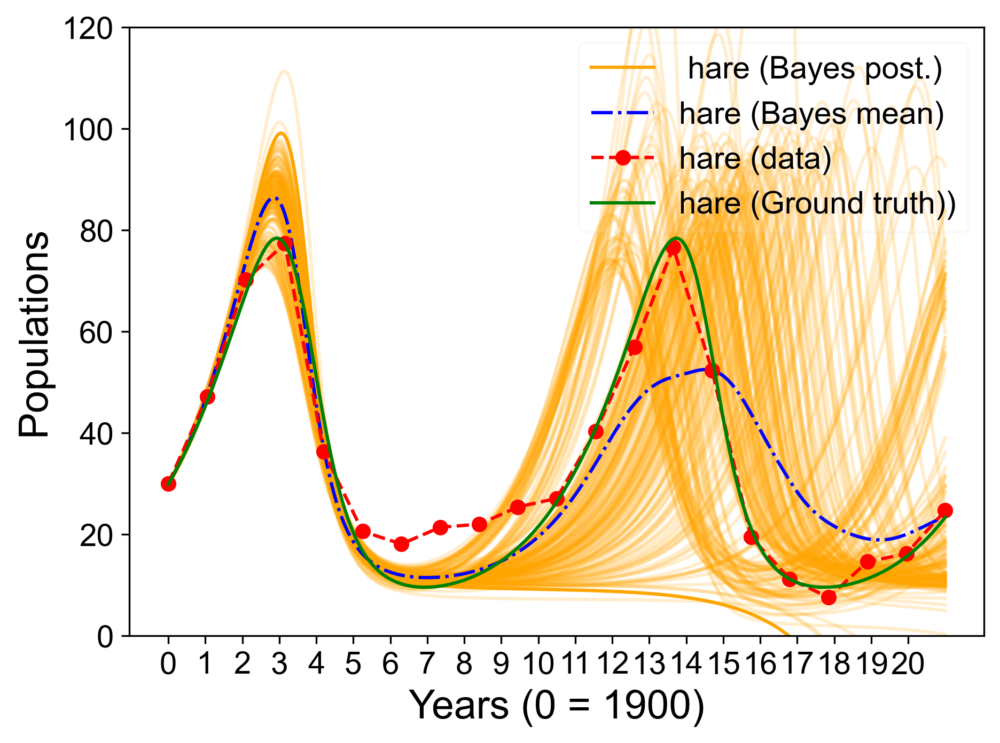

In [112]:
# Visualize paths
plt.figure()
# plt.title('Lotka-Volterra Model Dynamics')
for i in range(len(u_sip_post_paths)):
    yn = u_sip_post_paths[i]
    plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), yn, color = 'orange', alpha = 0.2)
# plt.plot(t, u_sim, 'b-.', label='True')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), yn, color = 'orange', alpha = 1.0, label='hare (SIP post.)')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_post_meanpath_sip, 'b-.', label='hare (SIP mean)')
# plt.plot(t, u_data, 'r-',label='Obsvd data')

plt.plot(np.linspace(0,years__.shape[0],years_.shape[0]), hare, 'r--o', label='hare (data)')
# plt.plot(years_, x_pred_actual[:, 0], 'b-.', label='hare (Sparse)')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_sim, color = 'green', label='hare (Ground truth))')

plt.legend()
plt.xlabel('Years (0 = 1900)', fontsize=18)#, rotation=45)
plt.ylabel('Populations', fontsize=18)#, rotation=45)
# Ensure x-ticks are integers
plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 1))

# Set font size for ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set the legend font size to be the same as the xlabel (18)
plt.legend(fontsize=14, loc='upper right', framealpha=0.1)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

# # Rotate x-tick values by 45 degrees
# plt.xticks(rotation=45, fontsize=14)
# plt.yticks(fontsize=14)
# # Adjust layout to ensure everything is visible
# plt.tight_layout()
# plt.legend()
# plt.show()

# Visualize paths
plt.figure()
# plt.title('Lotka-Volterra Model Dynamics')
for i in range(len(u_uq_post_paths)):
    yn = u_uq_post_paths[i]
    plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), yn, color = 'orange', alpha = 0.2)
# plt.plot(t, u_sim, 'b-.', label='True')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), yn, color = 'orange', alpha = 1.0, label=' hare (Bayes post.)' )
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_post_meanpath_uq, 'b-.', label='hare (Bayes mean)')
# plt.plot(t, u_data, 'r--o',label='hare (data)')
plt.plot(np.linspace(0,years__.shape[0],years_.shape[0]), hare, 'r--o', label='hare (data)')
# plt.plot(years_, x_pred_actual[:, 1], 'b-.', label='hare (Sparse)')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), u_sim, color = 'green', label='hare (Ground truth))')


plt.legend(fontsize=14)
plt.ylim(0, 120)
plt.xlabel('Years (0 = 1900)', fontsize=18)#, rotation=45)
plt.ylabel('Populations', fontsize=18)#, rotation=45)
# Ensure x-ticks are integers
plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 1))

# Set font size for ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set the legend font size to be the same as the xlabel (18)
plt.legend(fontsize=14, loc='upper right', framealpha=0.1)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

# Rotate x-tick values by 45 degrees
# plt.xticks(rotation=45, fontsize=14)
# plt.yticks(fontsize=14)
# # Adjust layout to ensure everything is visible
# plt.tight_layout()
# plt.legend()
# plt.show()



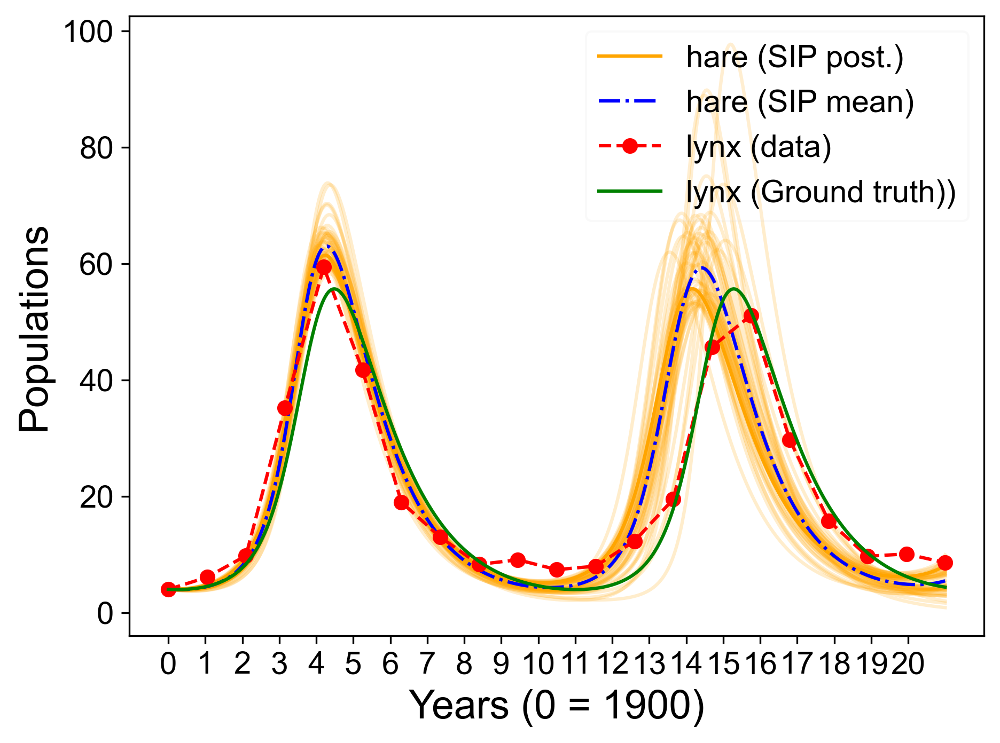

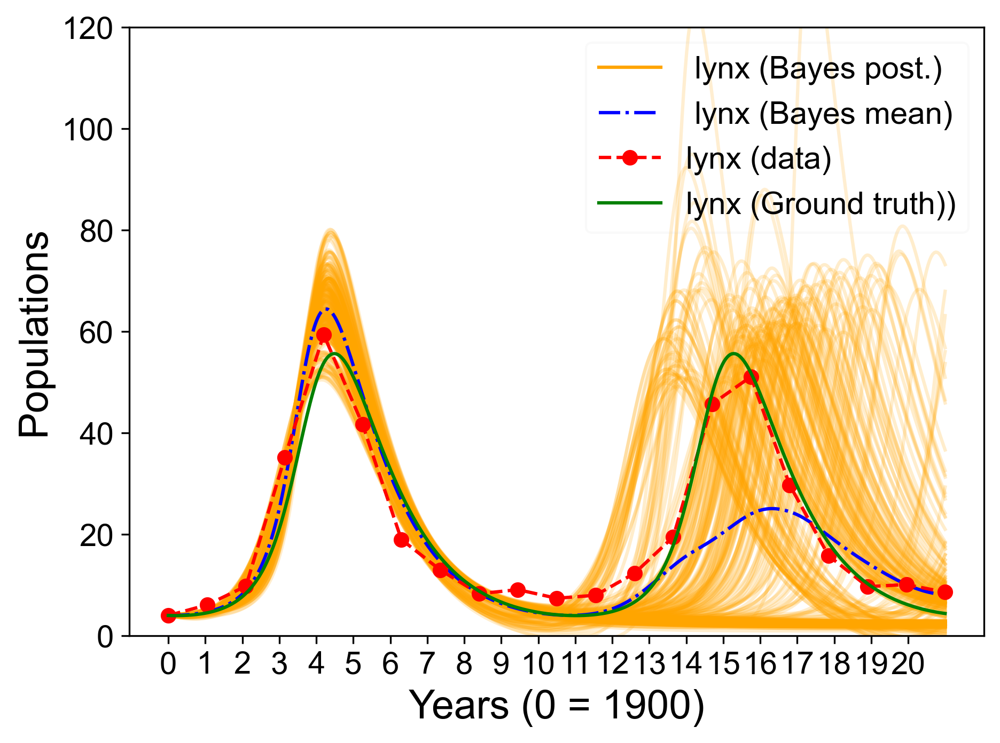

In [114]:
# Visualize paths
plt.figure()
# plt.title('Lotka-Volterra Model Dynamics')
for i in range(len(v_sip_post_paths)):
    yn = v_sip_post_paths[i]
    plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), yn, color = 'orange', alpha = 0.2)
# plt.plot(t, v_sim, 'b-.', label='True')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), yn, color = 'orange', alpha = 1, label='hare (SIP post.)')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_post_meanpath_sip, 'b-.', label='hare (SIP mean)')
# plt.plot(t, v_data, 'r-',label='Obsvd data')

plt.plot(np.linspace(0,years__.shape[0],years_.shape[0]), lynx, 'r--o', label='lynx (data)')
# plt.plot(years_, x_pred_actual[:, 0], 'b-.', label='hare (Sparse)')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_sim, color = 'green', label='lynx (Ground truth))')

plt.legend()
plt.xlabel('Years (0 = 1900)', fontsize=18)#, rotation=45)
plt.ylabel('Populations', fontsize=18)#, rotation=45)
# Ensure x-ticks are integers
plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 1))

# Set font size for ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set the legend font size to be the same as the xlabel (18)
plt.legend(fontsize=14, loc='upper right', framealpha=0.1)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

# # Rotate x-tick values by 45 degrees
# plt.xticks(rotation=45, fontsize=14)
# plt.yticks(fontsize=14)
# # Adjust layout to ensure everything is visible
# plt.tight_layout()
# plt.legend()
# plt.show()

# Visualize paths
plt.figure()
# plt.title('Lotka-Volterra Model Dynamics')
for i in range(len(v_uq_post_paths)):
    yn = v_uq_post_paths[i]
    plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), yn, color = 'orange', alpha = 0.2)
# plt.plot(t, v_sim, 'b-.', label='True')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), yn, color = 'orange', alpha = 1, label=' lynx (Bayes post.)')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_post_meanpath_uq, 'b-.', label=' lynx (Bayes mean)')
# plt.plot(t, v_data, 'r--o',label='lynx (data)')
plt.plot(np.linspace(0,years__.shape[0],years_.shape[0]), lynx, 'r--o', label='lynx (data)')
# plt.plot(years_, x_pred_actual[:, 1], 'b-.', label='lynx (Sparse)')
plt.plot(np.linspace(0,years__.shape[0],t.shape[0]), v_sim, color = 'green', label='lynx (Ground truth))')


plt.legend(fontsize=14)
plt.ylim(0, 120)
plt.xlabel('Years (0 = 1900)', fontsize=18)#, rotation=45)
plt.ylabel('Populations', fontsize=18)#, rotation=45)
# Ensure x-ticks are integers
plt.gca().set_xticks(np.arange(min(years__), max(years__) + 1, 1))

# Set font size for ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set the legend font size to be the same as the xlabel (18)
plt.legend(fontsize=14, loc='upper right', framealpha=0.1)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

# Rotate x-tick values by 45 degrees
# plt.xticks(rotation=45, fontsize=14)
# plt.yticks(fontsize=14)
# # Adjust layout to ensure everything is visible
# plt.tight_layout()
# plt.legend()
# plt.show()



In [116]:
# Calculate the average improvement of a smaller RMSE relative to a larger RMSE.
# The smaller RMSE is assumed to be an improvement over the larger RMSE.

def calculate_rmse_improvement(rmse_big, rmse_small):
  """
  Calculates the average improvement of a smaller RMSE relative to a larger RMSE.

  Args:
    rmse_big: The larger RMSE value.
    rmse_small: The smaller RMSE value.

  Returns:
    The average improvement of the smaller RMSE relative to the larger RMSE.
  """

  # Check that the input RMSE values are valid.
  if rmse_big <= 0 or rmse_small <= 0:
    raise ValueError("RMSE values must be positive.")

  # Calculate the improvement as a percentage.
  improvement = (rmse_big - rmse_small) / rmse_big * 100

  # Return the average improvement.
  return improvement


# Example usage.
rmse_big = 10.0
rmse_small = 5.0
improvement = calculate_rmse_improvement(rmse_big, rmse_small)
print(f"The average improvement of the smaller RMSE is {improvement:.2f}%")

The average improvement of the smaller RMSE is 50.00%


In [117]:
SIP = [0.018,0.069,0.033,0.042,0.022,0.025,0.15,0.08,0.07,70.72,21.63]
SINDy = [9.85, 7.14,8.89,6.43,0.041,0.15,6.16,1.83,1.77,888.87,360.19]
UQSINDy = [0.063,0.074,0.21,0.11,0.052,0.059,4.12,1.57,2.11,367.27,156.19]

incrs_sindy = [calculate_rmse_improvement(SINDy[i], SIP[i]) for i in range(len(SIP))]
incrs_uqsindy = [calculate_rmse_improvement(UQSINDy[i], SIP[i]) for i in range(len(SIP))]

np.mean([np.mean(incrs_sindy),np.mean(incrs_uqsindy)])

81.69223559137347

In [118]:
import numpy as np

# Ground truth values and recovered values for each method (SIP, Sparse, Bayesian)
ground_truth = np.array([[0, 0], [0.55, 0], [0, -0.92], [-0.45, 0.54], [0, 0]])
sip = np.array([[0, 0], [0.6, 0], [0, -0.92], [-0.45, 0.54], [0, 0]])
sparse = np.array([[-0.31, 0.14], [0.49, 0.21], [0, -1.11], [-0.36, 0.31], [0, 0.16]])
bayesian = np.array([[0, 0.14], [0.75, -0.06], [0, -0.98], [-0.54, 0.57], [0, 0.16]])

# Function to calculate RMSE
def calculate_rmse(true_vals, estimated_vals):
    return np.sqrt(np.mean((true_vals - estimated_vals) ** 2))

# Calculate RMSE for each method
rmse_sip = calculate_rmse(ground_truth, sip)
rmse_sparse = calculate_rmse(ground_truth, sparse)
rmse_bayesian = calculate_rmse(ground_truth, bayesian)

# Calculate percentage improvements in RMSE
improvement_vs_bayesian = ((rmse_bayesian - rmse_sip) / rmse_bayesian) * 100
improvement_vs_sparse = ((rmse_sparse - rmse_sip) / rmse_sparse) * 100

rmse_sip, rmse_sparse, rmse_bayesian, improvement_vs_bayesian, improvement_vs_sparse


(0.015811388300841875,
 0.1691449082887215,
 0.10069756700139283,
 84.29814267446683,
 90.65216419411654)